In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
from IPython.display import display, Markdown
import matplotlib.colors as mcolors
from matplotlib.patches import Circle, Rectangle, Arc

In [2]:
# Display the full DataFrame without truncation
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_rows', None)     # Show all rows

# Guards

## Traditional

In [3]:
import requests
import pandas as pd
import matplotlib.pyplot as plt

# Define the URL for the data request
url = "https://stats.gleague.nba.com/stats/leaguedashplayerstatscombined"

# Define the headers for the network request
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36",
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/",
}

# Define the query parameters
params = {
    "College": "",
    "Conference": "",
    "Country": "",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "DraftPick": "",
    "DraftYear": "",
    "GameScope": "",
    "GameSegment": "",
    "Height": "",
    "LastNGames": "0",
    "LeagueID": "20",
    "Location": "",
    "MeasureType": "Base",
    "Month": "0",
    "OpponentTeamID": "0",
    "Outcome": "",
    "PORound": "0",
    "PaceAdjust": "N",
    "PerMode": "PerGame",
    "Period": "0",
    "PlayerExperience": "",
    "PlayerPosition": "G",
    "PlusMinus": "N",
    "Rank": "N",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StarterBench": "",
    "TeamID": "0",
    "TwoWay": "0",
    "VsConference": "",
    "VsDivision": "",
    "Weight": "",
}

# Send the GET request
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()  # Parse the JSON data

    # Extract the relevant data
    if "resultSets" in data and len(data["resultSets"]) > 0:
        result_set = data["resultSets"][0]["rowSet"]
        headers = data["resultSets"][0]["headers"]

        # Convert to a DataFrame
        traditional_stats = pd.DataFrame(result_set, columns=headers)
        
        # Drop unnecessary columns
        columns_to_drop = [
            'Unnamed: 0', "PLAYER_ID", "NICKNAME", "TEAM_ID", "AGE", 'W', 'L', 'W_PCT', 'MIN', 
            'NBA_FANTASY_PTS', 'DD2', 'TD3', 'WNBA_FANTASY_PTS', 'GP_RANK', 'W_RANK',
            'L_RANK', 'W_PCT_RANK', 'MIN_RANK', 'PTS_RANK',
            'FGM_RANK', 'FGA_RANK', 'FG_PCT_RANK', 'FG3M_RANK', 'FG3A_RANK', 'FG3_PCT_RANK',
            'FTM_RANK', 'FTA_RANK', 'FT_PCT_RANK', 'OREB_RANK', 'DREB_RANK',
            'REB_RANK', 'AST_RANK', 'TOV_RANK', 'STL_RANK', 'BLK_RANK', 'BLKA_RANK',
            'PF_RANK', 'PFD_RANK', 'PLUS_MINUS_RANK', 'NBA_FANTASY_PTS_RANK', 'DD2_RANK', 'TD3_RANK',
            'WNBA_FANTASY_PTS_RANK'
        ]
        traditional_stats = traditional_stats.drop(columns=[col for col in columns_to_drop if col in traditional_stats.columns])

        # Rename columns
        traditional_stats = traditional_stats.rename(columns={
            "PLAYER_NAME": "PLAYER",        
            "TEAM_ABBREVIATION": "TEAM",
            "FG_PCT": "FG%",
            "FT_PCT": "FT%",
            "FG3M": "3PM",
            "FG3A": "3PA",
            "FG3_PCT": "3P%",
            "PLUS_MINUS": "+/-"
        })

        # Round the MIN column to one decimal point (if it exists)
        if "MIN" in traditional_stats.columns:
            traditional_stats["MIN"] = traditional_stats["MIN"].round(1)

        # Display the plain DataFrame (without any color coding or rank formatting)
        from IPython.display import display
        display(traditional_stats)

else:
    print(f"Request failed with status code {response.status_code}")

,PLAYER,TEAM,GP,FGM,FGA,FG%,3PM,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,PTS,+/-
0,A.J. Lawson,RAP,23,6.6,15.2,0.434,2.4,6.3,0.379,2.0,3.1,0.648,0.7,4.0,4.7,2.3,2.0,1.3,0.3,1.1,2.7,3.6,19.0,1.0
1,A.J. Reeves,BHM,20,2.0,4.9,0.412,1.5,3.8,0.387,0.4,0.5,0.800,0.4,1.6,1.9,1.1,0.4,0.2,0.1,0.2,1.2,0.6,6.1,0.8
2,AJ Johnson,CCG,20,5.1,11.7,0.436,2.0,4.7,0.419,1.1,1.5,0.759,0.6,3.3,3.8,3.8,2.7,0.9,0.3,1.3,2.6,1.7,14.0,1.3
3,Aaron Estrada,MCC,17,3.7,8.2,0.450,1.3,4.0,0.324,0.4,0.5,0.750,0.9,2.2,3.2,3.5,2.1,0.6,0.1,0.4,0.9,0.6,9.2,0.2
4,Adam Flagler,OKL,1,10.0,20.0,0.500,8.0,11.0,0.727,2.0,2.0,1.000,2.0,5.0,7.0,5.0,1.0,1.0,0.0,0.0,3.0,4.0,31.0,39.0
5,Ade Murkey,WIS,21,2.6,7.1,0.362,1.3,3.8,0.338,0.5,0.7,0.733,0.6,1.6,2.2,1.4,0.9,1.1,0.6,0.5,2.0,1.2,7.4,0.4
6,Alex Ducas,OKL,2,1.5,7.0,0.214,1.0,5.0,0.200,1.0,1.0,1.000,0.0,2.0,2.0,0.5,1.0,1.0,0.0,0.5,0.5,1.0,5.5,-10.5
7,Alex Gil-Fernandez,SCW,17,2.0,3.7,0.540,0.7,1.7,0.414,0.4,0.5,0.750,1.6,0.8,2.4,1.1,0.8,0.9,0.5,0.4,1.5,0.9,5.2,2.2
8,Alex Morales,OSC,30,3.9,7.7,0.504,0.7,2.3,0.300,0.5,0.8,0.625,2.2,4.6,6.8,3.5,1.9,1.8,0.5,0.9,2.5,1.2,9.4,4.4
9,Alex O'Connell,WES,31,3.0,7.2,0.423,1.3,3.9,0.320,0.4,0.5,0.786,1.3,2.5,3.8,1.2,1.0,0.5,0.2,0.4,1.0,0.6,8.0,-3.6


## Advanced

In [4]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Define the URL for the data request
url = "https://stats.gleague.nba.com/stats/leaguedashplayerstatscombined"

# Define the headers for the network request
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36",
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/",
}

# Define the query parameters
params = {
    "College": "",
    "Conference": "",
    "Country": "",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "DraftPick": "",
    "DraftYear": "",
    "GameScope": "",
    "GameSegment": "",
    "Height": "",
    "LastNGames": "0",
    "LeagueID": "20",
    "Location": "",
    "MeasureType": "Advanced",
    "Month": "0",
    "OpponentTeamID": "0",
    "Outcome": "",
    "PORound": "0",
    "PaceAdjust": "N",
    "PerMode": "PerGame",
    "Period": "0",
    "PlayerExperience": "",
    "PlayerPosition": "G",
    "PlusMinus": "N",
    "Rank": "N",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StarterBench": "",
    "TeamID": "0",
    "TwoWay": "0",
    "VsConference": "",
    "VsDivision": "",
    "Weight": "",
}

# Send the GET request
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()  # Parse the JSON data

    # Extract the relevant data
    if "resultSets" in data and len(data["resultSets"]) > 0:
        result_set = data["resultSets"][0]["rowSet"]
        headers = data["resultSets"][0]["headers"]

        # Convert to a DataFrame
        advanced_stats = pd.DataFrame(result_set, columns=headers)

        # Columns to drop
        columns_to_drop = [
            "PLAYER_ID", "NICKNAME", "TEAM_ID", "AGE", "W", "L", "W_PCT", 
            "E_OFF_RATING", "sp_work_OFF_RATING", "E_DEF_RATING", "sp_work_DEF_RATING", 
            "E_NET_RATING", "sp_work_NET_RATING", "E_TOV_PCT", "E_USG_PCT", 
            "E_PACE", "PACE_PER40", "sp_work_PACE", "POSS", "FGM", "FGA", 
            "FGM_PG", "FGA_PG", "FG_PCT", "GP_RANK", "W_RANK", "L_RANK", 
            "W_PCT_RANK", "MIN_RANK", "E_OFF_RATING_RANK", "OFF_RATING_RANK", 
            "sp_work_OFF_RATING_RANK", "E_DEF_RATING_RANK", "DEF_RATING_RANK", 
            "sp_work_DEF_RATING_RANK", "E_NET_RATING_RANK", "NET_RATING_RANK", 
            "sp_work_NET_RATING_RANK", "AST_PCT_RANK", "AST_TO_RANK", "AST_RATIO_RANK", 
            "OREB_PCT_RANK", "DREB_PCT_RANK", "REB_PCT_RANK", "TM_TOV_PCT_RANK", "E_TOV_PCT_RANK",
            "EFG_PCT_RANK", "TS_PCT_RANK", "USG_PCT_RANK", "E_USG_PCT_RANK", "E_PACE_RANK", 
            "PACE_RANK", "sp_work_PACE_RANK", "PIE_RANK", "FGM_RANK", "FGA_RANK", "FGM_PG_RANK",
            "FGA_PG_RANK", "FG_PCT_RANK"
        ]
        
        # Drop specified columns
        advanced_stats = advanced_stats.drop(columns=[col for col in columns_to_drop if col in advanced_stats.columns])

        # Rename columns
        advanced_stats = advanced_stats.rename(columns={
            "PLAYER_NAME": "PLAYER",
            "TEAM_ABBREVIATION": "TEAM",
            "OFF_RATING": "OFFRTG",
            "DEF_RATING": "DEFRTG",
            "NET_RATING": "NETRTG",
            "AST_PCT": "AST%",
            "AST_TO": "AST/TO",
            "AST_RATIO": "AST RATIO",
            "OREB_PCT": "OREB%",
            "DREB_PCT": "DREB%",
            "REB_PCT": "REB%",
            "TM_TOV_PCT": "TO RATIO",
            "EFG_PCT": "EFG%",
            "TS_PCT": "TS%",
            "USG_PCT": "USG%"
        })

        # Round the MIN column to one decimal point
        if "MIN" in advanced_stats.columns:
            advanced_stats["MIN"] = advanced_stats["MIN"].round(1)
            
        # Convert PIE values to percentage representation
        if 'PIE' in advanced_stats.columns:
            advanced_stats['PIE'] = (advanced_stats['PIE'] * 100).round(1)


        # Display the styled DataFrame
        from IPython.display import display
        display(advanced_stats)

else:
    print(f"Request failed with status code {response.status_code}")

,PLAYER,TEAM,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,USG%,PACE,PIE
0,A.J. Lawson,RAP,23,32.2,111.0,110.2,0.7,0.107,1.17,10.7,0.021,0.117,0.070,9.1,0.513,0.573,0.248,104.38,9.1
1,A.J. Reeves,BHM,20,13.0,114.9,111.4,3.6,0.113,3.00,15.9,0.025,0.111,0.069,5.3,0.562,0.602,0.178,100.47,8.1
2,AJ Johnson,CCG,20,28.6,110.7,108.3,2.4,0.197,1.42,19.5,0.019,0.100,0.062,13.8,0.519,0.567,0.230,100.23,8.5
3,Aaron Estrada,MCC,17,19.9,105.9,106.0,0.0,0.260,1.69,24.8,0.044,0.102,0.073,14.7,0.529,0.547,0.210,102.29,10.9
4,Adam Flagler,OKL,1,28.3,135.3,81.5,53.8,0.227,5.00,18.5,0.069,0.132,0.104,3.7,0.700,0.742,0.275,112.66,21.2
5,Ade Murkey,WIS,21,20.5,106.2,104.7,1.5,0.102,1.61,13.9,0.027,0.069,0.049,8.6,0.453,0.501,0.175,100.62,5.7
6,Alex Ducas,OKL,2,28.8,97.7,115.7,-18.1,0.024,0.50,5.6,0.000,0.060,0.031,11.1,0.286,0.370,0.117,106.61,1.6
7,Alex Gil-Fernandez,SCW,17,15.3,113.5,105.9,7.6,0.089,1.29,18.2,0.092,0.047,0.070,14.1,0.635,0.669,0.120,106.11,7.2
8,Alex Morales,OSC,30,30.9,117.0,109.7,7.3,0.143,1.89,25.7,0.068,0.131,0.101,13.6,0.550,0.581,0.132,103.02,8.8
9,Alex O'Connell,WES,31,20.0,107.9,117.0,-9.1,0.088,1.27,12.6,0.056,0.120,0.086,9.9,0.511,0.543,0.164,105.13,7.6


## Defense

In [5]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Define the URL for the data request
url = "https://stats.gleague.nba.com/stats/leaguedashplayerstatscombined"

# Define the headers for the network request
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36",
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/",
}

# Define the query parameters
params = {
    "College": "",
    "Conference": "",
    "Country": "",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "DraftPick": "",
    "DraftYear": "",
    "GameScope": "",
    "GameSegment": "",
    "Height": "",
    "LastNGames": "0",
    "LeagueID": "20",
    "Location": "",
    "MeasureType": "Defense",
    "Month": "0",
    "OpponentTeamID": "0",
    "Outcome": "",
    "PORound": "0",
    "PaceAdjust": "N",
    "PerMode": "PerGame",
    "Period": "0",
    "PlayerExperience": "",
    "PlayerPosition": "G",
    "PlusMinus": "N",
    "Rank": "N",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StarterBench": "",
    "TeamID": "0",
    "TwoWay": "0",
    "VsConference": "",
    "VsDivision": "",
    "Weight": "",
}

# Send the GET request
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()  # Parse the JSON data

    # Extract the relevant data
    if "resultSets" in data and len(data["resultSets"]) > 0:
        result_set = data["resultSets"][0]["rowSet"]
        headers = data["resultSets"][0]["headers"]

        # Convert to a DataFrame
        defense_stats = pd.DataFrame(result_set, columns=headers)

        # Columns to drop
        columns_to_drop = [
            "PLAYER_ID", "NICKNAME", "TEAM_ID", "AGE", "GP", "W", "L", "W_PCT", "GP_RANK", "W_RANK", "L_RANK",
            "W_PCT_RANK", "MIN_RANK", "DEF_RATING_RANK", "DREB_RANK", 
            "DREB_PCT_RANK", "PCT_DREB_RANK", "STL_RANK", "PCT_STL_RANK",
            "BLK_RANK", "PCT_BLK_RANK", "OPP_PTS_OFF_TOV_RANK", 
            "OPP_PTS_2ND_CHANCE_RANK", "OPP_PTS_FB_RANK", "OPP_PTS_PAINT_RANK",
            "DEF_WS_RANK"
        ]

        # Drop specified columns
        defense_stats = defense_stats.drop(columns=[col for col in columns_to_drop if col in defense_stats.columns])

        # Rename columns
        defense_stats = defense_stats.rename(columns={
            "PLAYER_NAME": "PLAYER",
            "TEAM_ABBREVIATION": "TEAM",
            "DEF_RATING": "DEF RTG",
            "DREB": "DREB",
            "DREB_PCT": "DREB%",
            "PCT_DREB": "%DREB",
            "STL": "STL",
            "PCT_STL": "STL%",
            "BLK": "BLK",
            "PCT_BLK": "%BLK",
            "OPP_PTS_OFF_TOV": "OPP PTS OFF TOV",
            "OPP_PTS_2ND_CHANCE": "OPP PTS 2ND CHANCE",
            "OPP_PTS_FB": "OPP PTS FB",
            "OPP_PTS_PAINT": "OPP PTS PAINT",
            "DEF_WS": "DEF WS"
        })

        # Round the MINUTES column to one decimal point
        if "MIN" in defense_stats.columns:
            defense_stats["MIN"] = defense_stats["MIN"].round(1)

       # Display the styled DataFrame
        from IPython.display import display
        display(defense_stats)

else:
    print(f"Request failed with status code {response.status_code}")

,PLAYER,TEAM,MIN,DEF RTG,DREB,DREB%,%DREB,STL,STL%,BLK,%BLK,OPP PTS OFF TOV,OPP PTS 2ND CHANCE,OPP PTS FB,OPP PTS PAINT,DEF WS
0,A.J. Lawson,RAP,32.2,110.2,4.0,0.117,0.186,1.3,0.228,0.3,0.065,10.9,10.0,9.0,33.8,0.095
1,A.J. Reeves,BHM,13.0,111.4,1.6,0.111,0.183,0.2,0.095,0.1,0.056,4.3,4.6,5.0,13.6,0.035
2,AJ Johnson,CCG,28.6,108.3,3.3,0.100,0.160,0.9,0.176,0.3,0.050,9.7,10.7,6.9,29.5,0.100
3,Aaron Estrada,MCC,19.9,106.0,2.2,0.102,0.160,0.6,0.177,0.1,0.054,8.7,6.2,5.1,18.1,0.084
4,Adam Flagler,OKL,28.3,81.5,5.0,0.132,0.172,1.0,0.200,0.0,0.000,10.0,9.0,2.0,22.0,0.346
5,Ade Murkey,WIS,20.5,104.7,1.6,0.069,0.108,1.1,0.307,0.6,0.188,8.4,6.1,6.6,21.3,0.096
6,Alex Ducas,OKL,28.8,115.7,2.0,0.060,0.091,1.0,0.286,0.0,0.000,15.5,6.0,12.0,38.0,0.039
7,Alex Gil-Fernandez,SCW,15.3,105.9,0.8,0.047,0.069,0.9,0.286,0.5,0.320,5.5,4.9,5.2,16.4,0.066
8,Alex Morales,OSC,30.9,109.7,4.6,0.131,0.201,1.8,0.307,0.5,0.140,12.4,10.5,7.7,31.2,0.095
9,Alex O'Connell,WES,20.0,117.0,2.5,0.120,0.182,0.5,0.170,0.2,0.079,8.0,6.7,8.0,25.7,0.020


## Final Dataframe

In [6]:
import pandas as pd

# --- Merge the dataframes on PLAYER ---

# Merge traditional (Base) stats with advanced stats (select only desired columns)
final_g_league_df = pd.merge(
    traditional_stats, 
    advanced_stats[['PLAYER', 'USG%', 'EFG%', 'TS%', 'OREB%', 'DREB%', 'REB%', 'AST RATIO', 'AST/TO', 'PACE']],
    on='PLAYER', 
    how='outer'
)

# Merge with defense stats (MIN and DEF WS)
final_g_league_df = pd.merge(
    final_g_league_df, 
    defense_stats[['PLAYER', 'MIN', 'DEF WS']],
    on='PLAYER', 
    how='outer'
)

# --- Filter for players with at least 15 minutes per game ---
final_g_league_df = final_g_league_df[(final_g_league_df['MIN'] >= 15) & (final_g_league_df['GP'] >= 15)]

# Normalize specific stats to per 36 minutes
per_36_cols = ['PTS', 'FGA', '3PA', 'FTA', 'STL', 'BLK', 'PF']
for col in per_36_cols:
    final_g_league_df[col] = (final_g_league_df[col] / final_g_league_df['MIN']) * 36
    
final_g_league_df[per_36_cols] = final_g_league_df[per_36_cols].round(1)

# --- Reorder columns to the desired final order ---
final_g_league_df = final_g_league_df[[
    'PLAYER', 'GP', 'MIN', 'PTS', 'USG%', 'FGA', '3PA', 'FTA', 'PACE',
    'FG%', '3P%', 'FT%', 'EFG%', 'TS%', 'OREB%', 'DREB%', 'REB%',
    'AST RATIO', 'AST/TO', 'STL', 'BLK', 'PF', 'DEF WS'
]]

# Display the final DataFrame
final_g_league_df

,PLAYER,GP,MIN,PTS,USG%,FGA,3PA,FTA,PACE,FG%,3P%,FT%,EFG%,TS%,OREB%,DREB%,REB%,AST RATIO,AST/TO,STL,BLK,PF,DEF WS
0,A.J. Lawson,23,32.2,21.2,0.248,17.0,7.0,3.5,104.38,0.434,0.379,0.648,0.513,0.573,0.021,0.117,0.070,10.7,1.17,1.5,0.3,3.0,0.095
2,AJ Johnson,20,28.6,17.6,0.230,14.7,5.9,1.9,100.23,0.436,0.419,0.759,0.519,0.567,0.019,0.100,0.062,19.5,1.42,1.1,0.4,3.3,0.100
3,Aaron Estrada,17,19.9,16.6,0.210,14.8,7.2,0.9,102.29,0.450,0.324,0.750,0.529,0.547,0.044,0.102,0.073,24.8,1.69,1.1,0.2,1.6,0.084
5,Ade Murkey,21,20.5,13.0,0.175,12.5,6.7,1.2,100.62,0.362,0.338,0.733,0.453,0.501,0.027,0.069,0.049,13.9,1.61,1.9,1.1,3.5,0.096
7,Alex Gil-Fernandez,17,15.3,12.2,0.120,8.7,4.0,1.2,106.11,0.540,0.414,0.750,0.635,0.669,0.092,0.047,0.070,18.2,1.29,2.1,1.2,3.5,0.066
8,Alex Morales,30,30.9,11.0,0.132,9.0,2.7,0.9,103.02,0.504,0.300,0.625,0.550,0.581,0.068,0.131,0.101,25.7,1.89,2.1,0.6,2.9,0.095
9,Alex O'Connell,31,20.0,14.4,0.164,13.0,7.0,0.9,105.13,0.423,0.320,0.786,0.511,0.543,0.056,0.120,0.086,12.6,1.27,0.9,0.4,1.8,0.020
10,Alex Schumacher,32,24.0,13.8,0.202,13.2,4.8,1.3,98.54,0.406,0.245,0.828,0.451,0.497,0.023,0.084,0.054,23.9,1.77,0.9,0.3,2.4,0.063
11,Alondes Williams,32,33.1,19.7,0.236,14.6,5.2,3.3,102.08,0.476,0.329,0.781,0.535,0.613,0.024,0.104,0.064,24.5,1.69,1.6,0.7,3.0,0.092
14,Aminu Mohammed,33,23.2,13.3,0.162,11.0,0.8,2.0,104.14,0.498,0.250,0.591,0.506,0.563,0.075,0.141,0.106,19.1,1.78,1.9,0.6,3.1,0.060


### Pizza Plot

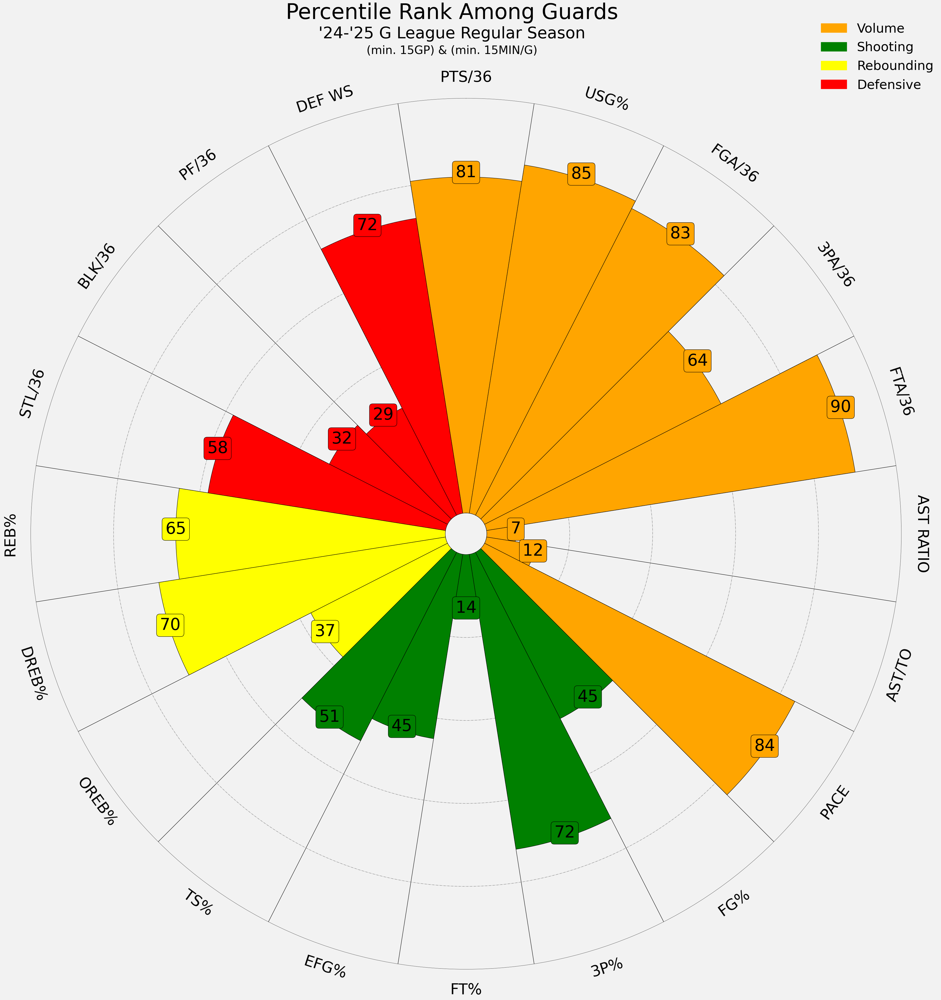

Radar plot saved to: C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_g_league_radar_plot.png


In [7]:
import matplotlib.patches as mpatches
import scipy.stats as stats
from mplsoccer import PyPizza

# Define columns to plot (must exactly match your DataFrame)
columns_to_plot = [
    "PTS", "USG%", "FGA", "3PA", "FTA", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",
    "OREB%", "DREB%", "REB%", "STL", "BLK", "PF", "DEF WS"
]

# Choose a player
player_name = "A.J. Lawson"
player_data = final_g_league_df.loc[final_g_league_df["PLAYER"] == player_name]

# Compute percentiles (inverting PF)
percentiles = []
for col in columns_to_plot:
    value = player_data[col].iloc[0]
    pct = stats.percentileofscore(final_g_league_df[col].dropna(), value)
    if col == "PF":
        pct = 100 - pct
    percentiles.append(int(pct))

# Display names around the pizza
stat_names = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",
    "OREB%", "DREB%", "REB%", "STL/36", "BLK/36", "PF/36", "DEF WS"
]

# Color settings
slice_colors = ["orange"] * 8 + ["green"] * 5 + ["yellow"] * 3 + ["red"] * 4
text_colors  = ["#000000"] * len(stat_names)

# Build the PyPizza
baker = PyPizza(
    params=stat_names,
    straight_line_color="#000000",
    straight_line_lw=1,
    last_circle_lw=1,
    other_circle_lw=1,
    other_circle_ls="-."
)

# Plot
fig, ax = baker.make_pizza(
    percentiles,
    figsize=(44, 44),
    param_location=105,
    slice_colors=slice_colors,
    value_colors=text_colors,
    value_bck_colors=slice_colors,
    kwargs_slices=dict(
        facecolor="cornflowerblue", edgecolor="#000000",
        zorder=2, linewidth=1
    ),
    kwargs_params=dict(
        color="#000000", fontsize=42, va="center"
    ),
    kwargs_values=dict(
        color="#000000", fontsize=46, zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="cornflowerblue",
            boxstyle="round,pad=0.2", lw=1
        )
    )
)

# Title
fig.text(
    0.5, 0.95,
    "Percentile Rank Among Guards",
    ha="center", fontsize=60, color="#000000"
)

fig.text(
    0.5, 0.933,  # Slightly lower y-position
    "'24-'25 G League Regular Season",
    ha="center", fontsize=45, color="#000000"
)

# Subtitle with smaller font
fig.text(
    0.5, 0.919,
    "(min. 15GP) & (min. 15MIN/G)",
    ha="center", fontsize=32, color="#000000"
)

orange_patch = mpatches.Patch(color="orange", label="Volume")
green_patch  = mpatches.Patch(color="green",  label="Shooting")
yellow_patch  = mpatches.Patch(color="yellow",  label="Rebounding")
red_patch    = mpatches.Patch(color="red",    label="Defensive")

ax.legend(
    handles=[orange_patch, green_patch, yellow_patch, red_patch],
    loc="upper right",
    bbox_to_anchor=(1.05, 1.10),
    frameon=False,
    fontsize=36
)

plt.show()

import os

# Construct the save path
output_dir = r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis"
# Convert player name to slug format
player_slug = player_name.lower().replace(".", "").replace(" ", "_")

# Build filename using slug
filename = f"{player_slug}_g_league_radar_plot.png"

save_path = os.path.join(output_dir, filename)

# Save only if file doesn't already exist
fig.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"Radar plot saved to: {save_path}")

## 2-Way Players

In [39]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Define the URL for the data request
url = "https://stats.gleague.nba.com/stats/leaguedashplayerstatscombined"

# Define the headers for the network request
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36",
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/",
}

# Define the query parameters
params = {
    "College": "",
    "Conference": "",
    "Country": "",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "DraftPick": "",
    "DraftYear": "",
    "GameScope": "",
    "GameSegment": "",
    "Height": "",
    "LastNGames": "0",
    "LeagueID": "20",
    "Location": "",
    "MeasureType": "Advanced",
    "Month": "0",
    "OpponentTeamID": "0",
    "Outcome": "",
    "PORound": "0",
    "PaceAdjust": "N",
    "PerMode": "PerGame",
    "Period": "0",
    "PlayerExperience": "",
    "PlayerPosition": "G",
    "PlusMinus": "N",
    "Rank": "N",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StarterBench": "",
    "TeamID": "0",
    "TwoWay": "1",
    "VsConference": "",
    "VsDivision": "",
    "Weight": "",
}

# Send the GET request
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()  # Parse the JSON data

    # Extract the relevant data
    if "resultSets" in data and len(data["resultSets"]) > 0:
        result_set = data["resultSets"][0]["rowSet"]
        headers = data["resultSets"][0]["headers"]

        # Convert to a DataFrame
        advanced_stats_two_way = pd.DataFrame(result_set, columns=headers)

        # Columns to drop
        columns_to_drop = [
            "PLAYER_ID", "NICKNAME", "TEAM_ID", "AGE", "W", "L", "W_PCT", 
            "E_OFF_RATING", "sp_work_OFF_RATING", "E_DEF_RATING", "sp_work_DEF_RATING", 
            "E_NET_RATING", "sp_work_NET_RATING", "E_TOV_PCT", "E_USG_PCT", 
            "E_PACE", "PACE_PER40", "sp_work_PACE", "POSS", "FGM", "FGA", 
            "FGM_PG", "FGA_PG", "FG_PCT", "GP_RANK", "W_RANK", "L_RANK", 
            "W_PCT_RANK", "MIN_RANK", "E_OFF_RATING_RANK", "OFF_RATING_RANK", 
            "sp_work_OFF_RATING_RANK", "E_DEF_RATING_RANK", "DEF_RATING_RANK", 
            "sp_work_DEF_RATING_RANK", "E_NET_RATING_RANK", "NET_RATING_RANK", 
            "sp_work_NET_RATING_RANK", "AST_PCT_RANK", "AST_TO_RANK", "AST_RATIO_RANK", 
            "OREB_PCT_RANK", "DREB_PCT_RANK", "REB_PCT_RANK", "TM_TOV_PCT_RANK", "E_TOV_PCT_RANK",
            "EFG_PCT_RANK", "TS_PCT_RANK", "USG_PCT_RANK", "E_USG_PCT_RANK", "E_PACE_RANK", 
            "PACE_RANK", "sp_work_PACE_RANK", "PIE_RANK", "FGM_RANK", "FGA_RANK", "FGM_PG_RANK",
            "FGA_PG_RANK", "FG_PCT_RANK"
        ]
        
        # Drop specified columns
        advanced_stats_two_way = advanced_stats_two_way.drop(columns=[col for col in columns_to_drop if col in advanced_stats_two_way.columns])

        # Rename columns
        advanced_stats_two_way = advanced_stats_two_way.rename(columns={
            "PLAYER_NAME": "PLAYER",
            "TEAM_ABBREVIATION": "TEAM",
            "OFF_RATING": "OFFRTG",
            "DEF_RATING": "DEFRTG",
            "NET_RATING": "NETRTG",
            "AST_PCT": "AST%",
            "AST_TO": "AST/TO",
            "AST_RATIO": "AST RATIO",
            "OREB_PCT": "OREB%",
            "DREB_PCT": "DREB%",
            "REB_PCT": "REB%",
            "TM_TOV_PCT": "TO RATIO",
            "EFG_PCT": "EFG%",
            "TS_PCT": "TS%",
            "USG_PCT": "USG%"
        })

        # Round the MIN column to one decimal point
        if "MIN" in advanced_stats_two_way.columns:
            advanced_stats_two_way["MIN"] = advanced_stats_two_way["MIN"].round(1)
            
        # Convert PIE values to percentage representation
        if 'PIE' in advanced_stats_two_way.columns:
            advanced_stats_two_way['PIE'] = (advanced_stats_two_way['PIE'] * 100).round(1)


        # Display the styled DataFrame
        from IPython.display import display
        display(advanced_stats_two_way)

else:
    print(f"Request failed with status code {response.status_code}")

,PLAYER,TEAM,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,USG%,PACE,PIE
0,A.J. Lawson,RAP,23,32.2,111.0,110.2,0.7,0.107,1.17,10.7,0.021,0.117,0.070,9.1,0.513,0.573,0.248,104.38,9.1
1,Adam Flagler,OKL,1,28.3,135.3,81.5,53.8,0.227,5.00,18.5,0.069,0.132,0.104,3.7,0.700,0.742,0.275,112.66,21.2
2,Alex Ducas,OKL,2,28.8,97.7,115.7,-18.1,0.024,0.50,5.6,0.000,0.060,0.031,11.1,0.286,0.370,0.117,106.61,1.6
3,Bones Hyland,IWA,2,40.8,111.8,121.3,-9.6,0.200,5.00,15.9,0.019,0.074,0.045,3.2,0.578,0.684,0.255,104.71,16.1
4,Brandon Williams,TEX,2,40.4,115.7,110.7,5.1,0.306,1.58,24.7,0.015,0.089,0.057,15.6,0.608,0.707,0.293,105.72,15.4
5,Bryce McGowens,RCR,16,35.1,112.9,110.9,2.0,0.146,1.13,11.0,0.016,0.085,0.051,9.8,0.527,0.653,0.300,108.14,13.5
6,Cam Spencer,MHU,5,32.4,115.8,112.0,3.9,0.191,4.20,20.2,0.022,0.062,0.041,4.8,0.618,0.688,0.202,106.58,11.8
7,Collin Gillespie,VAL,10,33.4,118.3,110.1,8.2,0.438,3.44,33.4,0.047,0.162,0.104,9.7,0.497,0.598,0.262,107.48,16.3
8,Daeqwon Plowden,CPS,29,33.6,108.9,108.4,0.5,0.090,1.25,11.5,0.034,0.092,0.062,9.2,0.481,0.559,0.196,101.18,7.7
9,Damion Baugh,GBO,22,34.6,116.3,111.8,4.5,0.319,2.91,35.8,0.024,0.141,0.082,12.3,0.459,0.527,0.177,103.83,10.7


In [40]:
# Filter the DataFrame for players who have played at least 15 games and averaged at least 20 minutes per game
filtered_stats = advanced_stats[(advanced_stats['GP'] >= 15) & (advanced_stats['MIN'] >= 20)].copy()

# Display the updated DataFrame to the user
filtered_stats

,PLAYER,TEAM,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,USG%,PACE,PIE
0,A.J. Lawson,RAP,23,32.2,111.0,110.2,0.7,0.107,1.17,10.7,0.021,0.117,0.070,9.1,0.513,0.573,0.248,104.38,9.1
2,AJ Johnson,CCG,20,28.6,110.7,108.3,2.4,0.197,1.42,19.5,0.019,0.100,0.062,13.8,0.519,0.567,0.230,100.23,8.5
5,Ade Murkey,WIS,21,20.5,106.2,104.7,1.5,0.102,1.61,13.9,0.027,0.069,0.049,8.6,0.453,0.501,0.175,100.62,5.7
8,Alex Morales,OSC,30,30.9,117.0,109.7,7.3,0.146,1.93,26.2,0.066,0.131,0.100,13.6,0.552,0.584,0.132,103.02,8.8
9,Alex O'Connell,WES,31,20.0,107.8,116.9,-9.0,0.088,1.27,12.6,0.056,0.121,0.087,9.9,0.511,0.543,0.164,105.21,7.6
10,Alex Schumacher,VAL,32,24.0,103.0,110.7,-7.7,0.222,1.74,23.5,0.023,0.084,0.054,13.5,0.451,0.497,0.202,98.60,7.4
11,Alondes Williams,SXF,32,33.1,112.2,110.8,1.4,0.277,1.71,24.7,0.024,0.105,0.066,14.4,0.535,0.613,0.236,102.06,11.0
14,Aminu Mohammed,DEL,33,23.2,104.3,111.7,-7.4,0.133,1.64,18.2,0.073,0.140,0.104,11.1,0.509,0.565,0.162,104.14,9.1
15,Andrew Funk,GRG,33,33.6,114.0,116.4,-2.5,0.122,2.26,23.4,0.013,0.100,0.056,10.4,0.534,0.545,0.126,99.63,6.3
19,Armaan Franklin,CPS,16,20.3,107.0,113.4,-6.3,0.067,0.71,10.1,0.068,0.127,0.096,14.1,0.475,0.535,0.161,103.48,6.7


In [41]:
import matplotlib.pyplot as plt
from adjustText import adjust_text  # Make sure you have installed this package via: pip install adjustText

def plot_min_vs_pie_with_two_way(player_name, filtered_stats, advanced_stats_two_way):
    plt.figure(figsize=(12, 8))

    # Plot all regular players as gray points
    plt.scatter(filtered_stats['MIN'], filtered_stats['PIE'], color='gray')
    
    # Prepare list to store text labels for adjustment
    text_labels = []
    
    # Store names of two-way players for quick lookup
    two_way_players = set(advanced_stats_two_way['PLAYER'].unique())
    
    # Plot and label only the two-way players, EXCLUDING A.J. Lawson
    for _, row in advanced_stats_two_way.iterrows():
        if row['PLAYER'] in filtered_stats['PLAYER'].values and row['PLAYER'] != player_name:  # Exclude A.J. Lawson
            plt.scatter(row['MIN'], row['PIE'], color='blue')
            text = plt.text(row['MIN'], row['PIE'], row['PLAYER'], fontsize=8, color='blue')
            text_labels.append(text)  # Store text object for later adjustment
    
    # Highlight the specified player in red
    player_data = filtered_stats[filtered_stats['PLAYER'] == player_name]
    if not player_data.empty:
        plt.scatter(player_data['MIN'], player_data['PIE'], color='red', s=100)
        text = plt.text(player_data['MIN'].values[0], player_data['PIE'].values[0], player_name, 
                        fontsize=10, fontweight='bold', color='red')
        text_labels.append(text)
    
    # Plot and label all players with PIE >= 0.14 in gray if they are NOT in the two-way player pool
    high_pie_players = filtered_stats[(filtered_stats['PIE'] >= 14) & (~filtered_stats['PLAYER'].isin(two_way_players))]
    
    for _, row in high_pie_players.iterrows():
        if row['PLAYER'] != player_name:  # Exclude A.J. Lawson (already plotted in red)
            plt.scatter(row['MIN'], row['PIE'], color='gray')
            text = plt.text(row['MIN'], row['PIE'], row['PLAYER'], fontsize=8, color='gray')
            text_labels.append(text)

    # Adjust text to avoid overlapping and place labels in open areas
    adjust_text(text_labels, arrowprops=dict(arrowstyle='->', color='black'))

    # Adding a legend for Two-Way Player only
    plt.scatter([], [], color='blue', label='Two-Way Player')
    plt.legend(loc='upper left')  # Display legend on the top left

    # Plot details
    plt.title('MIN vs. PIE (Highlighting Two-Way Players)', fontsize=16)
    plt.xlabel('MIN (Minutes per Game)', fontsize=12)
    plt.ylabel('PIE (Player Impact Estimate)', fontsize=12)
    plt.grid(True)
    plt.show()

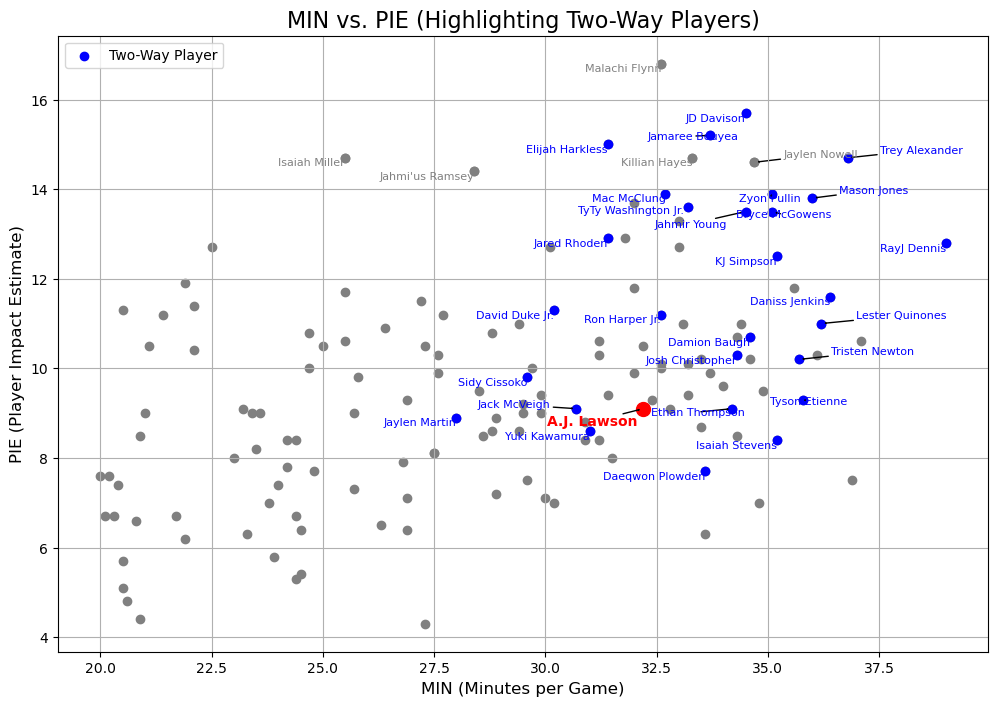

In [42]:
plot_min_vs_pie_with_two_way('A.J. Lawson', filtered_stats, advanced_stats_two_way)

In [43]:
import matplotlib.pyplot as plt
from adjustText import adjust_text  # Make sure you have installed this package via: pip install adjustText

def plot_two_way_players_with_highlight(player_name, filtered_stats, advanced_stats_two_way):
    plt.figure(figsize=(12, 8))

    # Prepare list to store text labels for adjustment
    text_labels = []

    # Store names of two-way players for quick lookup
    two_way_players = set(advanced_stats_two_way['PLAYER'].unique())
    
    # Filtered DataFrame for plotting - Only Two-Way Players including A.J. Lawson
    two_way_stats = filtered_stats[filtered_stats['PLAYER'].isin(two_way_players)]

    # Plot and label all two-way players in gray except A.J. Lawson
    for _, row in two_way_stats.iterrows():
        if row['PLAYER'] != player_name:  # Exclude A.J. Lawson (plot him separately)
            plt.scatter(row['MIN'], row['PIE'], color='gray')
            text = plt.text(row['MIN'], row['PIE'], row['PLAYER'], fontsize=8, color='gray')
            text_labels.append(text)

    # Plot and highlight A.J. Lawson in red
    aj_lawson_data = two_way_stats[two_way_stats['PLAYER'] == player_name]
    if not aj_lawson_data.empty:
        plt.scatter(aj_lawson_data['MIN'], aj_lawson_data['PIE'], color='red', s=100)
        text = plt.text(aj_lawson_data['MIN'].values[0], aj_lawson_data['PIE'].values[0], player_name, 
                        fontsize=10, fontweight='bold', color='red')
        text_labels.append(text)

    # Adjust text to avoid overlapping and place labels in open areas
    adjust_text(text_labels, arrowprops=dict(arrowstyle='->', color='black'))

    # Plot details
    plt.title('MIN vs. PIE (Two-Way Players Only)', fontsize=16)
    plt.xlabel('MIN (Minutes per Game)', fontsize=12)
    plt.ylabel('PIE (Player Impact Estimate)', fontsize=12)
    plt.grid(True)
    plt.show()

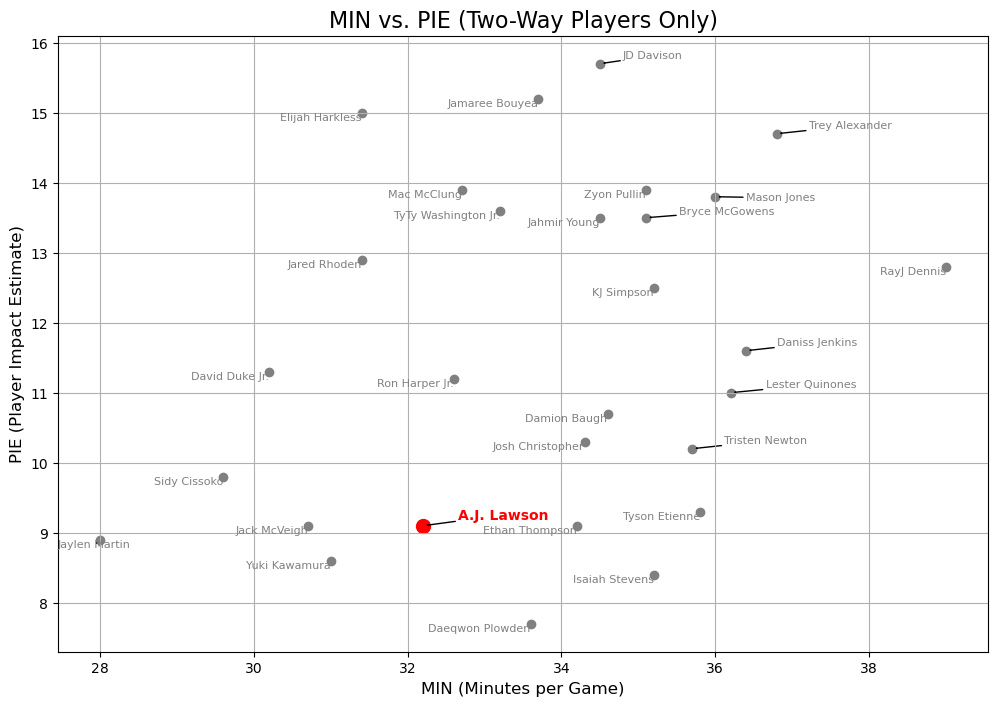

In [44]:
plot_two_way_players_with_highlight('A.J. Lawson', filtered_stats, advanced_stats_two_way)

# NBA Comparison

### Traditional

In [8]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# Define the URL for the data request (NBA traditional stats)
url = "https://stats.nba.com/stats/leaguedashplayerstats"

# Define the headers for the network request
headers = {
    "Host": "stats.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36",
    "Origin": "https://stats.nba.com",
    "Referer": "https://stats.nba.com/",
}

# Define the query parameters (make sure LeagueID is "00" for NBA)
params = {
    "College": "",
    "Conference": "",
    "Country": "",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "DraftPick": "",
    "DraftYear": "",
    "GameScope": "",
    "GameSegment": "",
    "Height": "",
    "LastNGames": "0",
    "LeagueID": "00",  # NBA LeagueID
    "Location": "",
    "MeasureType": "Base",
    "Month": "0",
    "OpponentTeamID": "0",
    "Outcome": "",
    "PORound": "0",
    "PaceAdjust": "N",
    "PerMode": "PerGame",
    "Period": "0",
    "PlayerExperience": "",
    "PlayerPosition": "G",
    "PlusMinus": "N",
    "Rank": "N",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StarterBench": "",
    "TeamID": "0",
    "TwoWay": "0",
    "VsConference": "",
    "VsDivision": "",
    "Weight": "",
}

# Send the GET request
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()  # Parse the JSON data

    # Extract the relevant data
    if "resultSets" in data and len(data["resultSets"]) > 0:
        result_set = data["resultSets"][0]["rowSet"]
        headers_data = data["resultSets"][0]["headers"]

        # Convert to a DataFrame
        traditional_stats = pd.DataFrame(result_set, columns=headers_data)
        
        # Drop unnecessary columns
        columns_to_drop = [
            'Unnamed: 0', "PLAYER_ID", "NICKNAME", "TEAM_ID", "AGE", 'W', 'L', 'W_PCT', 'MIN', 
            'NBA_FANTASY_PTS', 'DD2', 'TD3', 'WNBA_FANTASY_PTS', 'GP_RANK', 'W_RANK',
            'L_RANK', 'W_PCT_RANK', 'MIN_RANK', 'PTS_RANK',
            'FGM_RANK', 'FGA_RANK', 'FG_PCT_RANK', 'FG3M_RANK', 'FG3A_RANK', 'FG3_PCT_RANK',
            'FTM_RANK', 'FTA_RANK', 'FT_PCT_RANK', 'OREB_RANK', 'DREB_RANK',
            'REB_RANK', 'AST_RANK', 'TOV_RANK', 'STL_RANK', 'BLK_RANK', 'BLKA_RANK',
            'PF_RANK', 'PFD_RANK', 'PLUS_MINUS_RANK', 'NBA_FANTASY_PTS_RANK', 'DD2_RANK', 'TD3_RANK',
            'WNBA_FANTASY_PTS_RANK'
        ]
        traditional_stats = traditional_stats.drop(columns=[col for col in columns_to_drop if col in traditional_stats.columns])

        # Rename columns
        traditional_stats = traditional_stats.rename(columns={
            "PLAYER_NAME": "PLAYER",        
            "TEAM_ABBREVIATION": "TEAM",
            "FG_PCT": "FG%",
            "FT_PCT": "FT%",
            "FG3M": "3PM",
            "FG3A": "3PA",
            "FG3_PCT": "3P%",
            "PLUS_MINUS": "+/-"
        })

        # Round the MIN column to one decimal point (if it exists)
        if "MIN" in traditional_stats.columns:
            traditional_stats["MIN"] = traditional_stats["MIN"].round(1)

        # Display the plain DataFrame
        display(traditional_stats)
else:
    print(f"Request failed with status code {response.status_code}")

,PLAYER,TEAM,GP,FGM,FGA,FG%,3PM,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,PTS,+/-
0,A.J. Lawson,TOR,26,3.1,7.3,0.421,1.3,3.9,0.327,1.7,2.4,0.683,0.8,2.5,3.3,1.2,0.6,0.5,0.2,0.5,1.7,1.5,9.1,-0.7
1,AJ Green,MIL,73,2.5,5.8,0.429,2.1,5.0,0.427,0.3,0.4,0.815,0.2,2.1,2.4,1.5,0.5,0.5,0.1,0.0,2.2,0.7,7.4,3.1
2,AJ Johnson,WAS,29,2.8,7.3,0.385,0.8,3.1,0.267,1.1,1.3,0.865,0.3,1.8,2.0,2.6,1.2,0.4,0.1,0.6,1.7,0.9,7.6,-5.2
3,Aaron Holiday,HOU,62,1.9,4.3,0.437,1.2,2.9,0.398,0.5,0.7,0.829,0.2,1.0,1.3,1.3,0.6,0.3,0.2,0.2,1.0,0.8,5.5,1.4
4,Aaron Nesmith,IND,45,4.3,8.4,0.507,1.9,4.3,0.431,1.6,1.8,0.913,0.8,3.1,4.0,1.2,0.8,0.8,0.4,0.5,2.5,1.7,12.0,4.4
5,Aaron Wiggins,OKC,76,4.7,9.6,0.488,1.7,4.5,0.383,1.0,1.2,0.831,1.1,2.8,3.9,1.8,0.9,0.8,0.2,0.5,1.3,0.9,12.0,6.8
6,Adam Flagler,OKC,37,0.7,2.6,0.260,0.4,1.9,0.194,0.0,0.1,0.500,0.2,0.5,0.7,0.3,0.1,0.2,0.1,0.1,0.4,0.0,1.8,0.2
7,Ajay Mitchell,OKC,36,2.5,5.1,0.495,0.6,1.7,0.383,0.8,1.0,0.829,0.5,1.4,1.9,1.8,0.8,0.7,0.1,0.3,1.9,1.5,6.5,3.5
8,Alec Burks,MIA,49,2.3,5.5,0.424,1.8,4.2,0.425,0.8,1.0,0.776,0.3,2.2,2.5,1.1,0.6,0.6,0.1,0.2,0.8,0.9,7.3,2.2
9,Alex Caruso,OKC,54,2.6,5.8,0.446,1.1,3.1,0.353,0.8,0.9,0.824,0.7,2.2,2.9,2.5,0.7,1.6,0.6,0.3,1.9,1.1,7.1,5.9


### Advanced

In [9]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# Define the URL for the data request (NBA traditional stats)
url = "https://stats.nba.com/stats/leaguedashplayerstats"

# Define the headers for the network request
headers = {
    "Host": "stats.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36",
    "Origin": "https://stats.nba.com",
    "Referer": "https://stats.nba.com/",
}

# Define the query parameters (make sure LeagueID is "00" for NBA)
params = {
    "College": "",
    "Conference": "",
    "Country": "",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "DraftPick": "",
    "DraftYear": "",
    "GameScope": "",
    "GameSegment": "",
    "Height": "",
    "LastNGames": "0",
    "LeagueID": "00",  # NBA LeagueID
    "Location": "",
    "MeasureType": "Advanced",
    "Month": "0",
    "OpponentTeamID": "0",
    "Outcome": "",
    "PORound": "0",
    "PaceAdjust": "N",
    "PerMode": "PerGame",
    "Period": "0",
    "PlayerExperience": "",
    "PlayerPosition": "G",
    "PlusMinus": "N",
    "Rank": "N",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StarterBench": "",
    "TeamID": "0",
    "TwoWay": "0",
    "VsConference": "",
    "VsDivision": "",
    "Weight": "",
}

# Send the GET request
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()  # Parse the JSON data

    # Extract the relevant data
    if "resultSets" in data and len(data["resultSets"]) > 0:
        result_set = data["resultSets"][0]["rowSet"]
        headers = data["resultSets"][0]["headers"]

        # Convert to a DataFrame
        advanced_stats = pd.DataFrame(result_set, columns=headers)

        # Columns to drop
        columns_to_drop = [
            "PLAYER_ID", "NICKNAME", "TEAM_ID", "AGE", "W", "L", "W_PCT", 
            "E_OFF_RATING", "sp_work_OFF_RATING", "E_DEF_RATING", "sp_work_DEF_RATING", 
            "E_NET_RATING", "sp_work_NET_RATING", "E_TOV_PCT", "E_USG_PCT", 
            "E_PACE", "PACE_PER40", "sp_work_PACE", "POSS", "FGM", "FGA", 
            "FGM_PG", "FGA_PG", "FG_PCT", "GP_RANK", "W_RANK", "L_RANK", 
            "W_PCT_RANK", "MIN_RANK", "E_OFF_RATING_RANK", "OFF_RATING_RANK", 
            "sp_work_OFF_RATING_RANK", "E_DEF_RATING_RANK", "DEF_RATING_RANK", 
            "sp_work_DEF_RATING_RANK", "E_NET_RATING_RANK", "NET_RATING_RANK", 
            "sp_work_NET_RATING_RANK", "AST_PCT_RANK", "AST_TO_RANK", "AST_RATIO_RANK", 
            "OREB_PCT_RANK", "DREB_PCT_RANK", "REB_PCT_RANK", "TM_TOV_PCT_RANK", "E_TOV_PCT_RANK",
            "EFG_PCT_RANK", "TS_PCT_RANK", "USG_PCT_RANK", "E_USG_PCT_RANK", "E_PACE_RANK", 
            "PACE_RANK", "sp_work_PACE_RANK", "PIE_RANK", "FGM_RANK", "FGA_RANK", "FGM_PG_RANK",
            "FGA_PG_RANK", "FG_PCT_RANK"
        ]
        
        # Drop specified columns
        advanced_stats = advanced_stats.drop(columns=[col for col in columns_to_drop if col in advanced_stats.columns])

        # Rename columns
        advanced_stats = advanced_stats.rename(columns={
            "PLAYER_NAME": "PLAYER",
            "TEAM_ABBREVIATION": "TEAM",
            "OFF_RATING": "OFFRTG",
            "DEF_RATING": "DEFRTG",
            "NET_RATING": "NETRTG",
            "AST_PCT": "AST%",
            "AST_TO": "AST/TO",
            "AST_RATIO": "AST RATIO",
            "OREB_PCT": "OREB%",
            "DREB_PCT": "DREB%",
            "REB_PCT": "REB%",
            "TM_TOV_PCT": "TO RATIO",
            "EFG_PCT": "EFG%",
            "TS_PCT": "TS%",
            "USG_PCT": "USG%"
        })

        # Round the MIN column to one decimal point
        if "MIN" in advanced_stats.columns:
            advanced_stats["MIN"] = advanced_stats["MIN"].round(1)
            
        # Convert PIE values to percentage representation
        if 'PIE' in advanced_stats.columns:
            advanced_stats['PIE'] = (advanced_stats['PIE'] * 100).round(1)


        # Display the styled DataFrame
        from IPython.display import display
        display(advanced_stats)

else:
    print(f"Request failed with status code {response.status_code}")

,PLAYER,TEAM,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,USG%,PACE,PIE
0,A.J. Lawson,TOR,26,18.7,109.7,111.1,-1.4,0.093,2.07,11.7,0.036,0.128,0.080,5.7,0.508,0.542,0.189,103.71,8.2
1,AJ Green,MIL,73,22.7,114.0,107.6,6.4,0.086,2.70,18.6,0.011,0.087,0.051,6.9,0.612,0.621,0.123,100.84,5.8
2,AJ Johnson,WAS,29,22.0,104.1,115.6,-11.5,0.178,2.17,22.3,0.011,0.073,0.042,10.3,0.441,0.480,0.173,100.83,5.3
3,Aaron Holiday,HOU,62,12.8,110.3,103.6,6.7,0.142,2.24,20.5,0.015,0.073,0.044,9.1,0.571,0.594,0.162,103.09,8.2
4,Aaron Nesmith,IND,45,24.9,120.1,111.5,8.5,0.063,1.46,10.8,0.034,0.118,0.078,7.4,0.617,0.653,0.171,101.64,8.7
5,Aaron Wiggins,OKC,76,22.9,120.7,106.6,14.2,0.102,1.94,13.8,0.046,0.113,0.081,7.1,0.577,0.596,0.200,101.91,10.5
6,Adam Flagler,OKC,37,5.5,99.1,96.7,2.3,0.094,3.00,10.6,0.029,0.086,0.057,3.5,0.333,0.335,0.207,100.16,2.5
7,Ajay Mitchell,OKC,36,16.6,110.0,100.2,9.7,0.153,2.21,22.1,0.028,0.080,0.053,10.0,0.557,0.587,0.159,100.63,8.2
8,Alec Burks,MIA,49,17.6,113.5,107.6,5.9,0.090,1.90,14.7,0.018,0.119,0.070,7.8,0.587,0.608,0.160,98.03,8.8
9,Alex Caruso,OKC,54,19.3,117.5,102.5,15.0,0.171,3.70,26.9,0.035,0.108,0.072,7.3,0.541,0.568,0.147,102.70,10.1


### Defense

In [10]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# Define the URL for the data request (NBA traditional stats)
url = "https://stats.nba.com/stats/leaguedashplayerstats"

# Define the headers for the network request
headers = {
    "Host": "stats.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36",
    "Origin": "https://stats.nba.com",
    "Referer": "https://stats.nba.com/",
}

# Define the query parameters (make sure LeagueID is "00" for NBA)
params = {
    "College": "",
    "Conference": "",
    "Country": "",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "DraftPick": "",
    "DraftYear": "",
    "GameScope": "",
    "GameSegment": "",
    "Height": "",
    "LastNGames": "0",
    "LeagueID": "00",  # NBA LeagueID
    "Location": "",
    "MeasureType": "Defense",
    "Month": "0",
    "OpponentTeamID": "0",
    "Outcome": "",
    "PORound": "0",
    "PaceAdjust": "N",
    "PerMode": "PerGame",
    "Period": "0",
    "PlayerExperience": "",
    "PlayerPosition": "G",
    "PlusMinus": "N",
    "Rank": "N",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StarterBench": "",
    "TeamID": "0",
    "TwoWay": "0",
    "VsConference": "",
    "VsDivision": "",
    "Weight": "",
}

# Send the GET request
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()  # Parse the JSON data

    # Extract the relevant data
    if "resultSets" in data and len(data["resultSets"]) > 0:
        result_set = data["resultSets"][0]["rowSet"]
        headers = data["resultSets"][0]["headers"]

        # Convert to a DataFrame
        defense_stats = pd.DataFrame(result_set, columns=headers)

        # Columns to drop
        columns_to_drop = [
            "PLAYER_ID", "NICKNAME", "TEAM_ID", "AGE", "GP", "W", "L", "W_PCT", "GP_RANK", "W_RANK", "L_RANK",
            "W_PCT_RANK", "MIN_RANK", "DEF_RATING_RANK", "DREB_RANK", 
            "DREB_PCT_RANK", "PCT_DREB_RANK", "STL_RANK", "PCT_STL_RANK",
            "BLK_RANK", "PCT_BLK_RANK", "OPP_PTS_OFF_TOV_RANK", 
            "OPP_PTS_2ND_CHANCE_RANK", "OPP_PTS_FB_RANK", "OPP_PTS_PAINT_RANK",
            "DEF_WS_RANK"
        ]

        # Drop specified columns
        defense_stats = defense_stats.drop(columns=[col for col in columns_to_drop if col in defense_stats.columns])

        # Rename columns
        defense_stats = defense_stats.rename(columns={
            "PLAYER_NAME": "PLAYER",
            "TEAM_ABBREVIATION": "TEAM",
            "DEF_RATING": "DEF RTG",
            "DREB": "DREB",
            "DREB_PCT": "DREB%",
            "PCT_DREB": "%DREB",
            "STL": "STL",
            "PCT_STL": "STL%",
            "BLK": "BLK",
            "PCT_BLK": "%BLK",
            "OPP_PTS_OFF_TOV": "OPP PTS OFF TOV",
            "OPP_PTS_2ND_CHANCE": "OPP PTS 2ND CHANCE",
            "OPP_PTS_FB": "OPP PTS FB",
            "OPP_PTS_PAINT": "OPP PTS PAINT",
            "DEF_WS": "DEF WS"
        })

        # Round the MINUTES column to one decimal point
        if "MIN" in defense_stats.columns:
            defense_stats["MIN"] = defense_stats["MIN"].round(1)

       # Display the styled DataFrame
        from IPython.display import display
        display(defense_stats)

else:
    print(f"Request failed with status code {response.status_code}")

,PLAYER,TEAM,MIN,DEF RTG,DREB,DREB%,%DREB,STL,STL%,BLK,%BLK,OPP PTS OFF TOV,OPP PTS 2ND CHANCE,OPP PTS FB,OPP PTS PAINT,DEF WS
0,A.J. Lawson,TOR,18.7,111.1,2.5,0.128,0.199,0.5,0.153,0.2,0.154,6.8,6.5,7.0,20.0,0.064
1,AJ Green,MIL,22.7,107.6,2.1,0.087,0.126,0.5,0.141,0.1,0.048,7.5,5.9,6.6,21.6,0.100
2,AJ Johnson,WAS,22.0,115.6,1.8,0.073,0.118,0.4,0.132,0.1,0.049,8.3,8.2,8.3,23.8,0.045
3,Aaron Holiday,HOU,12.8,103.6,1.0,0.073,0.108,0.3,0.141,0.2,0.120,4.6,3.8,3.6,12.8,0.074
4,Aaron Nesmith,IND,24.9,111.5,3.1,0.118,0.184,0.8,0.177,0.4,0.137,6.9,7.6,6.4,26.3,0.081
5,Aaron Wiggins,OKC,22.9,106.6,2.8,0.113,0.176,0.8,0.156,0.2,0.098,5.7,7.9,5.4,21.4,0.107
6,Adam Flagler,OKC,5.5,96.7,0.5,0.086,0.127,0.2,0.211,0.1,0.158,1.5,1.6,1.2,4.5,0.041
7,Ajay Mitchell,OKC,16.6,100.2,1.4,0.080,0.118,0.7,0.175,0.1,0.074,3.6,4.4,3.3,14.2,0.106
8,Alec Burks,MIA,17.6,107.6,2.2,0.119,0.178,0.6,0.207,0.1,0.106,5.5,4.6,5.4,18.1,0.077
9,Alex Caruso,OKC,19.3,102.5,2.2,0.108,0.171,1.6,0.341,0.6,0.214,5.3,6.1,4.6,15.5,0.114


### Hustle

In [11]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# Define the URL for the data request (NBA traditional stats)
url = "https://stats.nba.com/stats/leaguehustlestatsplayer"

# Define the headers for the network request
headers = {
    "Host": "stats.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36",
    "Origin": "https://stats.nba.com",
    "Referer": "https://stats.nba.com/",
}

# Define the query parameters (make sure LeagueID is "00" for NBA)
params = {
    "College": "",
    "Conference": "",
    "Country": "",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "DraftPick": "",
    "DraftYear": "",
    "GameScope": "",
    "GameSegment": "",
    "Height": "",
    "LastNGames": "0",
    "LeagueID": "00",  # NBA LeagueID
    "Location": "",
    "MeasureType": "Hustle",
    "Month": "0",
    "OpponentTeamID": "0",
    "Outcome": "",
    "PORound": "0",
    "PaceAdjust": "N",
    "PerMode": "PerGame",
    "Period": "0",
    "PlayerExperience": "",
    "PlayerPosition": "G",
    "PlusMinus": "N",
    "Rank": "N",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StarterBench": "",
    "TeamID": "0",
    "TwoWay": "0",
    "VsConference": "",
    "VsDivision": "",
    "Weight": "",
}

# Send the GET request
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()  # Parse the JSON data

    # Extract the relevant data
    if "resultSets" in data and len(data["resultSets"]) > 0:
        result_set = data["resultSets"][0]["rowSet"]
        headers = data["resultSets"][0]["headers"]

        # Convert to a DataFrame
        hustle_stats = pd.DataFrame(result_set, columns=headers)

        # Columns to drop
        columns_to_drop = [
            "PLAYER_ID", "NICKNAME", "TEAM_ID", "AGE", "W", "L", "W_PCT", "GP_RANK", "W_RANK", "L_RANK",
            "W_PCT_RANK", "MIN_RANK", "DEF_RATING_RANK", "DREB_RANK", 
            "DREB_PCT_RANK", "PCT_DREB_RANK", "STL_RANK", "PCT_STL_RANK",
            "BLK_RANK", "PCT_BLK_RANK", "OPP_PTS_OFF_TOV_RANK", 
            "OPP_PTS_2ND_CHANCE_RANK", "OPP_PTS_FB_RANK", "OPP_PTS_PAINT_RANK",
            "DEF_WS_RANK"
        ]

        # Drop specified columns
        hustle_stats = hustle_stats.drop(columns=[col for col in columns_to_drop if col in hustle_stats.columns])

        # Rename columns
        hustle_stats = hustle_stats.rename(columns={
            "PLAYER_NAME": "PLAYER",
            "TEAM_ABBREVIATION": "TEAM",
            "G": "GP",
            "CONTESTED_SHOTS": "CONTESTED SHOTS",
            "CONTESTED_SHOTS_2PT": "CONTESTED 2PT SHOTS",
            "CONTESTED_SHOTS_3PT": "CONTESTED 3PT SHOTS",
            "CHARGES_DRAWN": "CHARGES DRAWN",
            "SCREEN_ASSISTS": "SCREEN ASSISTS",
            "SCREEN_AST_PTS": "SCREEN AST PTS",
            "OFF_LOOSE_BALLS_RECOVERED": "OFF LOOSE BALLS RECOVERED",
            "DEF_LOOSE_BALLS_RECOVERED": "DEF LOOSE BALLS RECOVERED",
            "LOOSE_BALLS_RECOVERED": "LOOSE BALLS RECOVERED",
            "PCT_LOOSE_BALLS_RECOVERED_OFF": "% LOOSE BALLS RECOVERED OFF",
            "PCT_LOOSE_BALLS_RECOVERED_DEF": "% LOOSE BALLS RECOVERED DEF",
            "OFF_BOXOUTS": "OFF BOXOUTS",
            "DEF_BOXOUTS": "DEF BOXOUTS",
            "BOX_OUTS": "BOX OUTS",
            "BOX_OUT_PLAYER_TEAM_REBS": "BOX OUT PLAYER TEAM_REBS",
            "BOX_OUT_PLAYER_REBS": "BOX OUT PLAYER REBS",
            "PCT_BOX_OUTS_OFF": "% BOX OUTS OFF",
            "PCT_BOX_OUTS_DEF": "% BOX OUTS DEF",
            "PCT_BOX_OUTS_TEAM_REB": "% BOX OUTS TEAM REB",
            "PCT_BOX_OUTS_REB": "% BOX OUTS REB"
        })

        # Round the MINUTES column to one decimal point
        if "MIN" in hustle_stats.columns:
            hustle_stats["MIN"] = hustle_stats["MIN"].round(1)
            
        # ─────────────────────────────────────────────────────────────
        # 5. FILTER FOR PLAYERS WITH 15+ GP
        # ─────────────────────────────────────────────────────────────
        # Make sure GP is numeric (just in case)
        #hustle_stats["GP"] = pd.to_numeric(hustle_stats["GP"], errors="coerce")

        # Keep only those who have played 15 or more games
        #hustle_stats = hustle_stats[hustle_stats["GP"] >= 15].reset_index(drop=True)

       # Display the styled DataFrame
        from IPython.display import display
        display(hustle_stats)

else:
    print(f"Request failed with status code {response.status_code}")

,PLAYER,TEAM,GP,MIN,CONTESTED SHOTS,CONTESTED 2PT SHOTS,CONTESTED 3PT SHOTS,DEFLECTIONS,CHARGES DRAWN,SCREEN ASSISTS,SCREEN AST PTS,OFF LOOSE BALLS RECOVERED,DEF LOOSE BALLS RECOVERED,LOOSE BALLS RECOVERED,% LOOSE BALLS RECOVERED OFF,% LOOSE BALLS RECOVERED DEF,OFF BOXOUTS,DEF BOXOUTS,BOX OUTS,BOX OUT PLAYER TEAM_REBS,BOX OUT PLAYER REBS,% BOX OUTS OFF,% BOX OUTS DEF,% BOX OUTS TEAM REB,% BOX OUTS REB
0,A.J. Lawson,TOR,24,20.2,2.04,1.17,0.88,1.08,0.00,0.33,0.75,0.08,0.21,0.29,0.286,0.714,0.00,0.21,0.21,0.21,0.13,0.000,1.000,1.000,0.600
1,AJ Green,MIL,72,23.0,3.29,1.83,1.46,0.96,0.07,0.40,0.89,0.15,0.26,0.42,0.367,0.633,0.03,0.53,0.56,0.51,0.13,0.050,0.950,0.925,0.225
2,AJ Johnson,WAS,22,28.0,3.59,2.00,1.59,1.14,0.00,0.09,0.18,0.18,0.23,0.41,0.444,0.556,0.05,0.00,0.05,0.05,0.00,1.000,0.000,1.000,0.000
3,Aaron Holiday,HOU,57,13.6,1.93,0.96,0.96,0.88,0.02,0.09,0.18,0.23,0.09,0.32,0.722,0.278,0.00,0.26,0.26,0.25,0.05,0.000,1.000,0.933,0.200
4,Aaron Nesmith,IND,45,24.9,5.07,2.89,2.18,1.27,0.16,0.31,0.71,0.29,0.18,0.47,0.619,0.381,0.09,0.29,0.38,0.38,0.22,0.235,0.765,1.000,0.588
5,Aaron Wiggins,OKC,76,22.9,4.45,2.28,2.17,1.75,0.01,0.38,0.84,0.26,0.25,0.51,0.513,0.487,0.00,0.38,0.38,0.38,0.11,0.000,1.000,1.000,0.276
6,Adam Flagler,OKC,16,9.7,1.44,0.31,1.13,0.69,0.00,0.25,0.56,0.00,0.38,0.38,0.000,1.000,0.00,0.25,0.25,0.25,0.13,0.000,1.000,1.000,0.500
7,Ajay Mitchell,OKC,36,16.6,2.25,1.42,0.83,1.33,0.08,0.14,0.36,0.17,0.14,0.31,0.545,0.455,0.00,0.19,0.19,0.19,0.11,0.000,1.000,1.000,0.571
8,Alec Burks,MIA,47,17.8,2.32,1.06,1.26,1.02,0.00,0.19,0.40,0.11,0.11,0.21,0.500,0.500,0.00,0.19,0.19,0.17,0.06,0.000,1.000,0.889,0.333
9,Alex Caruso,OKC,53,19.6,3.09,1.42,1.68,3.51,0.15,0.58,1.38,0.19,0.30,0.49,0.385,0.615,0.04,0.30,0.34,0.34,0.19,0.111,0.889,1.000,0.556


### Final Df

In [12]:
import pandas as pd

# --- Merge the dataframes on PLAYER ---

# Merge traditional (Base) stats with advanced stats (select only desired columns)
final_nba_df = pd.merge(
    traditional_stats, 
    advanced_stats[['PLAYER', 'USG%', 'EFG%', 'TS%', 'OREB%', 'DREB%', 'REB%', 'AST RATIO', 'AST/TO', 'PACE']],
    on='PLAYER', 
    how='outer'
)

# Merge with defense stats (MIN and DEF WS)
final_nba_df = pd.merge(
    final_nba_df, 
    defense_stats[['PLAYER', 'MIN', 'DEF WS']],
    on='PLAYER', 
    how='outer'
)

final_nba_df = pd.merge(
    final_nba_df,
    hustle_stats[['PLAYER', 'CONTESTED SHOTS', 'DEFLECTIONS', '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF']],
    on='PLAYER',
    how='outer'
)

# --- Filter for players with at least 15 minutes per game ---
final_nba_df = final_nba_df[(final_nba_df['MIN'] >= 15) & (final_nba_df['GP'] >= 15)]

# Normalize specific stats to per 36 minutes
per_36_cols = ['PTS', 'FGA', '3PA', 'FTA', 'STL', 'BLK', 'PF', 'CONTESTED SHOTS', 'DEFLECTIONS']
for col in per_36_cols:
    final_nba_df[col] = (final_nba_df[col] / final_nba_df['MIN']) * 36
    
final_nba_df[per_36_cols] = final_nba_df[per_36_cols].round(1)

# --- Rename the per-36 columns to "COL/36" ---
rename_map = {col: f"{col}/36" for col in per_36_cols}
final_nba_df = final_nba_df.rename(columns=rename_map)

# --- Reorder columns to the desired final order (using the new per-36 names) ---
final_nba_df = final_nba_df[[
    'PLAYER', 'GP', 'MIN',
    'PTS/36', 'USG%', 'FGA/36', '3PA/36', 'FTA/36', 'PACE',
    'FG%', '3P%', 'FT%', 'EFG%', 'TS%', 'OREB%', 'DREB%', 'REB%',
    'AST RATIO', 'AST/TO', 'STL/36', 'BLK/36', 'PF/36', 'DEF WS',
    'CONTESTED SHOTS/36', 'DEFLECTIONS/36',
    '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF'
]]

# Display the final DataFrame
final_nba_df

,PLAYER,GP,MIN,PTS/36,USG%,FGA/36,3PA/36,FTA/36,PACE,FG%,3P%,FT%,EFG%,TS%,OREB%,DREB%,REB%,AST RATIO,AST/TO,STL/36,BLK/36,PF/36,DEF WS,CONTESTED SHOTS/36,DEFLECTIONS/36,% LOOSE BALLS RECOVERED OFF,% LOOSE BALLS RECOVERED DEF
0,A.J. Lawson,26,18.7,17.5,0.189,14.1,7.5,4.6,103.71,0.421,0.327,0.683,0.508,0.542,0.036,0.128,0.080,11.7,2.07,1.0,0.4,3.3,0.064,3.9,2.1,0.286,0.714
1,AJ Green,73,22.7,11.7,0.123,9.2,7.9,0.6,100.84,0.429,0.427,0.815,0.612,0.621,0.011,0.087,0.051,18.6,2.70,0.8,0.2,3.5,0.100,5.2,1.5,0.367,0.633
2,AJ Johnson,29,22.0,12.4,0.173,11.9,5.1,2.1,100.83,0.385,0.267,0.865,0.441,0.480,0.011,0.073,0.042,22.3,2.17,0.7,0.2,2.8,0.045,5.9,1.9,0.444,0.556
4,Aaron Nesmith,45,24.9,17.3,0.171,12.1,6.2,2.6,101.64,0.507,0.431,0.913,0.617,0.653,0.034,0.118,0.078,10.8,1.46,1.2,0.6,3.6,0.081,7.3,1.8,0.619,0.381
5,Aaron Wiggins,76,22.9,18.9,0.200,15.1,7.1,1.9,101.91,0.488,0.383,0.831,0.577,0.596,0.046,0.113,0.081,13.8,1.94,1.3,0.3,2.0,0.107,7.0,2.8,0.513,0.487
7,Ajay Mitchell,36,16.6,14.1,0.159,11.1,3.7,2.2,100.63,0.495,0.383,0.829,0.557,0.587,0.028,0.080,0.053,22.1,2.21,1.5,0.2,4.1,0.106,4.9,2.9,0.545,0.455
8,Alec Burks,49,17.6,14.9,0.160,11.2,8.6,2.0,98.03,0.424,0.425,0.776,0.587,0.608,0.018,0.119,0.070,14.7,1.90,1.2,0.2,1.6,0.077,4.7,2.1,0.500,0.500
9,Alex Caruso,54,19.3,13.2,0.147,10.8,5.8,1.7,102.70,0.446,0.353,0.824,0.541,0.568,0.035,0.108,0.072,26.9,3.70,3.0,1.1,3.5,0.114,5.8,6.5,0.385,0.615
12,Amen Thompson,69,32.3,15.7,0.172,11.3,1.4,4.0,100.00,0.557,0.275,0.684,0.575,0.602,0.078,0.159,0.118,21.9,1.92,1.6,1.4,2.7,0.139,5.2,3.2,0.463,0.537
13,Amir Coffey,72,24.3,14.4,0.150,10.5,5.0,2.7,99.23,0.471,0.409,0.891,0.570,0.614,0.019,0.072,0.046,11.2,1.71,0.9,0.1,2.5,0.086,3.5,1.7,0.429,0.571


### Final Df (Role Players)

In [27]:
import pandas as pd

# --- Merge the dataframes on PLAYER ---

# Merge traditional (Base) stats with advanced stats (select only desired columns)
final_nba_df_role_players = pd.merge(
    traditional_stats, 
    advanced_stats[['PLAYER', 'USG%', 'EFG%', 'TS%', 'OREB%', 'DREB%', 'REB%', 'AST RATIO', 'AST/TO', 'PACE']],
    on='PLAYER', 
    how='outer'
)

# Merge with defense stats (MIN and DEF WS)
final_nba_df_role_players = pd.merge(
    final_nba_df_role_players, 
    defense_stats[['PLAYER', 'MIN', 'DEF WS']],
    on='PLAYER', 
    how='outer'
)

final_nba_df_role_players = pd.merge(
    final_nba_df_role_players,
    hustle_stats[['PLAYER', 'CONTESTED SHOTS', 'DEFLECTIONS', '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF']],
    on='PLAYER',
    how='outer'
)

# --- Filter for players with at least 15 minutes per game ---
final_nba_df_role_players = final_nba_df_role_players[(final_nba_df_role_players['MIN'] >= 15) & (final_nba_df_role_players['MIN'] <= 25) & (final_nba_df_role_players['GP'] >= 25)]

# --- Reorder columns to the desired final order ---
final_nba_df_role_players = final_nba_df_role_players[[
    'PLAYER', 'GP', 'MIN', 'PTS', 'USG%', 'FGA', '3PA', 'FTA', 'PACE',
    'FG%', '3P%', 'FT%', 'EFG%', 'TS%', 'OREB%', 'DREB%', 'REB%',
    'AST RATIO', 'AST/TO', 'DEF WS', 'CONTESTED SHOTS', 'DEFLECTIONS', '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF'
]]

# Display the final DataFrame
final_nba_df_role_players

,PLAYER,GP,MIN,PTS,USG%,FGA,3PA,FTA,PACE,FG%,3P%,FT%,EFG%,TS%,OREB%,DREB%,REB%,AST RATIO,AST/TO,DEF WS,CONTESTED SHOTS,DEFLECTIONS,% LOOSE BALLS RECOVERED OFF,% LOOSE BALLS RECOVERED DEF
0,A.J. Lawson,26,18.7,9.1,0.189,7.3,3.9,2.4,103.71,0.421,0.327,0.683,0.508,0.542,0.036,0.128,0.080,11.7,2.07,0.064,2.04,1.13,0.167,0.833
1,AJ Green,73,22.7,7.4,0.123,5.8,5.0,0.4,100.84,0.429,0.427,0.815,0.612,0.621,0.011,0.087,0.051,18.6,2.70,0.100,3.28,0.93,0.379,0.621
2,AJ Johnson,29,22.0,7.6,0.173,7.3,3.1,1.3,100.83,0.385,0.267,0.865,0.441,0.480,0.011,0.073,0.042,22.3,2.17,0.045,3.64,1.09,0.444,0.556
4,Aaron Nesmith,45,24.9,12.0,0.171,8.4,4.3,1.8,101.64,0.507,0.431,0.913,0.617,0.653,0.034,0.118,0.078,10.8,1.46,0.081,5.11,1.22,0.609,0.391
5,Aaron Wiggins,76,22.9,12.0,0.200,9.6,4.5,1.2,101.91,0.488,0.383,0.831,0.577,0.596,0.046,0.113,0.081,13.8,1.94,0.107,4.45,1.70,0.526,0.474
7,Ajay Mitchell,36,16.6,6.5,0.159,5.1,1.7,1.0,100.63,0.495,0.383,0.829,0.557,0.587,0.028,0.080,0.053,22.1,2.21,0.106,2.25,1.33,0.545,0.455
8,Alec Burks,49,17.6,7.3,0.160,5.5,4.2,1.0,98.03,0.424,0.425,0.776,0.587,0.608,0.018,0.119,0.070,14.7,1.90,0.077,2.28,1.02,0.444,0.556
9,Alex Caruso,54,19.3,7.1,0.147,5.8,3.1,0.9,102.70,0.446,0.353,0.824,0.541,0.568,0.035,0.108,0.072,26.9,3.70,0.114,3.09,3.45,0.333,0.667
13,Amir Coffey,72,24.3,9.7,0.150,7.1,3.4,1.8,99.23,0.471,0.409,0.891,0.570,0.614,0.019,0.072,0.046,11.2,1.71,0.086,2.38,1.13,0.429,0.571
17,Anthony Black,78,24.2,9.4,0.190,7.9,2.5,2.5,97.83,0.423,0.318,0.761,0.473,0.521,0.026,0.100,0.061,22.2,1.73,0.110,3.88,2.35,0.447,0.553


### Standard Radar Plot

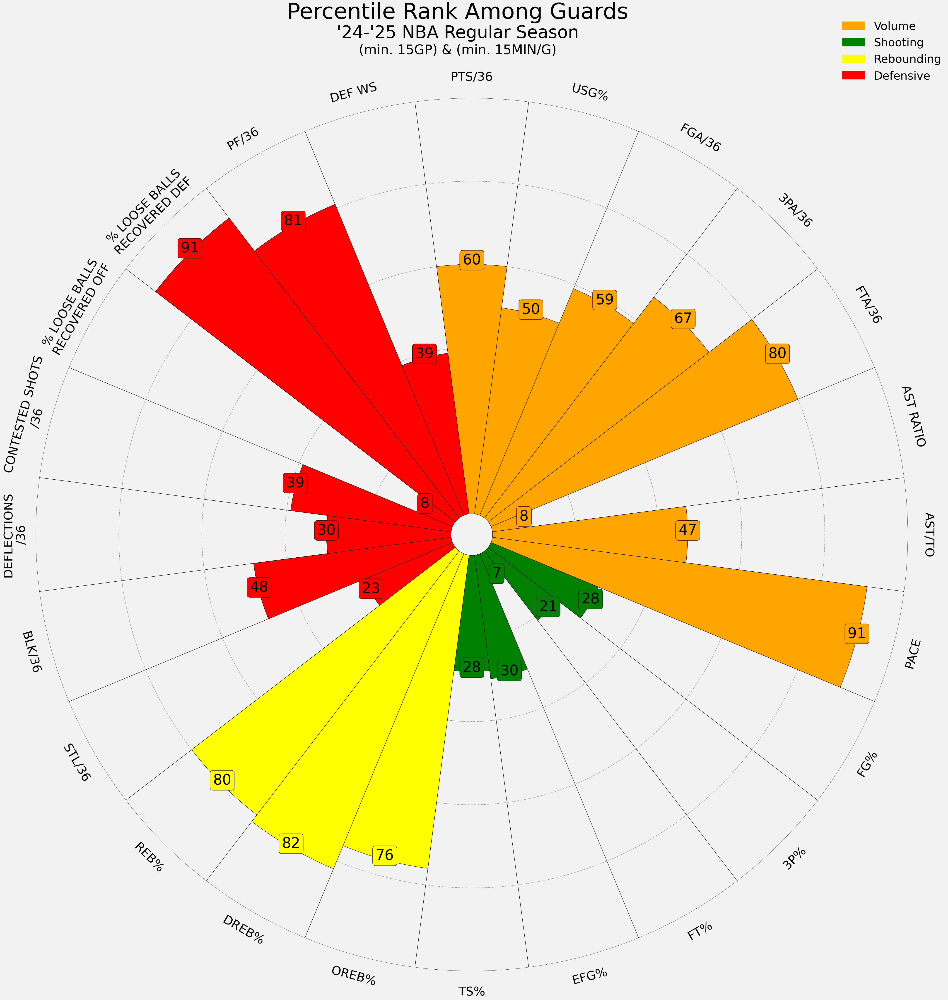

Radar plot saved to: C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_nba_radar_plot.png


In [13]:
import scipy.stats as stats
from mplsoccer import PyPizza
import matplotlib.pyplot as plt

# Define columns to plot (matching the flattened names)
columns_to_plot = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS/36', 'CONTESTED SHOTS/36', '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF', "PF/36", "DEF WS" 
    # Add more columns if you want them in the pizza plot
]

# Choose a player
player_name = "A.J. Lawson"  # example name
player_data = final_nba_df.loc[final_nba_df["PLAYER"] == player_name]

# Compute percentiles (inverting PF)
percentiles = []
for col in columns_to_plot:
    value = player_data[col].iloc[0]
    pct = stats.percentileofscore(final_nba_df[col].dropna(), value)
    if col == "PF":
        pct = 100 - pct
    percentiles.append(int(pct))

stat_names = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS\n/36', 'CONTESTED SHOTS\n/36', '% LOOSE BALLS\nRECOVERED OFF', '% LOOSE BALLS\nRECOVERED DEF', "PF/36", "DEF WS"
]

# Modified color settings:
slice_colors = ["orange"] * 8 + ["green"] * 5 + ["yellow"] * 3 + ["red"] * 8  # 4 orange, 2 yellow, 4 green (10 in total)
#text_colors = ["white"] * 10  # Ensure there are 10 text colors (one for each slice)

# Colors for slices and text
#slice_colors = ["cornflowerblue"] * len(stat_names)
text_colors = ["#000000"] * len(stat_names)

# Create a PyPizza object
baker = PyPizza(
    params=stat_names,
    straight_line_color="#000000",
    straight_line_lw=1,
    last_circle_lw=1,
    other_circle_lw=1,
    other_circle_ls="-."
)

# Create the pizza plot using the computed percentiles
fig, ax = baker.make_pizza(
    percentiles,                # List of percentile values
    figsize=(50, 50),
    param_location=105,
    slice_colors=slice_colors,
    value_colors=text_colors,
    value_bck_colors=slice_colors,
    kwargs_slices=dict(
        facecolor="cornflowerblue", edgecolor="#000000",
        zorder=2, linewidth=1
    ),
    kwargs_params=dict(
        color="#000000", fontsize=39,
        va="center"
    ),
    kwargs_values=dict(
        color="#000000", fontsize=46,
        zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="cornflowerblue",
            boxstyle="round,pad=0.2", lw=1
        )
    )
)

# Title
fig.text(
    0.5, 0.95,
    "Percentile Rank Among Guards",
    ha="center", fontsize=70, color="#000000"
)

fig.text(
    0.5, 0.933,  # Slightly lower y-position
    "'24-'25 NBA Regular Season",
    ha="center", fontsize=55, color="#000000"
)

# Subtitle with smaller font
fig.text(
    0.5, 0.919,
    "(min. 15GP) & (min. 15MIN/G)",
    ha="center", fontsize=42, color="#000000"
)

orange_patch = mpatches.Patch(color="orange", label="Volume")
green_patch  = mpatches.Patch(color="green",  label="Shooting")
yellow_patch  = mpatches.Patch(color="yellow",  label="Rebounding")
red_patch    = mpatches.Patch(color="red",    label="Defensive")

ax.legend(
    handles=[orange_patch, green_patch, yellow_patch, red_patch],
    loc="upper right",
    bbox_to_anchor=(1.05, 1.10),
    frameon=False,
    fontsize=36
)

plt.show()    

import os

# Construct the save path
output_dir = r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis"
# Convert player name to slug format
player_slug = player_name.lower().replace(".", "").replace(" ", "_")

# Build filename using slug
filename = f"{player_slug}_nba_radar_plot.png"

save_path = os.path.join(output_dir, filename)

fig.savefig(save_path, dpi=300, bbox_inches="tight")

print(f"Radar plot saved to: {save_path}")

### Role Players Radar Plot

In [32]:
import scipy.stats as stats
from mplsoccer import PyPizza
import matplotlib.pyplot as plt

# Define columns to plot (matching the flattened names)
columns_to_plot = [
    "PTS", "USG%", "FGA", "3PA", "FTA", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL", "BLK", 'DEFLECTIONS', 'CONTESTED SHOTS', '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF', "PF", "DEF WS" 
    # Add more columns if you want them in the pizza plot
]

# Choose a player
player_name = "A.J. Lawson"  # example name
player_data = final_nba_df_role_players.loc[final_nba_df_role_players["PLAYER"] == player_name]

# Compute percentiles
values = []
percentiles = []
for col in columns_to_plot:
    # Player's value
    value = player_data[col].iloc[0] if len(player_data) > 0 else None
    values.append(value)
    # Percentile vs. entire league
    col_percentile = int(stats.percentileofscore(final_nba_df_role_players[col].dropna(), value))
    percentiles.append(col_percentile)

stat_names = [
    "PTS", "USG%", "FGA", "3PA", "FTA", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL", "BLK", 'DEFLECTIONS', 'CONTESTED SHOTS', '% LOOSE BALLS\nRECOVERED OFF', '% LOOSE BALLS\nRECOVERED DEF', "PF", "DEF WS" 
]

# Modified color settings:
slice_colors = ["orange"] * 8 + ["green"] * 5 + ["yellow"] * 3 + ["red"] * 8  # 4 orange, 2 yellow, 4 green (10 in total)
#text_colors = ["white"] * 10  # Ensure there are 10 text colors (one for each slice)

# Colors for slices and text
#slice_colors = ["cornflowerblue"] * len(stat_names)
text_colors = ["#000000"] * len(stat_names)

# Create a PyPizza object
baker = PyPizza(
    params=stat_names,
    straight_line_color="#000000",
    straight_line_lw=1,
    last_circle_lw=1,
    other_circle_lw=1,
    other_circle_ls="-."
)

# Create the pizza plot using the computed percentiles
fig, ax = baker.make_pizza(
    percentiles,                # List of percentile values
    figsize=(44, 44),
    param_location=105,
    slice_colors=slice_colors,
    value_colors=text_colors,
    value_bck_colors=slice_colors,
    kwargs_slices=dict(
        facecolor="cornflowerblue", edgecolor="#000000",
        zorder=2, linewidth=1
    ),
    kwargs_params=dict(
        color="#000000", fontsize=38,
        va="center"
    ),
    kwargs_values=dict(
        color="#000000", fontsize=46,
        zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="cornflowerblue",
            boxstyle="round,pad=0.2", lw=1
        )
    )
)

# Add a title displaying the player name
fig.text(0.5, 0.95, f"{player_name} - Percentile Rank Among Guards \n (24-25' NBA Regular Season)", ha="center", fontsize=60, color="#000000")

plt.show()    

NameError: name 'final_nba_df_role_players' is not defined

### Similar Player Radar Plot

In [65]:
import numpy as np
import scipy.stats as stats

# 1) Columns used in the radar plot / similarity calculation
columns_to_plot = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", "DEFLECTIONS/36", "CONTESTED SHOTS/36",
    "% LOOSE BALLS RECOVERED OFF", "% LOOSE BALLS RECOVERED DEF",
    "PF/36", "DEF WS"
]

# 2) Define weight groups exactly as before
low_weight_cols = {
    "% LOOSE BALLS RECOVERED OFF",
    "% LOOSE BALLS RECOVERED DEF",
    "PF/36"
}
med_weight_cols = {
    "OREB%", "DREB%", "REB%", "PACE", "DEF WS",
    "STL/36", "BLK/36", "DEFLECTIONS/36", "CONTESTED SHOTS/36"
}
# Everything else implicitly has weight=1.0

# Build a weight vector aligned with columns_to_plot
weight_vector = np.array([
    0.6 if col in low_weight_cols
    else 0.8 if col in med_weight_cols
    else 1.0
    for col in columns_to_plot
])

# 3) Compute A.J. Lawson’s “target” percentile vector using the NBA distribution
target_player = "A.J. Lawson"
target_row = final_nba_df.loc[final_nba_df["PLAYER"] == target_player]
if target_row.empty:
    raise ValueError(f"{target_player} not found in final_nba_df.")

# For each column, compute percentiles against final_nba_df
target_vector = np.array([
    stats.percentileofscore(final_nba_df[col].dropna(), target_row.iloc[0][col])
    for col in columns_to_plot
])

# 4) Define a function to compute any NBA player’s percentile vector (also w.r.t. final_nba_df)
def nba_percentile_vector(row):
    return np.array([
        stats.percentileofscore(final_nba_df[col].dropna(), row[col])
        for col in columns_to_plot
    ])

# 5) Restrict candidates to your “role‐player” pool
candidates = final_nba_df.copy()

# 6) Compute the weighted Euclidean distance from A.J. Lawson’s NBA‐based percentiles
def weighted_distance(row):
    vec = nba_percentile_vector(row)
    diff = vec - target_vector
    weighted_diff = weight_vector * diff
    return np.linalg.norm(weighted_diff)

candidates["distance"] = candidates.apply(weighted_distance, axis=1)

# 7) Exclude A.J. Lawson himself and sort by smallest distance
similar_role_players = (
    candidates[candidates["PLAYER"] != target_player]
    .sort_values("distance")
)

print("Top 10 NBA role players most similar to A.J. Lawson (NBA‐based percentiles, same weights):")
print(similar_role_players[["PLAYER", "distance"]].head(10))


Top 10 NBA role players most similar to A.J. Lawson (NBA‐based percentiles, same weights):
                 PLAYER    distance
111      Ja'Kobe Walter  100.280779
167      Keldon Johnson  105.110083
187    Lonnie Walker IV  105.869620
244      Shaedon Sharpe  108.219584
277  Vince Williams Jr.  109.705920
251      Stephon Castle  111.292754
172        Keon Johnson  111.637365
33       Brandon Boston  113.543324
40          CJ McCollum  115.466766
85        Devin Vassell  117.384314


### Ja'Kobe Walter

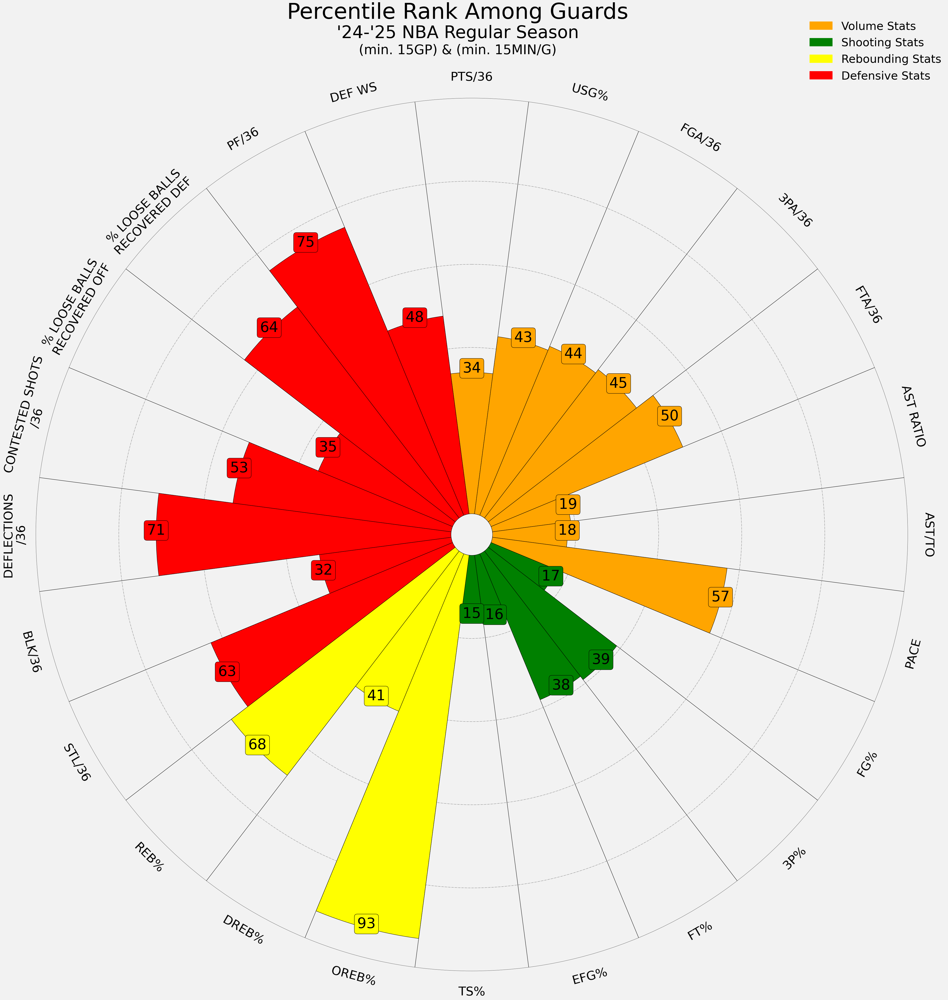

In [72]:
import scipy.stats as stats
from mplsoccer import PyPizza
import matplotlib.pyplot as plt

# Define columns to plot (matching the flattened names)
columns_to_plot = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS/36', 'CONTESTED SHOTS/36', '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF', "PF/36", "DEF WS" 
    # Add more columns if you want them in the pizza plot
]

# Choose a player
player_name = "Ja'Kobe Walter"  # example name
player_data = final_nba_df.loc[final_nba_df["PLAYER"] == player_name]

# Compute percentiles (inverting PF)
percentiles = []
for col in columns_to_plot:
    value = player_data[col].iloc[0]
    pct = stats.percentileofscore(final_nba_df[col].dropna(), value)
    if col == "PF":
        pct = 100 - pct
    percentiles.append(int(pct))

stat_names = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS\n/36', 'CONTESTED SHOTS\n/36', '% LOOSE BALLS\nRECOVERED OFF', '% LOOSE BALLS\nRECOVERED DEF', "PF/36", "DEF WS"
]

# Modified color settings:
slice_colors = ["orange"] * 8 + ["green"] * 5 + ["yellow"] * 3 + ["red"] * 8  # 4 orange, 2 yellow, 4 green (10 in total)
#text_colors = ["white"] * 10  # Ensure there are 10 text colors (one for each slice)

# Colors for slices and text
#slice_colors = ["cornflowerblue"] * len(stat_names)
text_colors = ["#000000"] * len(stat_names)

# Create a PyPizza object
baker = PyPizza(
    params=stat_names,
    straight_line_color="#000000",
    straight_line_lw=1,
    last_circle_lw=1,
    other_circle_lw=1,
    other_circle_ls="-."
)

# Create the pizza plot using the computed percentiles
fig, ax = baker.make_pizza(
    percentiles,                # List of percentile values
    figsize=(50, 50),
    param_location=105,
    slice_colors=slice_colors,
    value_colors=text_colors,
    value_bck_colors=slice_colors,
    kwargs_slices=dict(
        facecolor="cornflowerblue", edgecolor="#000000",
        zorder=2, linewidth=1
    ),
    kwargs_params=dict(
        color="#000000", fontsize=39,
        va="center"
    ),
    kwargs_values=dict(
        color="#000000", fontsize=46,
        zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="cornflowerblue",
            boxstyle="round,pad=0.2", lw=1
        )
    )
)

# Title
fig.text(
    0.5, 0.95,
    "Percentile Rank Among Guards",
    ha="center", fontsize=70, color="#000000"
)

fig.text(
    0.5, 0.933,  # Slightly lower y-position
    "'24-'25 NBA Regular Season",
    ha="center", fontsize=55, color="#000000"
)

# Subtitle with smaller font
fig.text(
    0.5, 0.919,
    "(min. 15GP) & (min. 15MIN/G)",
    ha="center", fontsize=42, color="#000000"
)

orange_patch = mpatches.Patch(color="orange", label="Volume Stats")
green_patch  = mpatches.Patch(color="green",  label="Shooting Stats")
yellow_patch  = mpatches.Patch(color="yellow",  label="Rebounding Stats")
red_patch    = mpatches.Patch(color="red",    label="Defensive Stats")

ax.legend(
    handles=[orange_patch, green_patch, yellow_patch, red_patch],
    loc="upper right",
    bbox_to_anchor=(1.05, 1.10),
    frameon=False,
    fontsize=36
)

plt.show()    

### Keldon Johnson

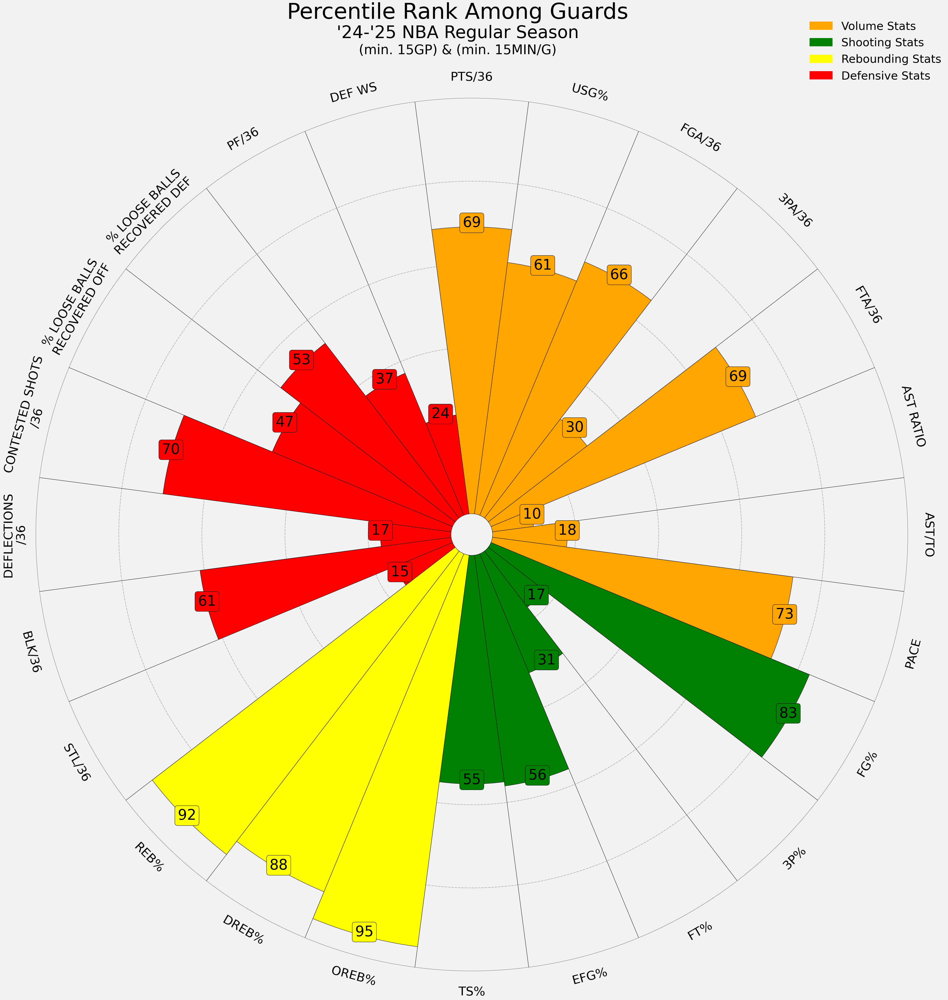

In [73]:
import scipy.stats as stats
from mplsoccer import PyPizza
import matplotlib.pyplot as plt

# Define columns to plot (matching the flattened names)
columns_to_plot = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS/36', 'CONTESTED SHOTS/36', '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF', "PF/36", "DEF WS" 
    # Add more columns if you want them in the pizza plot
]

# Choose a player
player_name = "Keldon Johnson"  # example name
player_data = final_nba_df.loc[final_nba_df["PLAYER"] == player_name]

# Compute percentiles (inverting PF)
percentiles = []
for col in columns_to_plot:
    value = player_data[col].iloc[0]
    pct = stats.percentileofscore(final_nba_df[col].dropna(), value)
    if col == "PF":
        pct = 100 - pct
    percentiles.append(int(pct))

stat_names = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS\n/36', 'CONTESTED SHOTS\n/36', '% LOOSE BALLS\nRECOVERED OFF', '% LOOSE BALLS\nRECOVERED DEF', "PF/36", "DEF WS"
]

# Modified color settings:
slice_colors = ["orange"] * 8 + ["green"] * 5 + ["yellow"] * 3 + ["red"] * 8  # 4 orange, 2 yellow, 4 green (10 in total)
#text_colors = ["white"] * 10  # Ensure there are 10 text colors (one for each slice)

# Colors for slices and text
#slice_colors = ["cornflowerblue"] * len(stat_names)
text_colors = ["#000000"] * len(stat_names)

# Create a PyPizza object
baker = PyPizza(
    params=stat_names,
    straight_line_color="#000000",
    straight_line_lw=1,
    last_circle_lw=1,
    other_circle_lw=1,
    other_circle_ls="-."
)

# Create the pizza plot using the computed percentiles
fig, ax = baker.make_pizza(
    percentiles,                # List of percentile values
    figsize=(50, 50),
    param_location=105,
    slice_colors=slice_colors,
    value_colors=text_colors,
    value_bck_colors=slice_colors,
    kwargs_slices=dict(
        facecolor="cornflowerblue", edgecolor="#000000",
        zorder=2, linewidth=1
    ),
    kwargs_params=dict(
        color="#000000", fontsize=39,
        va="center"
    ),
    kwargs_values=dict(
        color="#000000", fontsize=46,
        zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="cornflowerblue",
            boxstyle="round,pad=0.2", lw=1
        )
    )
)

# Title
fig.text(
    0.5, 0.95,
    "Percentile Rank Among Guards",
    ha="center", fontsize=70, color="#000000"
)

fig.text(
    0.5, 0.933,  # Slightly lower y-position
    "'24-'25 NBA Regular Season",
    ha="center", fontsize=55, color="#000000"
)

# Subtitle with smaller font
fig.text(
    0.5, 0.919,
    "(min. 15GP) & (min. 15MIN/G)",
    ha="center", fontsize=42, color="#000000"
)

orange_patch = mpatches.Patch(color="orange", label="Volume Stats")
green_patch  = mpatches.Patch(color="green",  label="Shooting Stats")
yellow_patch  = mpatches.Patch(color="yellow",  label="Rebounding Stats")
red_patch    = mpatches.Patch(color="red",    label="Defensive Stats")

ax.legend(
    handles=[orange_patch, green_patch, yellow_patch, red_patch],
    loc="upper right",
    bbox_to_anchor=(1.05, 1.10),
    frameon=False,
    fontsize=36
)

plt.show()    

### Brandon Boston

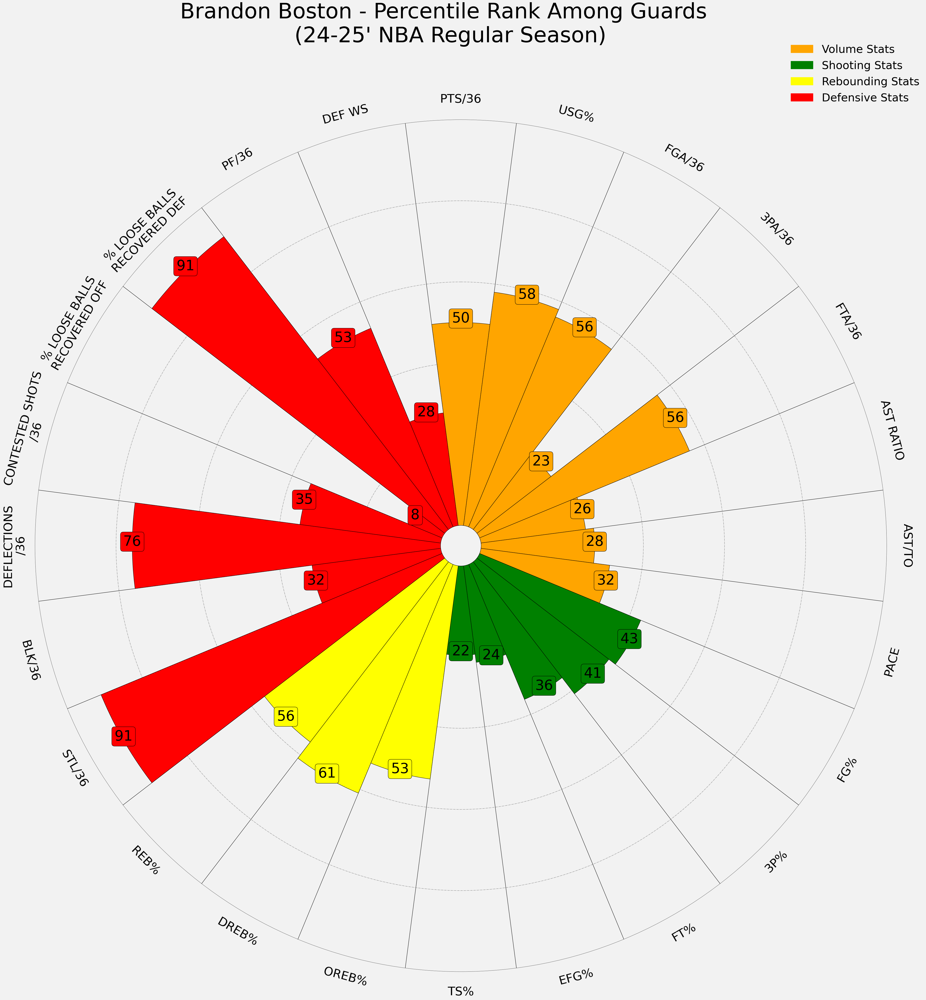

In [68]:
import scipy.stats as stats
from mplsoccer import PyPizza
import matplotlib.pyplot as plt

# Define columns to plot (matching the flattened names)
columns_to_plot = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS/36', 'CONTESTED SHOTS/36', '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF', "PF/36", "DEF WS" 
    # Add more columns if you want them in the pizza plot
]

# Choose a player
player_name = "Brandon Boston"  # example name
player_data = final_nba_df.loc[final_nba_df["PLAYER"] == player_name]

# Compute percentiles (inverting PF)
percentiles = []
for col in columns_to_plot:
    value = player_data[col].iloc[0]
    pct = stats.percentileofscore(final_nba_df[col].dropna(), value)
    if col == "PF":
        pct = 100 - pct
    percentiles.append(int(pct))

stat_names = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS\n/36', 'CONTESTED SHOTS\n/36', '% LOOSE BALLS\nRECOVERED OFF', '% LOOSE BALLS\nRECOVERED DEF', "PF/36", "DEF WS"
]

# Modified color settings:
slice_colors = ["orange"] * 8 + ["green"] * 5 + ["yellow"] * 3 + ["red"] * 8  # 4 orange, 2 yellow, 4 green (10 in total)
#text_colors = ["white"] * 10  # Ensure there are 10 text colors (one for each slice)

# Colors for slices and text
#slice_colors = ["cornflowerblue"] * len(stat_names)
text_colors = ["#000000"] * len(stat_names)

# Create a PyPizza object
baker = PyPizza(
    params=stat_names,
    straight_line_color="#000000",
    straight_line_lw=1,
    last_circle_lw=1,
    other_circle_lw=1,
    other_circle_ls="-."
)

# Create the pizza plot using the computed percentiles
fig, ax = baker.make_pizza(
    percentiles,                # List of percentile values
    figsize=(50, 50),
    param_location=105,
    slice_colors=slice_colors,
    value_colors=text_colors,
    value_bck_colors=slice_colors,
    kwargs_slices=dict(
        facecolor="cornflowerblue", edgecolor="#000000",
        zorder=2, linewidth=1
    ),
    kwargs_params=dict(
        color="#000000", fontsize=39,
        va="center"
    ),
    kwargs_values=dict(
        color="#000000", fontsize=46,
        zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="cornflowerblue",
            boxstyle="round,pad=0.2", lw=1
        )
    )
)

# Add a title displaying the player name
fig.text(0.5, 0.95, f"{player_name} - Percentile Rank Among Guards \n (24-25' NBA Regular Season)", ha="center", fontsize=70, color="#000000")

orange_patch = mpatches.Patch(color="orange", label="Volume Stats")
green_patch  = mpatches.Patch(color="green",  label="Shooting Stats")
yellow_patch  = mpatches.Patch(color="yellow",  label="Rebounding Stats")
red_patch    = mpatches.Patch(color="red",    label="Defensive Stats")

ax.legend(
    handles=[orange_patch, green_patch, yellow_patch, red_patch],
    loc="upper right",
    bbox_to_anchor=(1.05, 1.10),
    frameon=False,
    fontsize=36
)

plt.show()    

### Lonnie Walker IV

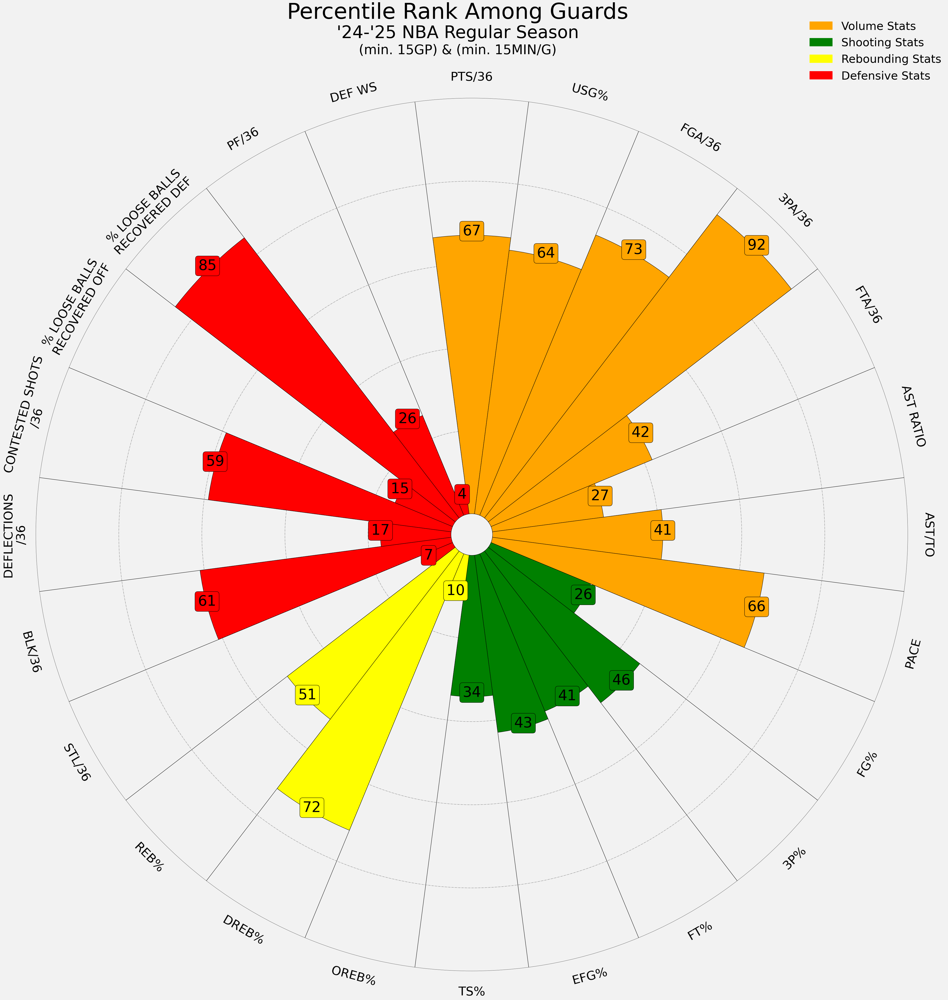

In [74]:
import scipy.stats as stats
from mplsoccer import PyPizza
import matplotlib.pyplot as plt

# Define columns to plot (matching the flattened names)
columns_to_plot = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS/36', 'CONTESTED SHOTS/36', '% LOOSE BALLS RECOVERED OFF', '% LOOSE BALLS RECOVERED DEF', "PF/36", "DEF WS" 
    # Add more columns if you want them in the pizza plot
]

# Choose a player
player_name = "Lonnie Walker IV"  # example name
player_data = final_nba_df.loc[final_nba_df["PLAYER"] == player_name]

# Compute percentiles (inverting PF)
percentiles = []
for col in columns_to_plot:
    value = player_data[col].iloc[0]
    pct = stats.percentileofscore(final_nba_df[col].dropna(), value)
    if col == "PF":
        pct = 100 - pct
    percentiles.append(int(pct))

stat_names = [
    "PTS/36", "USG%", "FGA/36", "3PA/36", "FTA/36", "AST RATIO", "AST/TO", "PACE",
    "FG%", "3P%", "FT%", "EFG%", "TS%",     
    "OREB%", "DREB%", "REB%",
    "STL/36", "BLK/36", 'DEFLECTIONS\n/36', 'CONTESTED SHOTS\n/36', '% LOOSE BALLS\nRECOVERED OFF', '% LOOSE BALLS\nRECOVERED DEF', "PF/36", "DEF WS"
]

# Modified color settings:
slice_colors = ["orange"] * 8 + ["green"] * 5 + ["yellow"] * 3 + ["red"] * 8  # 4 orange, 2 yellow, 4 green (10 in total)
#text_colors = ["white"] * 10  # Ensure there are 10 text colors (one for each slice)

# Colors for slices and text
#slice_colors = ["cornflowerblue"] * len(stat_names)
text_colors = ["#000000"] * len(stat_names)

# Create a PyPizza object
baker = PyPizza(
    params=stat_names,
    straight_line_color="#000000",
    straight_line_lw=1,
    last_circle_lw=1,
    other_circle_lw=1,
    other_circle_ls="-."
)

# Create the pizza plot using the computed percentiles
fig, ax = baker.make_pizza(
    percentiles,                # List of percentile values
    figsize=(50, 50),
    param_location=105,
    slice_colors=slice_colors,
    value_colors=text_colors,
    value_bck_colors=slice_colors,
    kwargs_slices=dict(
        facecolor="cornflowerblue", edgecolor="#000000",
        zorder=2, linewidth=1
    ),
    kwargs_params=dict(
        color="#000000", fontsize=39,
        va="center"
    ),
    kwargs_values=dict(
        color="#000000", fontsize=46,
        zorder=3,
        bbox=dict(
            edgecolor="#000000", facecolor="cornflowerblue",
            boxstyle="round,pad=0.2", lw=1
        )
    )
)

# Title
fig.text(
    0.5, 0.95,
    "Percentile Rank Among Guards",
    ha="center", fontsize=70, color="#000000"
)

fig.text(
    0.5, 0.933,  # Slightly lower y-position
    "'24-'25 NBA Regular Season",
    ha="center", fontsize=55, color="#000000"
)

# Subtitle with smaller font
fig.text(
    0.5, 0.919,
    "(min. 15GP) & (min. 15MIN/G)",
    ha="center", fontsize=42, color="#000000"
)
orange_patch = mpatches.Patch(color="orange", label="Volume Stats")
green_patch  = mpatches.Patch(color="green",  label="Shooting Stats")
yellow_patch  = mpatches.Patch(color="yellow",  label="Rebounding Stats")
red_patch    = mpatches.Patch(color="red",    label="Defensive Stats")

ax.legend(
    handles=[orange_patch, green_patch, yellow_patch, red_patch],
    loc="upper right",
    bbox_to_anchor=(1.05, 1.10),
    frameon=False,
    fontsize=36
)

plt.show()    

## Shot Density

### G League

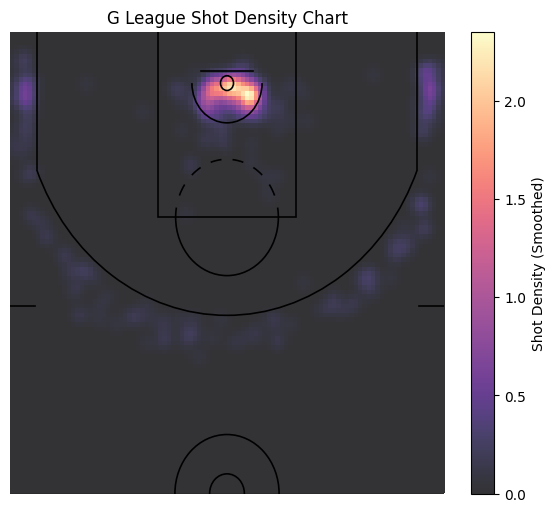

Radar plot saved to: C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_g_league_shot_density_chart.png


In [81]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from mplbasketball import Court
import numpy as np
from scipy.ndimage import gaussian_filter

# -------------------------------------------------------------------------
# 1. RETRIEVE YOUR SHOT DATA
# -------------------------------------------------------------------------

url = "https://stats.gleague.nba.com/stats/shotchartdetail"
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": (
        "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
        "AppleWebKit/537.36 (KHTML, like Gecko) "
        "Chrome/91.0.4472.124 Safari/537.36"
    ),
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/"
}
base_params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "FGA",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "20",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1612709920,
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}

all_shotchart_data = []
params = base_params.copy()
resp = requests.get(url, headers=headers, params=params)
if resp.status_code == 200:
    data = resp.json()
    shot_data = data["resultSets"][0]
    headers_list = shot_data["headers"]
    rows = shot_data["rowSet"]
        
    df_game = pd.DataFrame(rows, columns=headers_list)
    all_shotchart_data.append(df_game)
    
else:
    print(f"Request failed for GameID {game_id} with status code {resp.status_code}")

if not all_shotchart_data:
    raise ValueError("No data retrieved.")

all_shotchart_df = pd.concat(all_shotchart_data, ignore_index=True)

# -------------------------------------------------------------------------
# 2. NORMALIZE THE SHOT DATA
# -------------------------------------------------------------------------
all_shotchart_df["x_ft"] = all_shotchart_df["LOC_X"] / 10.0
all_shotchart_df["y_ft"] = all_shotchart_df["LOC_Y"] / 10.0
all_shotchart_df["y_ft"] = -all_shotchart_df["y_ft"]
all_shotchart_df["x_plot"] = all_shotchart_df["x_ft"]
all_shotchart_df["y_plot"] = all_shotchart_df["y_ft"] + 41.7

# -------------------------------------------------------------------------
# 3. BUILD A SMOOTH HEATMAP OVER HALF-COURT RANGE
#    (x in [-25, 25], y in [0, 47])
# -------------------------------------------------------------------------
xvals = all_shotchart_df["x_plot"].values
yvals = all_shotchart_df["y_plot"].values

# We'll clamp the histogram to the standard half-court range:
x_min, x_max = -25, 25
y_min, y_max = 0, 47

# Create bin edges
xbins = np.linspace(x_min, x_max, 101)  # 100 bins in x
ybins = np.linspace(y_min, y_max, 101)  # 100 bins in y

# Build a 2D histogram for shot density
heatmap, _, _ = np.histogram2d(xvals, yvals, bins=[xbins, ybins])

# Smooth the histogram with a Gaussian filter
heatmap_smooth = gaussian_filter(heatmap, sigma=1.5)

# -------------------------------------------------------------------------
# 4. PLOT THE SMOOTH HEATMAP
# -------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 6))

# Draw the half-court with center origin, top half orientation
court = Court(court_type="nba", origin="center", units="ft")
court.draw(ax=ax, orientation="vu")

# Show the smoothed heatmap with matching extent
extent = [x_min, x_max, y_min, y_max]
im = ax.imshow(
    heatmap_smooth.T,
    extent=extent,
    origin="lower",
    cmap="magma",
    alpha=0.8,
    aspect="auto"
)

# Force the axes to match the half-court range
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Colorbar
cb = plt.colorbar(im, ax=ax)
cb.set_label("Shot Density (Smoothed)")

ax.set_xlabel("X (ft)")
ax.set_ylabel("Y (ft)")
ax.set_title("G League Shot Density Chart")

plt.show()

import os

# Construct the save path
output_dir = r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis"
# Convert player name to slug format
player_slug = player_name.lower().replace(".", "").replace(" ", "_")

# Build filename using slug
filename = f"{player_slug}_g_league_shot_density_chart.png"

save_path = os.path.join(output_dir, filename)

fig.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"Radar plot saved to: {save_path}")

### NBA

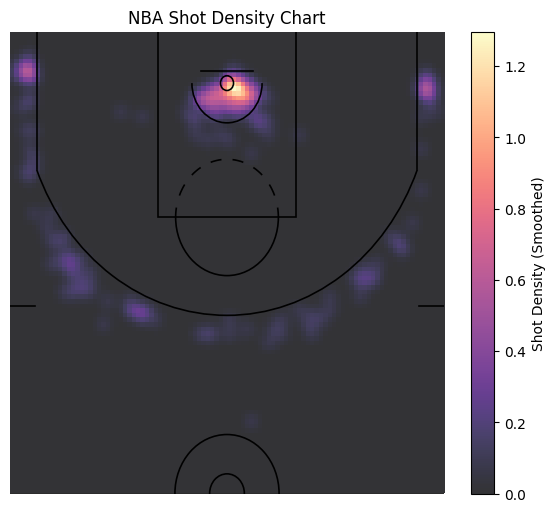

Radar plot saved to: C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_nba_shot_density_chart.png


In [82]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from mplbasketball import Court
import numpy as np
from scipy.ndimage import gaussian_filter

# -------------------------------------------------------------------------
# 1. RETRIEVE YOUR SHOT DATA
# -------------------------------------------------------------------------

url = "https://stats.nba.com/stats/shotchartdetail"
headers = {
    "Host": "stats.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": (
        "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
        "AppleWebKit/537.36 (KHTML, like Gecko) "
        "Chrome/91.0.4472.124 Safari/537.36"
    ),
    "Origin": "https://stats.nba.com",
    "Referer": "https://stats.nba.com/"
}
base_params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "FGA",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "00",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1610612761,
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}

all_shotchart_data = []
params = base_params.copy()
resp = requests.get(url, headers=headers, params=params)
if resp.status_code == 200:
    data = resp.json()
    shot_data = data["resultSets"][0]
    headers_list = shot_data["headers"]
    rows = shot_data["rowSet"]
        
    df_game = pd.DataFrame(rows, columns=headers_list)
    all_shotchart_data.append(df_game)
    
else:
    print(f"Request failed for GameID {game_id} with status code {resp.status_code}")

if not all_shotchart_data:
    raise ValueError("No data retrieved.")

all_shotchart_df = pd.concat(all_shotchart_data, ignore_index=True)

# -------------------------------------------------------------------------
# 2. NORMALIZE THE SHOT DATA
# -------------------------------------------------------------------------
all_shotchart_df["x_ft"] = all_shotchart_df["LOC_X"] / 10.0
all_shotchart_df["y_ft"] = all_shotchart_df["LOC_Y"] / 10.0
all_shotchart_df["y_ft"] = -all_shotchart_df["y_ft"]
all_shotchart_df["x_plot"] = all_shotchart_df["x_ft"]
all_shotchart_df["y_plot"] = all_shotchart_df["y_ft"] + 41.7

# -------------------------------------------------------------------------
# 3. BUILD A SMOOTH HEATMAP OVER HALF-COURT RANGE
#    (x in [-25, 25], y in [0, 47])
# -------------------------------------------------------------------------
xvals = all_shotchart_df["x_plot"].values
yvals = all_shotchart_df["y_plot"].values

# We'll clamp the histogram to the standard half-court range:
x_min, x_max = -25, 25
y_min, y_max = 0, 47

# Create bin edges
xbins = np.linspace(x_min, x_max, 101)  # 100 bins in x
ybins = np.linspace(y_min, y_max, 101)  # 100 bins in y

# Build a 2D histogram for shot density
heatmap, _, _ = np.histogram2d(xvals, yvals, bins=[xbins, ybins])

# Smooth the histogram with a Gaussian filter
heatmap_smooth = gaussian_filter(heatmap, sigma=1.5)

# -------------------------------------------------------------------------
# 4. PLOT THE SMOOTH HEATMAP
# -------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 6))

# Draw the half-court with center origin, top half orientation
court = Court(court_type="nba", origin="center", units="ft")
court.draw(ax=ax, orientation="vu")

# Show the smoothed heatmap with matching extent
extent = [x_min, x_max, y_min, y_max]
im = ax.imshow(
    heatmap_smooth.T,
    extent=extent,
    origin="lower",
    cmap="magma",
    alpha=0.8,
    aspect="auto"
)

# Force the axes to match the half-court range
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Colorbar
cb = plt.colorbar(im, ax=ax)
cb.set_label("Shot Density (Smoothed)")

ax.set_xlabel("X (ft)")
ax.set_ylabel("Y (ft)")
ax.set_title("NBA Shot Density Chart")

plt.show()

import os

# Construct the save path
output_dir = r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis"
# Convert player name to slug format
player_slug = player_name.lower().replace(".", "").replace(" ", "_")

# Build filename using slug
filename = f"{player_slug}_nba_shot_density_chart.png"

save_path = os.path.join(output_dir, filename)

fig.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"Radar plot saved to: {save_path}")

# Efficiency Charts

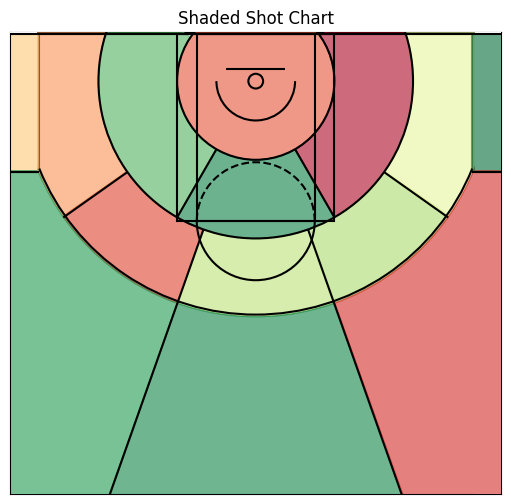

In [27]:
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge, Circle, Arc, Rectangle
import matplotlib.cm as cm
import numpy as np

# -------------------------------------------------------------------------
# 1. DRAW THE COURT FUNCTION (WITH SHOT ZONE LINES)
# -------------------------------------------------------------------------
def draw_court(ax=None, color="black", lw=1.5, shotzone=False, outer_lines=True):
    """Draws an NBA court with optional shot zones."""
    if ax is None:
        ax = plt.gca()

    # Create various court elements
    hoop = Circle((0, 0), radius=7.5, linewidth=lw, color=color, fill=False, zorder=12)
    backboard = Rectangle((-30, -12.5), 60, 0, linewidth=lw, color=color, zorder=12)
    outer_box = Rectangle((-80, -47.5), 160, 190, linewidth=lw, color=color, fill=False, zorder=12)
    inner_box = Rectangle((-60, -47.5), 120, 190, linewidth=lw, color=color, fill=False, zorder=12)
    top_free_throw = Arc((0, 142.5), 120, 120, theta1=0, theta2=180, linewidth=lw, color=color, fill=False, zorder=12)
    bottom_free_throw = Arc((0, 142.5), 120, 120, theta1=180, theta2=0, linewidth=lw, color=color, linestyle='dashed', zorder=12)
    restricted = Arc((0, 0), 80, 80, theta1=0, theta2=180, linewidth=lw, color=color, zorder=12)
    corner_three_a = Rectangle((-220, -47.5), 0, 140, linewidth=lw, color=color)
    corner_three_b = Rectangle((220, -47.5), 0, 140, linewidth=lw, color=color)
    three_arc = Arc((0, 0), 475, 475, theta1=22, theta2=158, linewidth=lw, color=color, zorder=16)

    court_elements = [hoop, backboard, outer_box, inner_box, top_free_throw,
                      bottom_free_throw, restricted, corner_three_a, corner_three_b, three_arc]
        
    # Shotzone lines
    if shotzone:
        inner_circle = Circle((0, 0), radius=80, linewidth=lw, color='black', fill=False, zorder=12)
        outer_circle = Circle((0, 0), radius=160, linewidth=lw, color='black', fill=False, zorder=12)
        corner_three_a_x = Rectangle((-250, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Right
        corner_three_b_x = Rectangle((220, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Left
        inner_line_1 = Rectangle((40, 69.28), 80, 0, angle=60, linewidth=lw, color='black', zorder=12)  # Left Midrange (8-16ft.)
        inner_line_2 = Rectangle((-40, 69.28), 80, 0, angle=120, linewidth=lw, color='black', zorder=12) #Right midrange (8-16ft.)
        inner_line_3 = Rectangle((53.20, 150.89), 290, 0, angle=70.53, linewidth=lw, color='black', zorder=12) #Center Left 3 Point line
        inner_line_4 = Rectangle((-53.20, 150.89), 290, 0, angle=109.47, linewidth=lw, color='black', zorder=12) #Center Right 3 Point line
        inner_line_5 = Rectangle((130.54, 92.5), 80, 0, angle=35.32, linewidth=lw, color='black', zorder=12) #Left midrange (16-24ft.)        
        inner_line_6 = Rectangle((-130.54, 92.5), 80, 0, angle=144.68, linewidth=lw, color='black', zorder=12) #Right midrange (16-24ft.)
        
        court_elements.extend([inner_circle, outer_circle, corner_three_a_x, corner_three_b_x, inner_line_1, inner_line_2, inner_line_3, inner_line_4, inner_line_5, inner_line_6])

    # Add out-of-bounds lines
    if outer_lines:
        outer_lines = Rectangle((-250, -47.5), 500, 470, linewidth=lw, color=color, fill=False)
        court_elements.append(outer_lines)

    # Add court elements to the plot
    for element in court_elements:
        ax.add_patch(element)

    return ax

# -------------------------------------------------------------------------
# 2. SHADE MIDRANGE AREAS (8-16 FT.) USING WEDGES
# -------------------------------------------------------------------------

# **Midrange Zones Definitions**
midrange_zones = {
    "inner_circle": {"center": (0, 0), "inner_radius": 0, "outer_radius": 80, "theta1": -90, "theta2": 270},
    "left_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": -33.9, "theta2": 60},
    "center_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 60.1, "theta2": 120},
    "right_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 120.1, "theta2": 215},
    "left_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": -33.9, "theta2": 35},
    "left_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 35.1, "theta2": 70.5},
    "center_midrange_16-24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 70.6, "theta2": 109.5},
    "right_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 109.6, "theta2": 145},
    "right_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 145.1, "theta2": 200},
    "left_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": -30, "theta2": 70.5},
    "center_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 460, "theta1": 70.6, "theta2": 109.5},
    "right_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": 109.6, "theta2": 215}    
}

# **Generate colors for each zone (example: efficiency-based)**
cmap = cm.RdYlGn
efficiency_values = {zone: np.random.uniform(-0.2, 0.2) for zone in midrange_zones}
colors = {zone: cmap((efficiency_values[zone] + 0.2) / 0.4) for zone in midrange_zones}

# ✅ Generate a color for the left corner three shading
efficiency_value_corner_left = np.random.uniform(-0.2, 0.2)  # Example efficiency difference
color_corner_left = cmap((efficiency_value_corner_left + 0.2) / 0.4)  # Normalize between -0.2 and +0.2

# ✅ Generate a color for the right corner three shading
efficiency_value_corner_right = np.random.uniform(-0.2, 0.2)  # Example efficiency difference
color_corner_right = cmap((efficiency_value_corner_right + 0.2) / 0.4)  # Normalize between -0.2 and +0.2

# -------------------------------------------------------------------------
# 3. PLOT COURT WITH SHADED MIDRANGE AREAS
# -------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 6))

# ✅ Draw the court
draw_court(ax, color="black", lw=1.5, shotzone=True, outer_lines=True)

# ✅ Flip the court 180° by reversing xlim and ylim
ax.set_xlim(250, -250)
ax.set_ylim(420, -50)

# ✅ Shade All Midrange Areas
for key, zone in midrange_zones.items():
    wedge = Wedge(
        zone["center"],
        zone["outer_radius"],
        zone["theta1"],
        zone["theta2"],
        width=zone["outer_radius"] - zone["inner_radius"],
        color=colors[key], alpha=0.6, zorder=5
    )
    ax.add_patch(wedge)

# ✅ Step 4: Add Fully Transparent White Overlay for Both Sides
overlay_left = Rectangle((223, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Left Side
overlay_right = Rectangle((-473, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Right Side

ax.add_patch(overlay_left)
ax.add_patch(overlay_right)

# ✅ Step 5: **Re-add the missing court lines on top of the overlay**
#ax.add_patch(Rectangle((-250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Right Sideline
ax.add_patch(Rectangle((-250, -47.5), 500, 0, linewidth=1.5, color="black", zorder=16))  # Baseline
ax.add_patch(Rectangle((250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Left Sideline

# ✅ **Re-add the Corner Three-Point Lines on Top of the Overlay**
ax.add_patch(Rectangle((220, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))   # Left Corner Three
ax.add_patch(Rectangle((-250, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))  # Right Corner Three

left_corner_three_shade = Rectangle(
    (220, -47.5), 30, 140, facecolor=color_corner_left, alpha=0.6, zorder=11
)
right_corner_three_shade = Rectangle(
    (-250, -47.5), 30, 140, facecolor=color_corner_right, alpha=0.6, zorder=11
)

ax.add_patch(left_corner_three_shade)
ax.add_patch(right_corner_three_shade)

# ✅ **Redraw the left and right above-the-break three areas**
left_above_break_shade = Rectangle(
    (223, 90), 250, 400, facecolor=colors["left_above_the_break_3"], alpha=0.6, zorder=11
)

right_above_break_shade = Rectangle(
    (-473, 90), 250, 400, facecolor=colors["right_above_the_break_3"], alpha=0.6, zorder=11
)


ax.add_patch(left_above_break_shade)
ax.add_patch(right_above_break_shade)

# ✅ Ensure aspect ratio
ax.set_aspect("equal")

# Remove axis labels
ax.set_xticks([])
ax.set_yticks([])

# Set title
ax.set_title("Shaded Shot Chart")

# Show plot
plt.show()

## G League

In [85]:
import requests
import pandas as pd
import numpy as np

# -------------------------------------------------------------------------
# 1. RETRIEVE A.J. LAWSON'S SHOT DATA
# -------------------------------------------------------------------------

url = "https://stats.gleague.nba.com/stats/shotchartdetail"
headers = {"User-Agent": "Mozilla/5.0"}

params = {
    "AheadBehind": "", "CFID": "", "CFPARAMS": "", "ClutchTime": "", "Conference": "",
    "ContextFilter": "", "ContextMeasure": "FGM", "DateFrom": "", "DateTo": "",
    "Division": "", "EndPeriod": 10, "EndRange": 28800, "GROUP_ID": "",
    "GameEventID": "", "GameSegment": "", "GroupID": "", "GroupMode": "",
    "GroupQuantity": 5, "LastNGames": 0, "LeagueID": "20", "Location": "",
    "Month": 0, "OnOff": "", "OpponentTeamID": 0, "Outcome": "", "PORound": 0,
    "Period": 0, "PlayerID": 1630639, "Season": "2024-25", "SeasonType": "Regular Season",
    "ShotClockRange": "", "StartPeriod": 1, "StartRange": 0, "StarterBench": "",
    "TeamID": 1612709920, "VsConference": "", "VsDivision": "", "VsPlayerID1": "",
    "VsPlayerID2": "", "VsPlayerID3": "", "VsPlayerID4": "", "VsPlayerID5": "",
    "VsTeamID": ""
}

all_shots = []
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()
    shot_data = data["resultSets"][0]
    df_game = pd.DataFrame(shot_data["rowSet"], columns=shot_data["headers"])
    all_shots.append(df_game)

if all_shots:
    shots_df = pd.concat(all_shots, ignore_index=True)
else:
    raise ValueError("No shot data retrieved.")

# -------------------------------------------------------------------------
# 2. PROCESS A.J. LAWSON'S SHOT DATA
# -------------------------------------------------------------------------
shots_df["x_plot"] = -shots_df["LOC_X"]
shots_df["y_plot"] = shots_df["LOC_Y"]

# Assign shot makes/misses
shots_df["SHOT_MADE_FLAG"] = shots_df["EVENT_TYPE"].apply(lambda x: 1 if x == "Made Shot" else 0)

# ✅ Fix Shot Zone Labels (Inner Circle Mapping Fix)
def create_zone_label(row):
    if row["SHOT_ZONE_BASIC"] == "Restricted Area" and row["SHOT_ZONE_AREA"] == "Center(C)":
        return ("Inner Circle", "Center", "Less Than 8 ft.")  # Correctly match computed league avg.
    if row["SHOT_ZONE_BASIC"] == "In The Paint (Non-RA)" and row["SHOT_ZONE_AREA"] == "Center(C)" and row["SHOT_ZONE_RANGE"] == "Less Than 8 ft.":
        return ("Inner Circle", "Center", "Less Than 8 ft.")  # Also map here for consistency
    return (row["SHOT_ZONE_BASIC"], row["SHOT_ZONE_AREA"], row["SHOT_ZONE_RANGE"])  # Default for other zones

shots_df["Zone_Label"] = shots_df.apply(create_zone_label, axis=1)

# -------------------------------------------------------------------------
# 3. RETRIEVE MOST RECENT LEAGUE AVERAGES
# -------------------------------------------------------------------------
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()
    for dataset in data["resultSets"]:
        if dataset["name"] == "LeagueAverages":
            league_avg_headers = dataset["headers"]
            league_avg_rows = dataset["rowSet"]
            df_league_avg = pd.DataFrame(league_avg_rows, columns=league_avg_headers)

# Mapping shot zones
league_averages = {}
total_inner_fgm = 0  # Track total makes for inner circle
total_inner_fga = 0  # Track total attempts for inner circle
left_side_fgm = 0    # Track makes for left side combination
left_side_fga = 0    # Track attempts for left side combination
right_side_fgm = 0   # Track makes for right side combination
right_side_fga = 0   # Track attempts for right side combination
center_paint_fgm = 0 # Track makes for center 8-16 ft. combination
center_paint_fga = 0 # Track attempts for center 8-16 ft. combination

for _, row in df_league_avg.iterrows():
    shot_zone = (row["SHOT_ZONE_BASIC"], row["SHOT_ZONE_AREA"], row["SHOT_ZONE_RANGE"])
    
    # Combine FG% for "Inner Circle"
    if shot_zone in [
        ("In The Paint (Non-RA)", "Center(C)", "Less Than 8 ft."),
        ("Restricted Area", "Center(C)", "Less Than 8 ft.")
    ]:
        total_inner_fgm += row["FGM"]
        total_inner_fga += row["FGA"]
    
    # Combine FG% for "Left Side (8-16 ft.)"
    elif shot_zone in [
        ("In The Paint (Non-RA)", "Left Side(L)", "8-16 ft."),
        ("Mid-Range", "Left Side(L)", "8-16 ft.")
    ]:
        left_side_fgm += row["FGM"]
        left_side_fga += row["FGA"]

    # Combine FG% for "Right Side (8-16 ft.)"
    elif shot_zone in [
        ("In The Paint (Non-RA)", "Right Side(R)", "8-16 ft."),
        ("Mid-Range", "Right Side(R)", "8-16 ft.")
    ]:
        right_side_fgm += row["FGM"]
        right_side_fga += row["FGA"]

    # Combine FG% for "Center (8-16 ft.)"
    elif shot_zone in [
        ("In The Paint (Non-RA)", "Center(C)", "8-16 ft."),
        ("Mid-Range", "Center(C)", "8-16 ft.")
    ]:
        center_paint_fgm += row["FGM"]
        center_paint_fga += row["FGA"]
        
    else:
        league_averages[shot_zone] = row["FG_PCT"]

# Compute combined FG% for "Inner Circle"
if total_inner_fga > 0:
    league_averages[("Inner Circle", "Center", "Less Than 8 ft.")] = total_inner_fgm / total_inner_fga

# Compute combined FG% for "Left Side (8-16 ft.)"
if left_side_fga > 0:
    league_averages[("Mid-Range", "Left Side(L)", "8-16 ft.")] = left_side_fgm / left_side_fga

# Compute combined FG% for "Right Side (8-16 ft.)"
if right_side_fga > 0:
    league_averages[("Mid-Range", "Right Side(R)", "8-16 ft.")] = right_side_fgm / right_side_fga

# Compute combined FG% for "Center (8-16 ft.)"
if center_paint_fga > 0:
    league_averages[("In The Paint (Non-RA)", "Center(C)", "8-16 ft.")] = center_paint_fgm / center_paint_fga

# -------------------------------------------------------------------------
# 4. COMPUTE EFFICIENCY DIFFERENCE
# -------------------------------------------------------------------------
# ✅ Debugging missing values before filling them
unmatched_zones = shots_df[~shots_df["Zone_Label"].isin(league_averages.keys())]["Zone_Label"].unique()
#print("⚠️ Unmatched Zones:", unmatched_zones)

# ✅ Map league averages
shots_df["League_Avg"] = shots_df["Zone_Label"].map(league_averages)

# ✅ Print missing values count
#print("⚠️ Missing League_Avg values count:", shots_df["League_Avg"].isna().sum())

# ✅ Fill remaining NaNs
shots_df["League_Avg"] = shots_df["League_Avg"].fillna(0.35)

# ✅ Compute Shooting Percentage & Efficiency Difference
shots_df["ShotPct"] = shots_df.groupby("Zone_Label")["SHOT_MADE_FLAG"].transform("mean")
shots_df["EffDiff"] = shots_df["ShotPct"] - shots_df["League_Avg"]

shots_df

,GRID_TYPE,GAME_ID,GAME_EVENT_ID,PLAYER_ID,PLAYER_NAME,TEAM_ID,TEAM_NAME,PERIOD,MINUTES_REMAINING,SECONDS_REMAINING,EVENT_TYPE,ACTION_TYPE,SHOT_TYPE,SHOT_ZONE_BASIC,SHOT_ZONE_AREA,SHOT_ZONE_RANGE,SHOT_DISTANCE,LOC_X,LOC_Y,SHOT_ATTEMPTED_FLAG,SHOT_MADE_FLAG,GAME_DATE,HTM,VTM,x_plot,y_plot,Zone_Label,League_Avg,ShotPct,EffDiff
0,Shot Chart Detail,2022400001,22,1630639,A.J. Lawson,1612709920,Raptors 905,1,10,32,Missed Shot,Jump Shot,3PT Field Goal,Above the Break 3,Center(C),24+ ft.,24,-7,242,1,0,20241227,RAP,BHM,7,242,"(Above the Break 3, Center(C), 24+ ft.)",0.349000,0.409091,0.060091
1,Shot Chart Detail,2022400001,62,1630639,A.J. Lawson,1612709920,Raptors 905,1,6,56,Missed Shot,Running Jump Shot,3PT Field Goal,Above the Break 3,Left Side Center(LC),24+ ft.,26,-227,134,1,0,20241227,RAP,BHM,227,134,"(Above the Break 3, Left Side Center(LC), 24+ ...",0.340000,0.200000,-0.140000
2,Shot Chart Detail,2022400001,86,1630639,A.J. Lawson,1612709920,Raptors 905,1,5,31,Made Shot,Driving Finger Roll Layup Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,2,20,6,1,1,20241227,RAP,BHM,-20,6,"(Inner Circle, Center, Less Than 8 ft.)",0.581392,0.494792,-0.086600
3,Shot Chart Detail,2022400001,210,1630639,A.J. Lawson,1612709920,Raptors 905,2,10,7,Made Shot,Pullup Jump shot,3PT Field Goal,Above the Break 3,Left Side Center(LC),24+ ft.,26,-109,242,1,1,20241227,RAP,BHM,109,242,"(Above the Break 3, Left Side Center(LC), 24+ ...",0.340000,0.200000,-0.140000
4,Shot Chart Detail,2022400001,217,1630639,A.J. Lawson,1612709920,Raptors 905,2,9,26,Missed Shot,Jump Shot,3PT Field Goal,Above the Break 3,Right Side Center(RC),24+ ft.,26,206,171,1,0,20241227,RAP,BHM,-206,171,"(Above the Break 3, Right Side Center(RC), 24+...",0.346000,0.468750,0.122750
5,Shot Chart Detail,2022400001,219,1630639,A.J. Lawson,1612709920,Raptors 905,2,9,22,Made Shot,Cutting Dunk Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,0,0,9,1,1,20241227,RAP,BHM,0,9,"(Inner Circle, Center, Less Than 8 ft.)",0.581392,0.494792,-0.086600
6,Shot Chart Detail,2022400001,326,1630639,A.J. Lawson,1612709920,Raptors 905,2,2,22,Missed Shot,Jump Shot,3PT Field Goal,Right Corner 3,Right Side(R),24+ ft.,23,234,15,1,0,20241227,RAP,BHM,-234,15,"(Right Corner 3, Right Side(R), 24+ ft.)",0.381000,0.419355,0.038355
7,Shot Chart Detail,2022400001,339,1630639,A.J. Lawson,1612709920,Raptors 905,2,1,12,Missed Shot,Jump Shot,3PT Field Goal,Left Corner 3,Left Side(L),24+ ft.,23,-230,22,1,0,20241227,RAP,BHM,230,22,"(Left Corner 3, Left Side(L), 24+ ft.)",0.377000,0.379310,0.002310
8,Shot Chart Detail,2022400001,377,1630639,A.J. Lawson,1612709920,Raptors 905,3,11,7,Made Shot,Running Finger Roll Layup Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,1,-18,2,1,1,20241227,RAP,BHM,18,2,"(Inner Circle, Center, Less Than 8 ft.)",0.581392,0.494792,-0.086600
9,Shot Chart Detail,2022400001,385,1630639,A.J. Lawson,1612709920,Raptors 905,3,10,40,Missed Shot,Jump Shot,3PT Field Goal,Above the Break 3,Right Side Center(RC),24+ ft.,25,223,122,1,0,20241227,RAP,BHM,-223,122,"(Above the Break 3, Right Side Center(RC), 24+...",0.346000,0.468750,0.122750


In [71]:
shots_df_filtered = shots_df[
    (shots_df["GAME_ID"] == "2022400287") & (shots_df["GAME_EVENT_ID"] == 560)
]
shots_df_filtered

,GRID_TYPE,GAME_ID,GAME_EVENT_ID,PLAYER_ID,PLAYER_NAME,TEAM_ID,TEAM_NAME,PERIOD,MINUTES_REMAINING,SECONDS_REMAINING,EVENT_TYPE,ACTION_TYPE,SHOT_TYPE,SHOT_ZONE_BASIC,SHOT_ZONE_AREA,SHOT_ZONE_RANGE,SHOT_DISTANCE,LOC_X,LOC_Y,SHOT_ATTEMPTED_FLAG,SHOT_MADE_FLAG,GAME_DATE,HTM,VTM,GameID,x_plot,y_plot,Zone_Label,League_Avg,ShotPct,EffDiff
81,Shot Chart Detail,2022400287,560,1630639,A.J. Lawson,1612709920,Raptors 905,4,10,26,Missed Shot,Driving Floating Jump Shot,2PT Field Goal,Mid-Range,Left Side(L),8-16 ft.,10,-96,30,1,0,20250213,RAP,CLC,2022400287,96,30,"(Mid-Range, Left Side(L), 8-16 ft.)",0.396812,0.0,-0.396812


In [68]:
# ✅ Group by 'ACTION_TYPE' only
grouped_df = shots_df.groupby("ACTION_TYPE").agg(
    Total_Shots=("SHOT_MADE_FLAG", "count"),
    Made_Shots=("SHOT_MADE_FLAG", "sum"),
    ShotPct=("SHOT_MADE_FLAG", "mean")
).reset_index()

# ✅ Drop the 'League_Avg' column (if it exists)
grouped_df = grouped_df.drop(columns=["League_Avg"], errors='ignore')

# ✅ Calculate the Proportion column
total_shots_overall = grouped_df["Total_Shots"].sum()
grouped_df["Proportion"] = grouped_df["Total_Shots"] / total_shots_overall

# ✅ Sort by 'Total_Shots' in descending order
grouped_df = grouped_df.sort_values(by="Total_Shots", ascending=False).reset_index(drop=True)

# ✅ Display the updated DataFrame
from IPython.display import display
display(grouped_df)

,ACTION_TYPE,Total_Shots,Made_Shots,ShotPct,Proportion
0,Jump Shot,124,46,0.370968,0.354286
1,Driving Layup Shot,50,16,0.320000,0.142857
2,Layup Shot,22,10,0.454545,0.062857
3,Driving Finger Roll Layup Shot,19,10,0.526316,0.054286
4,Running Layup Shot,16,9,0.562500,0.045714
5,Cutting Layup Shot,14,8,0.571429,0.040000
6,Pullup Jump shot,12,3,0.250000,0.034286
7,Driving Floating Jump Shot,12,2,0.166667,0.034286
8,Running Dunk Shot,10,10,1.000000,0.028571
9,Running Finger Roll Layup Shot,7,6,0.857143,0.020000


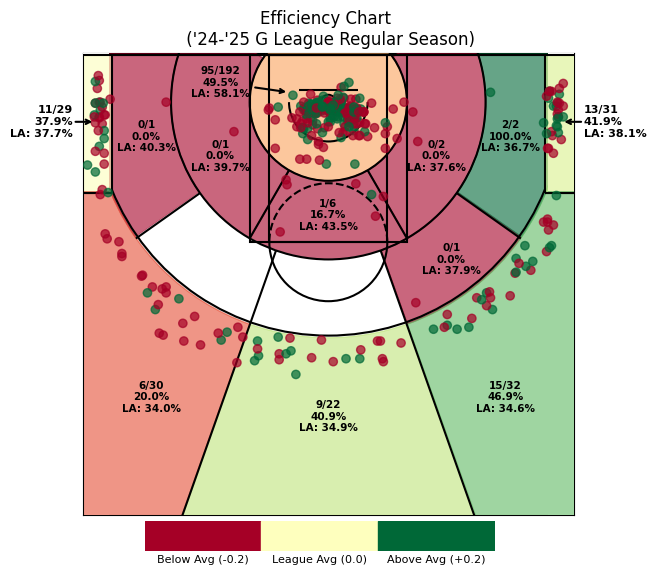

Radar plot saved to: C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_g_league_efficiency_chart.png


In [86]:
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge, Circle, Arc, Rectangle
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import matplotlib.colorbar as cbar
import numpy as np
from matplotlib.patches import FancyBboxPatch

# -------------------------------------------------------------------------
# 1. DRAW THE COURT FUNCTION (WITH SHOT ZONE LINES)
# -------------------------------------------------------------------------
def draw_court(ax=None, color="black", lw=1.5, shotzone=False, outer_lines=True):
    """Draws an NBA court with optional shot zones."""
    if ax is None:
        ax = plt.gca()

    # Create various court elements
    hoop = Circle((0, 0), radius=7.5, linewidth=lw, color=color, fill=False, zorder=16)
    backboard = Rectangle((-30, -12.5), 60, 0, linewidth=lw, color=color, zorder=16)
    outer_box = Rectangle((-80, -47.5), 160, 190, linewidth=lw, color=color, fill=False, zorder=16)
    inner_box = Rectangle((-60, -47.5), 120, 190, linewidth=lw, color=color, fill=False, zorder=12)
    top_free_throw = Arc((0, 142.5), 120, 120, theta1=0, theta2=180, linewidth=lw, color=color, fill=False, zorder=16)
    bottom_free_throw = Arc((0, 142.5), 120, 120, theta1=180, theta2=0, linewidth=lw, color=color, linestyle='dashed', zorder=16)
    restricted = Arc((0, 0), 80, 80, theta1=0, theta2=180, linewidth=lw, color=color, zorder=16)
    corner_three_a = Rectangle((-220, -47.5), 0, 140, linewidth=lw, color=color, zorder=16)
    corner_three_b = Rectangle((220, -47.5), 0, 140, linewidth=lw, color=color, zorder=16)
    three_arc = Arc((0, 0), 475, 475, theta1=22, theta2=158, linewidth=lw, color=color, zorder=16)

    court_elements = [hoop, backboard, outer_box, inner_box, top_free_throw,
                      bottom_free_throw, restricted, corner_three_a, corner_three_b, three_arc]
    
    # Shotzone lines
    if shotzone:
        inner_circle = Circle((0, 0), radius=80, linewidth=lw, color='black', fill=False, zorder=12)
        outer_circle = Circle((0, 0), radius=160, linewidth=lw, color='black', fill=False, zorder=12)
        corner_three_a_x = Rectangle((-250, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Right
        corner_three_b_x = Rectangle((220, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Left
        inner_line_1 = Rectangle((40, 69.28), 80, 0, angle=60, linewidth=lw, color='black', zorder=12)  # Left Midrange (8-16ft.)
        inner_line_2 = Rectangle((-40, 69.28), 80, 0, angle=120, linewidth=lw, color='black', zorder=12) #Right midrange (8-16ft.)
        inner_line_3 = Rectangle((53.20, 150.89), 290, 0, angle=70.53, linewidth=lw, color='black', zorder=12) #Center Left 3 Point line
        inner_line_4 = Rectangle((-53.20, 150.89), 290, 0, angle=109.47, linewidth=lw, color='black', zorder=12) #Center Right 3 Point line
        inner_line_5 = Rectangle((130.54, 92.5), 80, 0, angle=35.32, linewidth=lw, color='black', zorder=12) #Left midrange (16-24ft.)        
        inner_line_6 = Rectangle((-130.54, 92.5), 80, 0, angle=144.68, linewidth=lw, color='black', zorder=12) #Right midrange (16-24ft.)
        
        court_elements.extend([inner_circle, outer_circle, corner_three_a_x, corner_three_b_x, inner_line_1, inner_line_2, inner_line_3, inner_line_4, inner_line_5, inner_line_6])

    # Add out-of-bounds lines
    if outer_lines:
        court_boundary = Rectangle((-250, -47.5), 500, 470, linewidth=lw, color=color, fill=False)
        court_elements.append(court_boundary)

    for element in court_elements:
        ax.add_patch(element)

    return ax

# -------------------------------------------------------------------------
# 2. DEFINE MIDRANGE ZONES
# -------------------------------------------------------------------------
midrange_zones = {
    "inner_circle": {"center": (0, 0), "inner_radius": 0, "outer_radius": 80, "theta1": -90, "theta2": 270},
    "left_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": -33.9, "theta2": 60},
    "center_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 60.1, "theta2": 120},
    "right_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 120.1, "theta2": 215},
    "left_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": -33.9, "theta2": 35},
    "left_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 35.1, "theta2": 70.5},
    "center_midrange_16-24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 70.6, "theta2": 109.5},
    "right_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 109.6, "theta2": 145},
    "right_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 145.1, "theta2": 200},
    "left_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": -30, "theta2": 70.5},
    "center_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 460, "theta1": 70.6, "theta2": 109.5},
    "right_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": 109.6, "theta2": 215}    
}

# -------------------------------------------------------------------------
# 3. MAP EFFICIENCY TO SHADING COLORS
# -------------------------------------------------------------------------
# Define mapping between midrange zones and shot zones
zone_map = {
    "center_above_the_break_3": ("Above the Break 3", "Center(C)", "24+ ft."),
    "left_above_the_break_3": ("Above the Break 3", "Left Side Center(LC)", "24+ ft."),
    "right_above_the_break_3": ("Above the Break 3", "Right Side Center(RC)", "24+ ft."),
    "center_midrange_8_16": ("In The Paint (Non-RA)", "Center(C)", "8-16 ft."),  # Combined Center Area
    "inner_circle": ("Inner Circle", "Center", "Less Than 8 ft."),

    # Now we use the combined labels for left and right 8-16 ft. areas
    "left_midrange_8_16": ("Mid-Range", "Left Side(L)", "8-16 ft."),  
    "right_midrange_8_16": ("Mid-Range", "Right Side(R)", "8-16 ft."),  

    "center_midrange_16-24": ("Mid-Range", "Center(C)", "16-24 ft."),
    "left_center_midrange_16_24": ("Mid-Range", "Left Side Center(LC)", "16-24 ft."),
    "left_midrange_16_24": ("Mid-Range", "Left Side(L)", "16-24 ft."),
    "right_center_midrange_16_24": ("Mid-Range", "Right Side Center(RC)", "16-24 ft."),
    "right_midrange_16_24": ("Mid-Range", "Right Side(R)", "16-24 ft."),
}

# ✅ Get efficiency difference for each zone
efficiency_values = {
    zone: shots_df.loc[shots_df["Zone_Label"] == zone_map[zone], "EffDiff"].mean()
    if zone in zone_map else np.nan  # Use NaN for zones without data
    for zone in midrange_zones.keys()
}

# Calculate stats for each zone
zone_stats = {}
for zone_key, zone_name in zone_map.items():
    zone_shots = shots_df[shots_df["Zone_Label"] == zone_name]
    total_shots = len(zone_shots)
    made_shots = zone_shots["SHOT_MADE_FLAG"].sum()
    shooting_percentage = made_shots / total_shots if total_shots > 0 else 0
    league_avg = league_averages.get(zone_name, 0)
    
    zone_stats[zone_key] = {
        "total_shots": total_shots,
        "made_shots": made_shots,
        "shooting_percentage": shooting_percentage,
        "league_avg": league_avg
    }

# Normalize values for coloring
cmap = cm.RdYlGn

# ✅ Normalize Efficiency Values for Coloring (White for No Shots)
colors = {
    zone: cmap((efficiency_values[zone] + 0.2) / 0.4) if not np.isnan(efficiency_values[zone]) else "white"
    for zone in midrange_zones
}

# -------------------------------------------------------------------------
# 4. PLOT COURT WITH SHADED MIDRANGE AREAS
# -------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 6))

# ✅ Draw the court
draw_court(ax, color="black", lw=1.5, shotzone=True, outer_lines=True)

# ✅ Flip the court 180° by reversing xlim and ylim
ax.set_xlim(250, -250)
ax.set_ylim(420, -50)

# ✅ Shade All Midrange Areas
for key, zone in midrange_zones.items():
    wedge = Wedge(zone["center"], zone["outer_radius"], zone["theta1"], zone["theta2"],
                  width=zone["outer_radius"] - zone["inner_radius"], color=colors[key], alpha=0.6, zorder=5)
    ax.add_patch(wedge)
    
# ✅ Step 4: Add Fully Transparent White Overlay for Both Sides
overlay_left = Rectangle((223, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Left Side
overlay_right = Rectangle((-473, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Right Side

ax.add_patch(overlay_left)
ax.add_patch(overlay_right)

# ✅ Step 5: **Re-add the missing court lines on top of the overlay**
#ax.add_patch(Rectangle((-250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Right Sideline
ax.add_patch(Rectangle((-250, -47.5), 500, 0, linewidth=1.5, color="black", zorder=16))  # Baseline
ax.add_patch(Rectangle((250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Left Sideline

# ✅ **Re-add the Corner Three-Point Lines on Top of the Overlay**
ax.add_patch(Rectangle((220, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))   # Left Corner Three
ax.add_patch(Rectangle((-250, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))  # Right Corner Three

# -------------------------------------------------------------------------
# ✅ Extract EffDiff for Corner Threes from shots_df
# -------------------------------------------------------------------------
left_corner_eff = shots_df.loc[
    shots_df["Zone_Label"] == ("Left Corner 3", "Left Side(L)", "24+ ft."), "EffDiff"
].mean()

right_corner_eff = shots_df.loc[
    shots_df["Zone_Label"] == ("Right Corner 3", "Right Side(R)", "24+ ft."), "EffDiff"
].mean()

# ✅ Normalize Efficiency Values for Coloring
color_left_corner = cmap((left_corner_eff + 0.2) / 0.4) if not np.isnan(left_corner_eff) else "gray"
color_right_corner = cmap((right_corner_eff + 0.2) / 0.4) if not np.isnan(right_corner_eff) else "gray"

# ✅ Shade the Left & Right Corner Three Areas **Above the White Overlay**
left_corner_three_shade = Rectangle(
    (220, -47.5), 30, 140, facecolor=color_left_corner, alpha=0.6, zorder=11
)
right_corner_three_shade = Rectangle(
    (-250, -47.5), 30, 140, facecolor=color_right_corner, alpha=0.6, zorder=11
)

ax.add_patch(left_corner_three_shade)
ax.add_patch(right_corner_three_shade)

# ✅ **Redraw the left and right above-the-break three areas**
left_above_break_shade = Rectangle(
    (223, 90), 250, 400, facecolor=colors["left_above_the_break_3"], alpha=0.6, zorder=11
)

right_above_break_shade = Rectangle(
    (-473, 90), 250, 400, facecolor=colors["right_above_the_break_3"], alpha=0.6, zorder=11
)


ax.add_patch(left_above_break_shade)
ax.add_patch(right_above_break_shade)

# -------------------------------------------------------------------------
# ✅ Extract Corner Three Stats for Display
# -------------------------------------------------------------------------
# Left Corner 3 Stats
left_corner_shots = shots_df[shots_df["Zone_Label"] == ("Left Corner 3", "Left Side(L)", "24+ ft.")]
left_corner_total_shots = len(left_corner_shots)
left_corner_made_shots = left_corner_shots["SHOT_MADE_FLAG"].sum()
left_corner_shooting_percentage = left_corner_made_shots / left_corner_total_shots if left_corner_total_shots > 0 else 0
left_corner_league_avg = league_averages.get(("Left Corner 3", "Left Side(L)", "24+ ft."), 0)

# Right Corner 3 Stats
right_corner_shots = shots_df[shots_df["Zone_Label"] == ("Right Corner 3", "Right Side(R)", "24+ ft.")]
right_corner_total_shots = len(right_corner_shots)
right_corner_made_shots = right_corner_shots["SHOT_MADE_FLAG"].sum()
right_corner_shooting_percentage = right_corner_made_shots / right_corner_total_shots if right_corner_total_shots > 0 else 0
right_corner_league_avg = league_averages.get(("Right Corner 3", "Right Side(R)", "24+ ft."), 0)


# Define function to add text without box, with bold text and arrows for specific zones
def add_text_box(ax, x, y, text, is_inner_circle=False, is_left_corner=False, is_right_corner=False):
    if is_inner_circle:
        # Draw an arrow pointing to the right for the inner circle zone
        ax.annotate(
            text,
            xy=(40, -10), xytext=(x, y),
            fontsize=7.5, fontweight='bold',
            ha="center", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5),
            zorder=21
        )
        
    elif is_left_corner:
    # Draw an arrow pointing left for the left corner 3 area
        ax.annotate(
            text,
            xy=(240, 20),  # The arrow endpoint where it points to the left corner 3 area
            xytext=(x, y),  # The arrow start point at x = -320
            fontsize=8, fontweight='bold',
            ha="right", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5, shrinkA=0, shrinkB=0),
            zorder=21
    )
    elif is_right_corner:
    # Draw an arrow pointing right for the right corner 3 area
        ax.annotate(
            text,
            xy=(-240, 20),  # The arrow endpoint where it points to the right corner 3 area
            xytext=(x, y),  # The arrow start point at x = 320
            fontsize=8, fontweight='bold',
            ha="left", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5, shrinkA=0, shrinkB=0),
            zorder=21
    )

    else:
        # Plot bold text for all other zones
        ax.text(
            x, y, text,
            fontsize=7.5, 
            fontweight='bold',  # Make text bold
            ha="center", 
            va="center", 
            zorder=21,
            bbox=None  # No surrounding box
        )
    
# Plot all text boxes
for key, stats in zone_stats.items():
    if stats["total_shots"] > 0:  # Only display if shots are taken in the zone
        text_content = (f"{stats['made_shots']}/{stats['total_shots']}\n"
                        f"{stats['shooting_percentage']:.1%}\n"
                        f"LA: {stats['league_avg']:.1%}")
        
        # Approximate placement for each zone (Adjust as needed)
        if key == "inner_circle":
            add_text_box(ax, 110, -20, text_content, is_inner_circle=True)
        elif key == "left_midrange_8_16":
            add_text_box(ax, 110, 55, text_content)  # Flipped to the left side
        elif key == "center_midrange_8_16":
            add_text_box(ax, 0, 115, text_content)
        elif key == "right_midrange_8_16":
            add_text_box(ax, -110, 55, text_content)  # Flipped to the right side
        elif key == "left_midrange_16_24":
            add_text_box(ax, 185, 35, text_content)  # Flipped to the left side
        elif key == "left_center_midrange_16_24":
            add_text_box(ax, 90, 220, text_content)  # Flipped to the left side
        elif key == "center_midrange_16-24":
            add_text_box(ax, 0, 250, text_content)
        elif key == "right_center_midrange_16_24":
            add_text_box(ax, -125, 160, text_content)  # Flipped to the right side
        elif key == "right_midrange_16_24":
            add_text_box(ax, -185, 35, text_content)  # Flipped to the right side
        elif key == "left_above_the_break_3":
            add_text_box(ax, 180, 300, text_content)  # Flipped to the left side
        elif key == "center_above_the_break_3":
            add_text_box(ax, 0, 320, text_content)
        elif key == "right_above_the_break_3":
            add_text_box(ax, -180, 300, text_content)  # Flipped to the right side
            
# ➡️ Add Text for Left and Right Corner 3s (Outside Plot with Arrows)
if left_corner_total_shots > 0:  # Display if data is available
    left_corner_text = (f"{left_corner_made_shots}/{left_corner_total_shots}\n"
                        f"{left_corner_shooting_percentage:.1%}\n"
                        f"LA: {left_corner_league_avg:.1%}")
    add_text_box(ax, 260, 20, left_corner_text, is_left_corner=True)

if right_corner_total_shots > 0:  # Display if data is available
    right_corner_text = (f"{right_corner_made_shots}/{right_corner_total_shots}\n"
                         f"{right_corner_shooting_percentage:.1%}\n"
                         f"LA: {right_corner_league_avg:.1%}")
    add_text_box(ax, -260, 20, right_corner_text, is_right_corner=True)

# ✅ Ensure aspect ratio
ax.set_aspect("equal")

# Remove axis labels
ax.set_xticks([])
ax.set_yticks([])

# Set title
ax.set_title("Efficiency Chart \n ('24-'25 G League Regular Season)")

# Define the range of efficiency values (-0.2 to +0.2)
norm = Normalize(vmin=-0.2, vmax=0.2)

scatter = ax.scatter(
    shots_df["x_plot"],
    shots_df["y_plot"],
    c=shots_df["SHOT_MADE_FLAG"],
    cmap='RdYlGn', #Coolwarm
    zorder=17,
    alpha=0.7
)

# Define colors for the three efficiency levels
norm = Normalize(vmin=-0.2, vmax=0.2)  # Define the range for normalization
legend_colors = [cmap(norm(-0.2)), cmap(norm(0.0)), cmap(norm(0.2))]
labels = ["Below Avg (-0.2)", "League Avg (0.0)", "Above Avg (+0.2)"]

# Create a separate axis for the legend
legend_ax = fig.add_axes([0.25, 0.05, 0.5, 0.05])  # [left, bottom, width, height]

# Plot the legend rectangles
for i, (color, label) in enumerate(zip(legend_colors, labels)):
    legend_ax.add_patch(Rectangle((i/3, 0), 1/3, 1, color=color, transform=legend_ax.transAxes))

# Set axis limits and remove axis labels/ticks
legend_ax.set_xlim(0, 1)
legend_ax.set_ylim(0, 1)
legend_ax.set_xticks([])
legend_ax.set_yticks([])
legend_ax.axis('off')

# Add text labels below each rectangle
for i, label in enumerate(labels):
    legend_ax.text((i + 0.5) / 3, -0.3, label, fontsize=8, ha='center', va='center', transform=legend_ax.transAxes)

# Show plot
plt.show()

import os

# Construct the save path
output_dir = r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis"
# Convert player name to slug format
player_slug = player_name.lower().replace(".", "").replace(" ", "_")

# Build filename using slug
filename = f"{player_slug}_g_league_efficiency_chart.png"

save_path = os.path.join(output_dir, filename)

fig.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"Radar plot saved to: {save_path}")

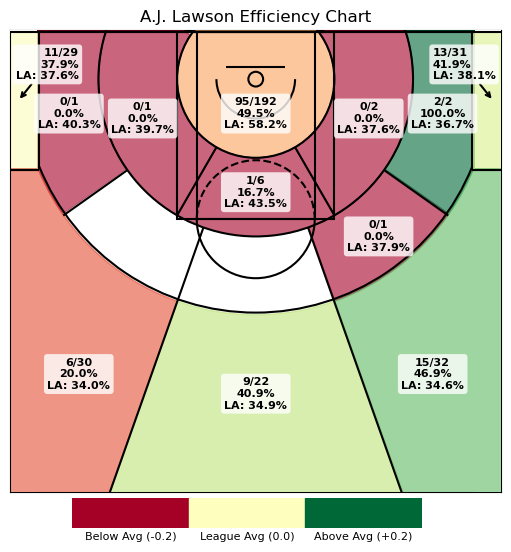

In [6]:
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge, Circle, Arc, Rectangle
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import matplotlib.colorbar as cbar
import numpy as np

# -------------------------------------------------------------------------
# 1. DRAW THE COURT FUNCTION (WITH SHOT ZONE LINES)
# -------------------------------------------------------------------------
def draw_court(ax=None, color="black", lw=1.5, shotzone=False, outer_lines=True):
    """Draws an NBA court with optional shot zones."""
    if ax is None:
        ax = plt.gca()

    # Create various court elements
    hoop = Circle((0, 0), radius=7.5, linewidth=lw, color=color, fill=False, zorder=16)
    backboard = Rectangle((-30, -12.5), 60, 0, linewidth=lw, color=color, zorder=16)
    outer_box = Rectangle((-80, -47.5), 160, 190, linewidth=lw, color=color, fill=False, zorder=16)
    inner_box = Rectangle((-60, -47.5), 120, 190, linewidth=lw, color=color, fill=False, zorder=12)
    top_free_throw = Arc((0, 142.5), 120, 120, theta1=0, theta2=180, linewidth=lw, color=color, fill=False, zorder=16)
    bottom_free_throw = Arc((0, 142.5), 120, 120, theta1=180, theta2=0, linewidth=lw, color=color, linestyle='dashed', zorder=16)
    restricted = Arc((0, 0), 80, 80, theta1=0, theta2=180, linewidth=lw, color=color, zorder=16)
    corner_three_a = Rectangle((-220, -47.5), 0, 140, linewidth=lw, color=color, zorder=16)
    corner_three_b = Rectangle((220, -47.5), 0, 140, linewidth=lw, color=color, zorder=16)
    three_arc = Arc((0, 0), 475, 475, theta1=22, theta2=158, linewidth=lw, color=color, zorder=16)

    court_elements = [hoop, backboard, outer_box, inner_box, top_free_throw,
                      bottom_free_throw, restricted, corner_three_a, corner_three_b, three_arc]
    
    # Shotzone lines
    if shotzone:
        inner_circle = Circle((0, 0), radius=80, linewidth=lw, color='black', fill=False, zorder=12)
        outer_circle = Circle((0, 0), radius=160, linewidth=lw, color='black', fill=False, zorder=12)
        corner_three_a_x = Rectangle((-250, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Right
        corner_three_b_x = Rectangle((220, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Left
        inner_line_1 = Rectangle((40, 69.28), 80, 0, angle=60, linewidth=lw, color='black', zorder=12)  # Left Midrange (8-16ft.)
        inner_line_2 = Rectangle((-40, 69.28), 80, 0, angle=120, linewidth=lw, color='black', zorder=12) #Right midrange (8-16ft.)
        inner_line_3 = Rectangle((53.20, 150.89), 290, 0, angle=70.53, linewidth=lw, color='black', zorder=12) #Center Left 3 Point line
        inner_line_4 = Rectangle((-53.20, 150.89), 290, 0, angle=109.47, linewidth=lw, color='black', zorder=12) #Center Right 3 Point line
        inner_line_5 = Rectangle((130.54, 92.5), 80, 0, angle=35.32, linewidth=lw, color='black', zorder=12) #Left midrange (16-24ft.)        
        inner_line_6 = Rectangle((-130.54, 92.5), 80, 0, angle=144.68, linewidth=lw, color='black', zorder=12) #Right midrange (16-24ft.)
        
        court_elements.extend([inner_circle, outer_circle, corner_three_a_x, corner_three_b_x, inner_line_1, inner_line_2, inner_line_3, inner_line_4, inner_line_5, inner_line_6])

    # Add out-of-bounds lines
    if outer_lines:
        court_boundary = Rectangle((-250, -47.5), 500, 470, linewidth=lw, color=color, fill=False)
        court_elements.append(court_boundary)

    for element in court_elements:
        ax.add_patch(element)

    return ax

# -------------------------------------------------------------------------
# 2. DEFINE MIDRANGE ZONES
# -------------------------------------------------------------------------
midrange_zones = {
    "inner_circle": {"center": (0, 0), "inner_radius": 0, "outer_radius": 80, "theta1": -90, "theta2": 270},
    "left_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": -33.9, "theta2": 60},
    "center_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 60.1, "theta2": 120},
    "right_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 120.1, "theta2": 215},
    "left_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": -33.9, "theta2": 35},
    "left_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 35.1, "theta2": 70.5},
    "center_midrange_16-24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 70.6, "theta2": 109.5},
    "right_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 109.6, "theta2": 145},
    "right_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 145.1, "theta2": 200},
    "left_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": -30, "theta2": 70.5},
    "center_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 460, "theta1": 70.6, "theta2": 109.5},
    "right_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": 109.6, "theta2": 215}    
}

# -------------------------------------------------------------------------
# 3. MAP EFFICIENCY TO SHADING COLORS
# -------------------------------------------------------------------------
# Define mapping between midrange zones and shot zones
zone_map = {
    "center_above_the_break_3": ("Above the Break 3", "Center(C)", "24+ ft."),
    "left_above_the_break_3": ("Above the Break 3", "Left Side Center(LC)", "24+ ft."),
    "right_above_the_break_3": ("Above the Break 3", "Right Side Center(RC)", "24+ ft."),
    "center_midrange_8_16": ("In The Paint (Non-RA)", "Center(C)", "8-16 ft."),  # Combined Center Area
    "inner_circle": ("Inner Circle", "Center", "Less Than 8 ft."),

    # Now we use the combined labels for left and right 8-16 ft. areas
    "left_midrange_8_16": ("Mid-Range", "Left Side(L)", "8-16 ft."),  
    "right_midrange_8_16": ("Mid-Range", "Right Side(R)", "8-16 ft."),  

    "center_midrange_16-24": ("Mid-Range", "Center(C)", "16-24 ft."),
    "left_center_midrange_16_24": ("Mid-Range", "Left Side Center(LC)", "16-24 ft."),
    "left_midrange_16_24": ("Mid-Range", "Left Side(L)", "16-24 ft."),
    "right_center_midrange_16_24": ("Mid-Range", "Right Side Center(RC)", "16-24 ft."),
    "right_midrange_16_24": ("Mid-Range", "Right Side(R)", "16-24 ft."),
}

# ✅ Get efficiency difference for each zone
efficiency_values = {
    zone: shots_df.loc[shots_df["Zone_Label"] == zone_map[zone], "EffDiff"].mean()
    if zone in zone_map else np.nan  # Use NaN for zones without data
    for zone in midrange_zones.keys()
}

# Calculate stats for each zone
zone_stats = {}
for zone_key, zone_name in zone_map.items():
    zone_shots = shots_df[shots_df["Zone_Label"] == zone_name]
    total_shots = len(zone_shots)
    made_shots = zone_shots["SHOT_MADE_FLAG"].sum()
    shooting_percentage = made_shots / total_shots if total_shots > 0 else 0
    league_avg = league_averages.get(zone_name, 0)
    
    zone_stats[zone_key] = {
        "total_shots": total_shots,
        "made_shots": made_shots,
        "shooting_percentage": shooting_percentage,
        "league_avg": league_avg
    }

# Normalize values for coloring
cmap = cm.RdYlGn

# ✅ Normalize Efficiency Values for Coloring (White for No Shots)
colors = {
    zone: cmap((efficiency_values[zone] + 0.2) / 0.4) if not np.isnan(efficiency_values[zone]) else "white"
    for zone in midrange_zones
}

# -------------------------------------------------------------------------
# 4. PLOT COURT WITH SHADED MIDRANGE AREAS
# -------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 6))

# ✅ Draw the court
draw_court(ax, color="black", lw=1.5, shotzone=True, outer_lines=True)

# ✅ Flip the court 180° by reversing xlim and ylim
ax.set_xlim(250, -250)
ax.set_ylim(420, -50)

# ✅ Shade All Midrange Areas
for key, zone in midrange_zones.items():
    wedge = Wedge(zone["center"], zone["outer_radius"], zone["theta1"], zone["theta2"],
                  width=zone["outer_radius"] - zone["inner_radius"], color=colors[key], alpha=0.6, zorder=5)
    ax.add_patch(wedge)
    
# ✅ Step 4: Add Fully Transparent White Overlay for Both Sides
overlay_left = Rectangle((223, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Left Side
overlay_right = Rectangle((-473, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Right Side

ax.add_patch(overlay_left)
ax.add_patch(overlay_right)

# ✅ Step 5: **Re-add the missing court lines on top of the overlay**
#ax.add_patch(Rectangle((-250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Right Sideline
ax.add_patch(Rectangle((-250, -47.5), 500, 0, linewidth=1.5, color="black", zorder=16))  # Baseline
ax.add_patch(Rectangle((250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Left Sideline

# ✅ **Re-add the Corner Three-Point Lines on Top of the Overlay**
ax.add_patch(Rectangle((220, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))   # Left Corner Three
ax.add_patch(Rectangle((-250, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))  # Right Corner Three

# -------------------------------------------------------------------------
# ✅ Extract EffDiff for Corner Threes from shots_df
# -------------------------------------------------------------------------
left_corner_eff = shots_df.loc[
    shots_df["Zone_Label"] == ("Left Corner 3", "Left Side(L)", "24+ ft."), "EffDiff"
].mean()

right_corner_eff = shots_df.loc[
    shots_df["Zone_Label"] == ("Right Corner 3", "Right Side(R)", "24+ ft."), "EffDiff"
].mean()

# ✅ Normalize Efficiency Values for Coloring
color_left_corner = cmap((left_corner_eff + 0.2) / 0.4) if not np.isnan(left_corner_eff) else "gray"
color_right_corner = cmap((right_corner_eff + 0.2) / 0.4) if not np.isnan(right_corner_eff) else "gray"

# ✅ Shade the Left & Right Corner Three Areas **Above the White Overlay**
left_corner_three_shade = Rectangle(
    (220, -47.5), 30, 140, facecolor=color_left_corner, alpha=0.6, zorder=11
)
right_corner_three_shade = Rectangle(
    (-250, -47.5), 30, 140, facecolor=color_right_corner, alpha=0.6, zorder=11
)

ax.add_patch(left_corner_three_shade)
ax.add_patch(right_corner_three_shade)

# ✅ **Redraw the left and right above-the-break three areas**
left_above_break_shade = Rectangle(
    (223, 90), 250, 400, facecolor=colors["left_above_the_break_3"], alpha=0.6, zorder=11
)

right_above_break_shade = Rectangle(
    (-473, 90), 250, 400, facecolor=colors["right_above_the_break_3"], alpha=0.6, zorder=11
)


ax.add_patch(left_above_break_shade)
ax.add_patch(right_above_break_shade)

# -------------------------------------------------------------------------
# ✅ Extract Corner Three Stats for Display
# -------------------------------------------------------------------------
# Left Corner 3 Stats
left_corner_shots = shots_df[shots_df["Zone_Label"] == ("Left Corner 3", "Left Side(L)", "24+ ft.")]
left_corner_total_shots = len(left_corner_shots)
left_corner_made_shots = left_corner_shots["SHOT_MADE_FLAG"].sum()
left_corner_shooting_percentage = left_corner_made_shots / left_corner_total_shots if left_corner_total_shots > 0 else 0
left_corner_league_avg = league_averages.get(("Left Corner 3", "Left Side(L)", "24+ ft."), 0)

# Right Corner 3 Stats
right_corner_shots = shots_df[shots_df["Zone_Label"] == ("Right Corner 3", "Right Side(R)", "24+ ft.")]
right_corner_total_shots = len(right_corner_shots)
right_corner_made_shots = right_corner_shots["SHOT_MADE_FLAG"].sum()
right_corner_shooting_percentage = right_corner_made_shots / right_corner_total_shots if right_corner_total_shots > 0 else 0
right_corner_league_avg = league_averages.get(("Right Corner 3", "Right Side(R)", "24+ ft."), 0)

def add_text_box(ax, x, y, text, zone_key=None, is_inner_circle=False, is_left_corner=False, is_right_corner=False):
    if zone_key and zone_key in colors:
        # Get the zone's color for the text box background
        background_color = colors[zone_key]
    else:
        background_color = "white"  # Default to white if no color is found

    if is_inner_circle:
        # Draw an arrow pointing to the right for the inner circle zone
        ax.annotate(
            text,
            xy=(40, -10), xytext=(x, y),
            fontsize=8, fontweight='bold',
            ha="center", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5),
            bbox=dict(facecolor=background_color, edgecolor='none', boxstyle='round,pad=0.3', alpha=0.8),
            zorder=21
        )
    elif is_left_corner:
        # Draw an arrow pointing left for the left corner 3 area
        ax.annotate(
            text,
            xy=(240, 20), xytext=(x, y),
            fontsize=8, fontweight='bold',
            ha="right", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5, shrinkA=0, shrinkB=0),
            bbox=dict(facecolor=background_color, edgecolor='none', boxstyle='round,pad=0.3', alpha=0.8),
            zorder=21
        )
    elif is_right_corner:
        # Draw an arrow pointing right for the right corner 3 area
        ax.annotate(
            text,
            xy=(-240, 20), xytext=(x, y),
            fontsize=8, fontweight='bold',
            ha="left", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5, shrinkA=0, shrinkB=0),
            bbox=dict(facecolor=background_color, edgecolor='none', boxstyle='round,pad=0.3', alpha=0.8),
            zorder=21
        )
    else:
        # Plot bold text for all other zones
        ax.text(
            x, y, text,
            fontsize=8, 
            fontweight='bold',  # Make text bold
            ha="center", 
            va="center", 
            zorder=21,
            bbox=dict(facecolor=background_color, edgecolor='none', boxstyle='round,pad=0.3', alpha=0.8)
        )

# Plot all text boxes
for key, stats in zone_stats.items():
    if stats["total_shots"] > 0:  # Only display if shots are taken in the zone
        text_content = (f"{stats['made_shots']}/{stats['total_shots']}\n"
                        f"{stats['shooting_percentage']:.1%}\n"
                        f"LA: {stats['league_avg']:.1%}")
        
        # Approximate placement for each zone (Adjust as needed)
        if key == "inner_circle":
            add_text_box(ax, 0, 35, text_content)
        elif key == "left_midrange_8_16":
            add_text_box(ax, 115, 40, text_content)  # Flipped to the left side
        elif key == "center_midrange_8_16":
            add_text_box(ax, 0, 115, text_content)
        elif key == "right_midrange_8_16":
            add_text_box(ax, -115, 40, text_content)  # Flipped to the right side
        elif key == "left_midrange_16_24":
            add_text_box(ax, 190, 35, text_content)  # Flipped to the left side
        elif key == "left_center_midrange_16_24":
            add_text_box(ax, 90, 220, text_content)  # Flipped to the left side
        elif key == "center_midrange_16-24":
            add_text_box(ax, 0, 250, text_content)
        elif key == "right_center_midrange_16_24":
            add_text_box(ax, -125, 160, text_content)  # Flipped to the right side
        elif key == "right_midrange_16_24":
            add_text_box(ax, -190, 35, text_content)  # Flipped to the right side
        elif key == "left_above_the_break_3":
            add_text_box(ax, 180, 300, text_content)  # Flipped to the left side
        elif key == "center_above_the_break_3":
            add_text_box(ax, 0, 320, text_content)
        elif key == "right_above_the_break_3":
            add_text_box(ax, -180, 300, text_content)  # Flipped to the right side
            
# ➡️ Add Text for Left and Right Corner 3s (Outside Plot with Arrows)
if left_corner_total_shots > 0:  # Display if data is available
    left_corner_text = (f"{left_corner_made_shots}/{left_corner_total_shots}\n"
                        f"{left_corner_shooting_percentage:.1%}\n"
                        f"LA: {left_corner_league_avg:.1%}")
    add_text_box(ax, 180, -15, left_corner_text, is_left_corner=True)

if right_corner_total_shots > 0:  # Display if data is available
    right_corner_text = (f"{right_corner_made_shots}/{right_corner_total_shots}\n"
                         f"{right_corner_shooting_percentage:.1%}\n"
                         f"LA: {right_corner_league_avg:.1%}")
    add_text_box(ax, -180, -15, right_corner_text, is_right_corner=True)

# ✅ Ensure aspect ratio
ax.set_aspect("equal")

# Remove axis labels
ax.set_xticks([])
ax.set_yticks([])

# Set title
ax.set_title("A.J. Lawson Efficiency Chart")

# Define colors for the three efficiency levels
norm = Normalize(vmin=-0.2, vmax=0.2)  # Define the range for normalization
legend_colors = [cmap(norm(-0.2)), cmap(norm(0.0)), cmap(norm(0.2))]
labels = ["Below Avg (-0.2)", "League Avg (0.0)", "Above Avg (+0.2)"]

# Create a separate axis for the legend
legend_ax = fig.add_axes([0.25, 0.05, 0.5, 0.05])  # [left, bottom, width, height]

# Plot the legend rectangles
for i, (color, label) in enumerate(zip(legend_colors, labels)):
    legend_ax.add_patch(Rectangle((i/3, 0), 1/3, 1, color=color, transform=legend_ax.transAxes))

# Set axis limits and remove axis labels/ticks
legend_ax.set_xlim(0, 1)
legend_ax.set_ylim(0, 1)
legend_ax.set_xticks([])
legend_ax.set_yticks([])
legend_ax.axis('off')

# Add text labels below each rectangle
for i, label in enumerate(labels):
    legend_ax.text((i + 0.5) / 3, -0.3, label, fontsize=8, ha='center', va='center', transform=legend_ax.transAxes)

# Show plot
plt.show()

## NBA

In [87]:
import requests
import pandas as pd
import numpy as np

# -------------------------------------------------------------------------
# 1. RETRIEVE A.J. LAWSON'S SHOT DATA
# -------------------------------------------------------------------------

url = "https://stats.nba.com/stats/shotchartdetail"
headers = {
    "Host": "stats.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": (
        "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
        "AppleWebKit/537.36 (KHTML, like Gecko) "
        "Chrome/91.0.4472.124 Safari/537.36"
    ),
    "Origin": "https://stats.nba.com",
    "Referer": "https://stats.nba.com/"
}
base_params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "FGA",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "00",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1610612761,
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}

shots_df = []
params = base_params.copy()
resp = requests.get(url, headers=headers, params=params)
if resp.status_code == 200:
    data = resp.json()
    shot_data = data["resultSets"][0]
    headers_list = shot_data["headers"]
    rows = shot_data["rowSet"]
        
    df_game = pd.DataFrame(rows, columns=headers_list)
    shots_df.append(df_game)
    
else:
    print(f"Request failed for GameID {game_id} with status code {resp.status_code}")

if not shots_df:
    raise ValueError("No data retrieved.")

shots_df = pd.concat(shots_df, ignore_index=True)

# -------------------------------------------------------------------------
# 2. PROCESS A.J. LAWSON'S SHOT DATA
# -------------------------------------------------------------------------
shots_df["x_plot"] = -shots_df["LOC_X"]
shots_df["y_plot"] = shots_df["LOC_Y"]

# Assign shot makes/misses
shots_df["SHOT_MADE_FLAG"] = shots_df["EVENT_TYPE"].apply(lambda x: 1 if x == "Made Shot" else 0)

# ✅ Fix Shot Zone Labels (Inner Circle Mapping Fix)
def create_zone_label(row):
    if row["SHOT_ZONE_BASIC"] == "Restricted Area" and row["SHOT_ZONE_AREA"] == "Center(C)":
        return ("Inner Circle", "Center", "Less Than 8 ft.")  # Correctly match computed league avg.
    if row["SHOT_ZONE_BASIC"] == "In The Paint (Non-RA)" and row["SHOT_ZONE_AREA"] == "Center(C)" and row["SHOT_ZONE_RANGE"] == "Less Than 8 ft.":
        return ("Inner Circle", "Center", "Less Than 8 ft.")  # Also map here for consistency
    return (row["SHOT_ZONE_BASIC"], row["SHOT_ZONE_AREA"], row["SHOT_ZONE_RANGE"])  # Default for other zones

shots_df["Zone_Label"] = shots_df.apply(create_zone_label, axis=1)

# -------------------------------------------------------------------------
# 3. RETRIEVE MOST RECENT LEAGUE AVERAGES
# -------------------------------------------------------------------------
response = requests.get(url, headers=headers, params=params)

if response.status_code == 200:
    data = response.json()
    for dataset in data["resultSets"]:
        if dataset["name"] == "LeagueAverages":
            league_avg_headers = dataset["headers"]
            league_avg_rows = dataset["rowSet"]
            df_league_avg = pd.DataFrame(league_avg_rows, columns=league_avg_headers)

# Mapping shot zones
league_averages = {}
total_inner_fgm = 0  # Track total makes for inner circle
total_inner_fga = 0  # Track total attempts for inner circle
left_side_fgm = 0    # Track makes for left side combination
left_side_fga = 0    # Track attempts for left side combination
right_side_fgm = 0   # Track makes for right side combination
right_side_fga = 0   # Track attempts for right side combination
center_paint_fgm = 0 # Track makes for center 8-16 ft. combination
center_paint_fga = 0 # Track attempts for center 8-16 ft. combination

for _, row in df_league_avg.iterrows():
    shot_zone = (row["SHOT_ZONE_BASIC"], row["SHOT_ZONE_AREA"], row["SHOT_ZONE_RANGE"])
    
    # Combine FG% for "Inner Circle"
    if shot_zone in [
        ("In The Paint (Non-RA)", "Center(C)", "Less Than 8 ft."),
        ("Restricted Area", "Center(C)", "Less Than 8 ft.")
    ]:
        total_inner_fgm += row["FGM"]
        total_inner_fga += row["FGA"]
    
    # Combine FG% for "Left Side (8-16 ft.)"
    elif shot_zone in [
        ("In The Paint (Non-RA)", "Left Side(L)", "8-16 ft."),
        ("Mid-Range", "Left Side(L)", "8-16 ft.")
    ]:
        left_side_fgm += row["FGM"]
        left_side_fga += row["FGA"]

    # Combine FG% for "Right Side (8-16 ft.)"
    elif shot_zone in [
        ("In The Paint (Non-RA)", "Right Side(R)", "8-16 ft."),
        ("Mid-Range", "Right Side(R)", "8-16 ft.")
    ]:
        right_side_fgm += row["FGM"]
        right_side_fga += row["FGA"]

    # Combine FG% for "Center (8-16 ft.)"
    elif shot_zone in [
        ("In The Paint (Non-RA)", "Center(C)", "8-16 ft."),
        ("Mid-Range", "Center(C)", "8-16 ft.")
    ]:
        center_paint_fgm += row["FGM"]
        center_paint_fga += row["FGA"]
        
    else:
        league_averages[shot_zone] = row["FG_PCT"]

# Compute combined FG% for "Inner Circle"
if total_inner_fga > 0:
    league_averages[("Inner Circle", "Center", "Less Than 8 ft.")] = total_inner_fgm / total_inner_fga

# Compute combined FG% for "Left Side (8-16 ft.)"
if left_side_fga > 0:
    league_averages[("Mid-Range", "Left Side(L)", "8-16 ft.")] = left_side_fgm / left_side_fga

# Compute combined FG% for "Right Side (8-16 ft.)"
if right_side_fga > 0:
    league_averages[("Mid-Range", "Right Side(R)", "8-16 ft.")] = right_side_fgm / right_side_fga

# Compute combined FG% for "Center (8-16 ft.)"
if center_paint_fga > 0:
    league_averages[("In The Paint (Non-RA)", "Center(C)", "8-16 ft.")] = center_paint_fgm / center_paint_fga

# -------------------------------------------------------------------------
# 4. COMPUTE EFFICIENCY DIFFERENCE
# -------------------------------------------------------------------------
# ✅ Debugging missing values before filling them
unmatched_zones = shots_df[~shots_df["Zone_Label"].isin(league_averages.keys())]["Zone_Label"].unique()
#print("⚠️ Unmatched Zones:", unmatched_zones)

# ✅ Map league averages
shots_df["League_Avg"] = shots_df["Zone_Label"].map(league_averages)

# ✅ Print missing values count
#print("⚠️ Missing League_Avg values count:", shots_df["League_Avg"].isna().sum())

# ✅ Fill remaining NaNs
shots_df["League_Avg"] = shots_df["League_Avg"].fillna(0.35)

# ✅ Compute Shooting Percentage & Efficiency Difference
shots_df["ShotPct"] = shots_df.groupby("Zone_Label")["SHOT_MADE_FLAG"].transform("mean")
shots_df["EffDiff"] = shots_df["ShotPct"] - shots_df["League_Avg"]

shots_df

,GRID_TYPE,GAME_ID,GAME_EVENT_ID,PLAYER_ID,PLAYER_NAME,TEAM_ID,TEAM_NAME,PERIOD,MINUTES_REMAINING,SECONDS_REMAINING,EVENT_TYPE,ACTION_TYPE,SHOT_TYPE,SHOT_ZONE_BASIC,SHOT_ZONE_AREA,SHOT_ZONE_RANGE,SHOT_DISTANCE,LOC_X,LOC_Y,SHOT_ATTEMPTED_FLAG,SHOT_MADE_FLAG,GAME_DATE,HTM,VTM,x_plot,y_plot,Zone_Label,League_Avg,ShotPct,EffDiff
0,Shot Chart Detail,0022400397,653,1630639,A.J. Lawson,1610612761,Toronto Raptors,4,3,13,Made Shot,Jump Shot,3PT Field Goal,Above the Break 3,Right Side Center(RC),24+ ft.,26,119,232,1,1,20241223,NYK,TOR,-119,232,"(Above the Break 3, Right Side Center(RC), 24+...",0.352000,0.380952,0.028952
1,Shot Chart Detail,0022400414,678,1630639,A.J. Lawson,1610612761,Toronto Raptors,4,5,18,Missed Shot,Driving Layup Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,3,-17,26,1,0,20241226,MEM,TOR,17,26,"(Inner Circle, Center, Less Than 8 ft.)",0.595265,0.534884,-0.060381
2,Shot Chart Detail,0022400414,712,1630639,A.J. Lawson,1610612761,Toronto Raptors,4,3,26,Made Shot,Running Alley Oop Dunk Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,0,7,7,1,1,20241226,MEM,TOR,-7,7,"(Inner Circle, Center, Less Than 8 ft.)",0.595265,0.534884,-0.060381
3,Shot Chart Detail,0022400414,758,1630639,A.J. Lawson,1610612761,Toronto Raptors,4,0,31,Made Shot,Jump Shot,3PT Field Goal,Above the Break 3,Left Side Center(LC),24+ ft.,26,-159,206,1,1,20241226,MEM,TOR,159,206,"(Above the Break 3, Left Side Center(LC), 24+ ...",0.357000,0.333333,-0.023667
4,Shot Chart Detail,0022400449,422,1630639,A.J. Lawson,1610612761,Toronto Raptors,3,4,31,Missed Shot,Jump Shot,3PT Field Goal,Above the Break 3,Left Side Center(LC),24+ ft.,27,-203,185,1,0,20241231,BOS,TOR,203,185,"(Above the Break 3, Left Side Center(LC), 24+ ...",0.357000,0.333333,-0.023667
5,Shot Chart Detail,0022400449,621,1630639,A.J. Lawson,1610612761,Toronto Raptors,4,1,57,Missed Shot,Jump Shot,3PT Field Goal,Above the Break 3,Left Side Center(LC),24+ ft.,28,-141,245,1,0,20241231,BOS,TOR,141,245,"(Above the Break 3, Left Side Center(LC), 24+ ...",0.357000,0.333333,-0.023667
6,Shot Chart Detail,0022400449,629,1630639,A.J. Lawson,1610612761,Toronto Raptors,4,0,45,Missed Shot,Jump Shot,3PT Field Goal,Right Corner 3,Right Side(R),24+ ft.,23,230,14,1,0,20241231,BOS,TOR,-230,14,"(Right Corner 3, Right Side(R), 24+ ft.)",0.390000,0.200000,-0.190000
7,Shot Chart Detail,0022400608,657,1630639,A.J. Lawson,1610612761,Toronto Raptors,4,0,43,Made Shot,Running Layup Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,3,34,5,1,1,20250121,TOR,ORL,-34,5,"(Inner Circle, Center, Less Than 8 ft.)",0.595265,0.534884,-0.060381
8,Shot Chart Detail,0022400870,216,1630639,A.J. Lawson,1610612761,Toronto Raptors,2,9,44,Missed Shot,Running Layup Shot,2PT Field Goal,In The Paint (Non-RA),Center(C),Less Than 8 ft.,4,-40,13,1,0,20250302,ORL,TOR,40,13,"(Inner Circle, Center, Less Than 8 ft.)",0.595265,0.534884,-0.060381
9,Shot Chart Detail,0022400870,601,1630639,A.J. Lawson,1610612761,Toronto Raptors,4,8,13,Missed Shot,Running Alley Oop Layup Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,2,2,20,1,0,20250302,ORL,TOR,-2,20,"(Inner Circle, Center, Less Than 8 ft.)",0.595265,0.534884,-0.060381


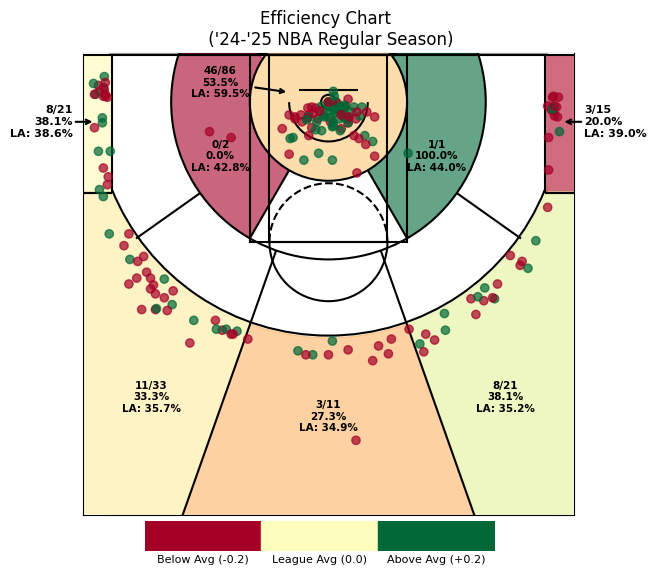

Radar plot saved to: C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_nba_efficiency_chart.png


In [88]:
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge, Circle, Arc, Rectangle
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import matplotlib.colorbar as cbar
import numpy as np
from matplotlib.patches import FancyBboxPatch

# -------------------------------------------------------------------------
# 1. DRAW THE COURT FUNCTION (WITH SHOT ZONE LINES)
# -------------------------------------------------------------------------
def draw_court(ax=None, color="black", lw=1.5, shotzone=False, outer_lines=True):
    """Draws an NBA court with optional shot zones."""
    if ax is None:
        ax = plt.gca()

    # Create various court elements
    hoop = Circle((0, 0), radius=7.5, linewidth=lw, color=color, fill=False, zorder=16)
    backboard = Rectangle((-30, -12.5), 60, 0, linewidth=lw, color=color, zorder=16)
    outer_box = Rectangle((-80, -47.5), 160, 190, linewidth=lw, color=color, fill=False, zorder=16)
    inner_box = Rectangle((-60, -47.5), 120, 190, linewidth=lw, color=color, fill=False, zorder=12)
    top_free_throw = Arc((0, 142.5), 120, 120, theta1=0, theta2=180, linewidth=lw, color=color, fill=False, zorder=16)
    bottom_free_throw = Arc((0, 142.5), 120, 120, theta1=180, theta2=0, linewidth=lw, color=color, linestyle='dashed', zorder=16)
    restricted = Arc((0, 0), 80, 80, theta1=0, theta2=180, linewidth=lw, color=color, zorder=16)
    corner_three_a = Rectangle((-220, -47.5), 0, 140, linewidth=lw, color=color, zorder=16)
    corner_three_b = Rectangle((220, -47.5), 0, 140, linewidth=lw, color=color, zorder=16)
    three_arc = Arc((0, 0), 475, 475, theta1=22, theta2=158, linewidth=lw, color=color, zorder=16)

    court_elements = [hoop, backboard, outer_box, inner_box, top_free_throw,
                      bottom_free_throw, restricted, corner_three_a, corner_three_b, three_arc]
    
    # Shotzone lines
    if shotzone:
        inner_circle = Circle((0, 0), radius=80, linewidth=lw, color='black', fill=False, zorder=12)
        outer_circle = Circle((0, 0), radius=160, linewidth=lw, color='black', fill=False, zorder=12)
        corner_three_a_x = Rectangle((-250, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Right
        corner_three_b_x = Rectangle((220, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Left
        inner_line_1 = Rectangle((40, 69.28), 80, 0, angle=60, linewidth=lw, color='black', zorder=12)  # Left Midrange (8-16ft.)
        inner_line_2 = Rectangle((-40, 69.28), 80, 0, angle=120, linewidth=lw, color='black', zorder=12) #Right midrange (8-16ft.)
        inner_line_3 = Rectangle((53.20, 150.89), 290, 0, angle=70.53, linewidth=lw, color='black', zorder=12) #Center Left 3 Point line
        inner_line_4 = Rectangle((-53.20, 150.89), 290, 0, angle=109.47, linewidth=lw, color='black', zorder=12) #Center Right 3 Point line
        inner_line_5 = Rectangle((130.54, 92.5), 80, 0, angle=35.32, linewidth=lw, color='black', zorder=12) #Left midrange (16-24ft.)        
        inner_line_6 = Rectangle((-130.54, 92.5), 80, 0, angle=144.68, linewidth=lw, color='black', zorder=12) #Right midrange (16-24ft.)
        
        court_elements.extend([inner_circle, outer_circle, corner_three_a_x, corner_three_b_x, inner_line_1, inner_line_2, inner_line_3, inner_line_4, inner_line_5, inner_line_6])

    # Add out-of-bounds lines
    if outer_lines:
        court_boundary = Rectangle((-250, -47.5), 500, 470, linewidth=lw, color=color, fill=False)
        court_elements.append(court_boundary)

    for element in court_elements:
        ax.add_patch(element)

    return ax

# -------------------------------------------------------------------------
# 2. DEFINE MIDRANGE ZONES
# -------------------------------------------------------------------------
midrange_zones = {
    "inner_circle": {"center": (0, 0), "inner_radius": 0, "outer_radius": 80, "theta1": -90, "theta2": 270},
    "left_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": -33.9, "theta2": 60},
    "center_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 60.1, "theta2": 120},
    "right_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 120.1, "theta2": 215},
    "left_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": -33.9, "theta2": 35},
    "left_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 35.1, "theta2": 70.5},
    "center_midrange_16-24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 70.6, "theta2": 109.5},
    "right_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 109.6, "theta2": 145},
    "right_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 145.1, "theta2": 200},
    "left_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": -30, "theta2": 70.5},
    "center_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 460, "theta1": 70.6, "theta2": 109.5},
    "right_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": 109.6, "theta2": 215}    
}

# -------------------------------------------------------------------------
# 3. MAP EFFICIENCY TO SHADING COLORS
# -------------------------------------------------------------------------
# Define mapping between midrange zones and shot zones
zone_map = {
    "center_above_the_break_3": ("Above the Break 3", "Center(C)", "24+ ft."),
    "left_above_the_break_3": ("Above the Break 3", "Left Side Center(LC)", "24+ ft."),
    "right_above_the_break_3": ("Above the Break 3", "Right Side Center(RC)", "24+ ft."),
    "center_midrange_8_16": ("In The Paint (Non-RA)", "Center(C)", "8-16 ft."),  # Combined Center Area
    "inner_circle": ("Inner Circle", "Center", "Less Than 8 ft."),

    # Now we use the combined labels for left and right 8-16 ft. areas
    "left_midrange_8_16": ("Mid-Range", "Left Side(L)", "8-16 ft."),  
    "right_midrange_8_16": ("Mid-Range", "Right Side(R)", "8-16 ft."),  

    "center_midrange_16-24": ("Mid-Range", "Center(C)", "16-24 ft."),
    "left_center_midrange_16_24": ("Mid-Range", "Left Side Center(LC)", "16-24 ft."),
    "left_midrange_16_24": ("Mid-Range", "Left Side(L)", "16-24 ft."),
    "right_center_midrange_16_24": ("Mid-Range", "Right Side Center(RC)", "16-24 ft."),
    "right_midrange_16_24": ("Mid-Range", "Right Side(R)", "16-24 ft."),
}

# ✅ Get efficiency difference for each zone
efficiency_values = {
    zone: shots_df.loc[shots_df["Zone_Label"] == zone_map[zone], "EffDiff"].mean()
    if zone in zone_map else np.nan  # Use NaN for zones without data
    for zone in midrange_zones.keys()
}

# Calculate stats for each zone
zone_stats = {}
for zone_key, zone_name in zone_map.items():
    zone_shots = shots_df[shots_df["Zone_Label"] == zone_name]
    total_shots = len(zone_shots)
    made_shots = zone_shots["SHOT_MADE_FLAG"].sum()
    shooting_percentage = made_shots / total_shots if total_shots > 0 else 0
    league_avg = league_averages.get(zone_name, 0)
    
    zone_stats[zone_key] = {
        "total_shots": total_shots,
        "made_shots": made_shots,
        "shooting_percentage": shooting_percentage,
        "league_avg": league_avg
    }

# Normalize values for coloring
cmap = cm.RdYlGn

# ✅ Normalize Efficiency Values for Coloring (White for No Shots)
colors = {
    zone: cmap((efficiency_values[zone] + 0.2) / 0.4) if not np.isnan(efficiency_values[zone]) else "white"
    for zone in midrange_zones
}

# -------------------------------------------------------------------------
# 4. PLOT COURT WITH SHADED MIDRANGE AREAS
# -------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 6))

# ✅ Draw the court
draw_court(ax, color="black", lw=1.5, shotzone=True, outer_lines=True)

# ✅ Flip the court 180° by reversing xlim and ylim
ax.set_xlim(250, -250)
ax.set_ylim(420, -50)

# ✅ Shade All Midrange Areas
for key, zone in midrange_zones.items():
    wedge = Wedge(zone["center"], zone["outer_radius"], zone["theta1"], zone["theta2"],
                  width=zone["outer_radius"] - zone["inner_radius"], color=colors[key], alpha=0.6, zorder=5)
    ax.add_patch(wedge)
    
# ✅ Step 4: Add Fully Transparent White Overlay for Both Sides
overlay_left = Rectangle((223, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Left Side
overlay_right = Rectangle((-473, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Right Side

ax.add_patch(overlay_left)
ax.add_patch(overlay_right)

# ✅ Step 5: **Re-add the missing court lines on top of the overlay**
#ax.add_patch(Rectangle((-250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Right Sideline
ax.add_patch(Rectangle((-250, -47.5), 500, 0, linewidth=1.5, color="black", zorder=16))  # Baseline
ax.add_patch(Rectangle((250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Left Sideline

# ✅ **Re-add the Corner Three-Point Lines on Top of the Overlay**
ax.add_patch(Rectangle((220, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))   # Left Corner Three
ax.add_patch(Rectangle((-250, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))  # Right Corner Three

# -------------------------------------------------------------------------
# ✅ Extract EffDiff for Corner Threes from shots_df
# -------------------------------------------------------------------------
left_corner_eff = shots_df.loc[
    shots_df["Zone_Label"] == ("Left Corner 3", "Left Side(L)", "24+ ft."), "EffDiff"
].mean()

right_corner_eff = shots_df.loc[
    shots_df["Zone_Label"] == ("Right Corner 3", "Right Side(R)", "24+ ft."), "EffDiff"
].mean()

# ✅ Normalize Efficiency Values for Coloring
color_left_corner = cmap((left_corner_eff + 0.2) / 0.4) if not np.isnan(left_corner_eff) else "gray"
color_right_corner = cmap((right_corner_eff + 0.2) / 0.4) if not np.isnan(right_corner_eff) else "gray"

# ✅ Shade the Left & Right Corner Three Areas **Above the White Overlay**
left_corner_three_shade = Rectangle(
    (220, -47.5), 30, 140, facecolor=color_left_corner, alpha=0.6, zorder=11
)
right_corner_three_shade = Rectangle(
    (-250, -47.5), 30, 140, facecolor=color_right_corner, alpha=0.6, zorder=11
)

ax.add_patch(left_corner_three_shade)
ax.add_patch(right_corner_three_shade)

# ✅ **Redraw the left and right above-the-break three areas**
left_above_break_shade = Rectangle(
    (223, 90), 250, 400, facecolor=colors["left_above_the_break_3"], alpha=0.6, zorder=11
)

right_above_break_shade = Rectangle(
    (-473, 90), 250, 400, facecolor=colors["right_above_the_break_3"], alpha=0.6, zorder=11
)


ax.add_patch(left_above_break_shade)
ax.add_patch(right_above_break_shade)

# -------------------------------------------------------------------------
# ✅ Extract Corner Three Stats for Display
# -------------------------------------------------------------------------
# Left Corner 3 Stats
left_corner_shots = shots_df[shots_df["Zone_Label"] == ("Left Corner 3", "Left Side(L)", "24+ ft.")]
left_corner_total_shots = len(left_corner_shots)
left_corner_made_shots = left_corner_shots["SHOT_MADE_FLAG"].sum()
left_corner_shooting_percentage = left_corner_made_shots / left_corner_total_shots if left_corner_total_shots > 0 else 0
left_corner_league_avg = league_averages.get(("Left Corner 3", "Left Side(L)", "24+ ft."), 0)

# Right Corner 3 Stats
right_corner_shots = shots_df[shots_df["Zone_Label"] == ("Right Corner 3", "Right Side(R)", "24+ ft.")]
right_corner_total_shots = len(right_corner_shots)
right_corner_made_shots = right_corner_shots["SHOT_MADE_FLAG"].sum()
right_corner_shooting_percentage = right_corner_made_shots / right_corner_total_shots if right_corner_total_shots > 0 else 0
right_corner_league_avg = league_averages.get(("Right Corner 3", "Right Side(R)", "24+ ft."), 0)


# Define function to add text without box, with bold text and arrows for specific zones
def add_text_box(ax, x, y, text, is_inner_circle=False, is_left_corner=False, is_right_corner=False):
    if is_inner_circle:
        # Draw an arrow pointing to the right for the inner circle zone
        ax.annotate(
            text,
            xy=(40, -10), xytext=(x, y),
            fontsize=7.5, fontweight='bold',
            ha="center", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5),
            zorder=21
        )
        
    elif is_left_corner:
    # Draw an arrow pointing left for the left corner 3 area
        ax.annotate(
            text,
            xy=(240, 20),  # The arrow endpoint where it points to the left corner 3 area
            xytext=(x, y),  # The arrow start point at x = -320
            fontsize=8, fontweight='bold',
            ha="right", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5, shrinkA=0, shrinkB=0),
            zorder=21
    )
    elif is_right_corner:
    # Draw an arrow pointing right for the right corner 3 area
        ax.annotate(
            text,
            xy=(-240, 20),  # The arrow endpoint where it points to the right corner 3 area
            xytext=(x, y),  # The arrow start point at x = 320
            fontsize=8, fontweight='bold',
            ha="left", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5, shrinkA=0, shrinkB=0),
            zorder=21
    )

    else:
        # Plot bold text for all other zones
        ax.text(
            x, y, text,
            fontsize=7.5, 
            fontweight='bold',  # Make text bold
            ha="center", 
            va="center", 
            zorder=21,
            bbox=None  # No surrounding box
        )
    
# Plot all text boxes
for key, stats in zone_stats.items():
    if stats["total_shots"] > 0:  # Only display if shots are taken in the zone
        text_content = (f"{stats['made_shots']}/{stats['total_shots']}\n"
                        f"{stats['shooting_percentage']:.1%}\n"
                        f"LA: {stats['league_avg']:.1%}")
        
        # Approximate placement for each zone (Adjust as needed)
        if key == "inner_circle":
            add_text_box(ax, 110, -20, text_content, is_inner_circle=True)
        elif key == "left_midrange_8_16":
            add_text_box(ax, 110, 55, text_content)  # Flipped to the left side
        elif key == "center_midrange_8_16":
            add_text_box(ax, 0, 115, text_content)
        elif key == "right_midrange_8_16":
            add_text_box(ax, -110, 55, text_content)  # Flipped to the right side
        elif key == "left_midrange_16_24":
            add_text_box(ax, 185, 35, text_content)  # Flipped to the left side
        elif key == "left_center_midrange_16_24":
            add_text_box(ax, 90, 220, text_content)  # Flipped to the left side
        elif key == "center_midrange_16-24":
            add_text_box(ax, 0, 250, text_content)
        elif key == "right_center_midrange_16_24":
            add_text_box(ax, -125, 160, text_content)  # Flipped to the right side
        elif key == "right_midrange_16_24":
            add_text_box(ax, -185, 35, text_content)  # Flipped to the right side
        elif key == "left_above_the_break_3":
            add_text_box(ax, 180, 300, text_content)  # Flipped to the left side
        elif key == "center_above_the_break_3":
            add_text_box(ax, 0, 320, text_content)
        elif key == "right_above_the_break_3":
            add_text_box(ax, -180, 300, text_content)  # Flipped to the right side
            
# ➡️ Add Text for Left and Right Corner 3s (Outside Plot with Arrows)
if left_corner_total_shots > 0:  # Display if data is available
    left_corner_text = (f"{left_corner_made_shots}/{left_corner_total_shots}\n"
                        f"{left_corner_shooting_percentage:.1%}\n"
                        f"LA: {left_corner_league_avg:.1%}")
    add_text_box(ax, 260, 20, left_corner_text, is_left_corner=True)

if right_corner_total_shots > 0:  # Display if data is available
    right_corner_text = (f"{right_corner_made_shots}/{right_corner_total_shots}\n"
                         f"{right_corner_shooting_percentage:.1%}\n"
                         f"LA: {right_corner_league_avg:.1%}")
    add_text_box(ax, -260, 20, right_corner_text, is_right_corner=True)

# ✅ Ensure aspect ratio
ax.set_aspect("equal")

# Remove axis labels
ax.set_xticks([])
ax.set_yticks([])

# Set title
ax.set_title("Efficiency Chart \n ('24-'25 NBA Regular Season)")

# Define the range of efficiency values (-0.2 to +0.2)
norm = Normalize(vmin=-0.2, vmax=0.2)

scatter = ax.scatter(
    shots_df["x_plot"],
    shots_df["y_plot"],
    c=shots_df["SHOT_MADE_FLAG"],
    cmap='RdYlGn', #Coolwarm
    zorder=17,
    alpha=0.7
)

# Define colors for the three efficiency levels
norm = Normalize(vmin=-0.2, vmax=0.2)  # Define the range for normalization
legend_colors = [cmap(norm(-0.2)), cmap(norm(0.0)), cmap(norm(0.2))]
labels = ["Below Avg (-0.2)", "League Avg (0.0)", "Above Avg (+0.2)"]

# Create a separate axis for the legend
legend_ax = fig.add_axes([0.25, 0.05, 0.5, 0.05])  # [left, bottom, width, height]

# Plot the legend rectangles
for i, (color, label) in enumerate(zip(legend_colors, labels)):
    legend_ax.add_patch(Rectangle((i/3, 0), 1/3, 1, color=color, transform=legend_ax.transAxes))

# Set axis limits and remove axis labels/ticks
legend_ax.set_xlim(0, 1)
legend_ax.set_ylim(0, 1)
legend_ax.set_xticks([])
legend_ax.set_yticks([])
legend_ax.axis('off')

# Add text labels below each rectangle
for i, label in enumerate(labels):
    legend_ax.text((i + 0.5) / 3, -0.3, label, fontsize=8, ha='center', va='center', transform=legend_ax.transAxes)

# Show plot
plt.show()

import os

# Construct the save path
output_dir = r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis"
# Convert player name to slug format
player_slug = player_name.lower().replace(".", "").replace(" ", "_")

# Build filename using slug
filename = f"{player_slug}_nba_efficiency_chart.png"

save_path = os.path.join(output_dir, filename)

fig.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"Radar plot saved to: {save_path}")

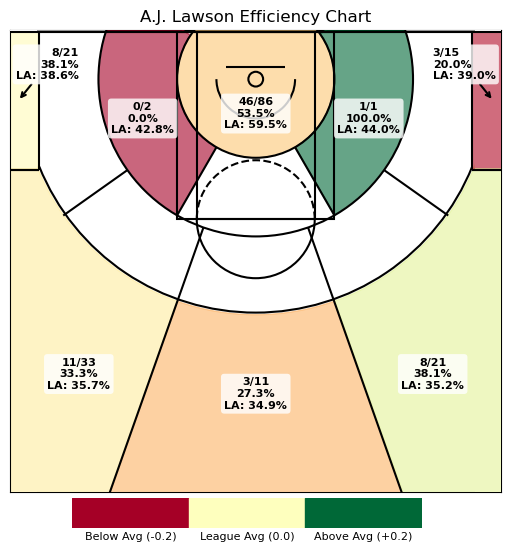

In [6]:
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge, Circle, Arc, Rectangle
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import matplotlib.colorbar as cbar
import numpy as np

# -------------------------------------------------------------------------
# 1. DRAW THE COURT FUNCTION (WITH SHOT ZONE LINES)
# -------------------------------------------------------------------------
def draw_court(ax=None, color="black", lw=1.5, shotzone=False, outer_lines=True):
    """Draws an NBA court with optional shot zones."""
    if ax is None:
        ax = plt.gca()

    # Create various court elements
    hoop = Circle((0, 0), radius=7.5, linewidth=lw, color=color, fill=False, zorder=16)
    backboard = Rectangle((-30, -12.5), 60, 0, linewidth=lw, color=color, zorder=16)
    outer_box = Rectangle((-80, -47.5), 160, 190, linewidth=lw, color=color, fill=False, zorder=16)
    inner_box = Rectangle((-60, -47.5), 120, 190, linewidth=lw, color=color, fill=False, zorder=12)
    top_free_throw = Arc((0, 142.5), 120, 120, theta1=0, theta2=180, linewidth=lw, color=color, fill=False, zorder=16)
    bottom_free_throw = Arc((0, 142.5), 120, 120, theta1=180, theta2=0, linewidth=lw, color=color, linestyle='dashed', zorder=16)
    restricted = Arc((0, 0), 80, 80, theta1=0, theta2=180, linewidth=lw, color=color, zorder=16)
    corner_three_a = Rectangle((-220, -47.5), 0, 140, linewidth=lw, color=color, zorder=16)
    corner_three_b = Rectangle((220, -47.5), 0, 140, linewidth=lw, color=color, zorder=16)
    three_arc = Arc((0, 0), 475, 475, theta1=22, theta2=158, linewidth=lw, color=color, zorder=16)

    court_elements = [hoop, backboard, outer_box, inner_box, top_free_throw,
                      bottom_free_throw, restricted, corner_three_a, corner_three_b, three_arc]
    
    # Shotzone lines
    if shotzone:
        inner_circle = Circle((0, 0), radius=80, linewidth=lw, color='black', fill=False, zorder=12)
        outer_circle = Circle((0, 0), radius=160, linewidth=lw, color='black', fill=False, zorder=12)
        corner_three_a_x = Rectangle((-250, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Right
        corner_three_b_x = Rectangle((220, 92.5), 30, 0, linewidth=lw, color='black', zorder=12) #Left
        inner_line_1 = Rectangle((40, 69.28), 80, 0, angle=60, linewidth=lw, color='black', zorder=12)  # Left Midrange (8-16ft.)
        inner_line_2 = Rectangle((-40, 69.28), 80, 0, angle=120, linewidth=lw, color='black', zorder=12) #Right midrange (8-16ft.)
        inner_line_3 = Rectangle((53.20, 150.89), 290, 0, angle=70.53, linewidth=lw, color='black', zorder=12) #Center Left 3 Point line
        inner_line_4 = Rectangle((-53.20, 150.89), 290, 0, angle=109.47, linewidth=lw, color='black', zorder=12) #Center Right 3 Point line
        inner_line_5 = Rectangle((130.54, 92.5), 80, 0, angle=35.32, linewidth=lw, color='black', zorder=12) #Left midrange (16-24ft.)        
        inner_line_6 = Rectangle((-130.54, 92.5), 80, 0, angle=144.68, linewidth=lw, color='black', zorder=12) #Right midrange (16-24ft.)
        
        court_elements.extend([inner_circle, outer_circle, corner_three_a_x, corner_three_b_x, inner_line_1, inner_line_2, inner_line_3, inner_line_4, inner_line_5, inner_line_6])

    # Add out-of-bounds lines
    if outer_lines:
        court_boundary = Rectangle((-250, -47.5), 500, 470, linewidth=lw, color=color, fill=False)
        court_elements.append(court_boundary)

    for element in court_elements:
        ax.add_patch(element)

    return ax

# -------------------------------------------------------------------------
# 2. DEFINE MIDRANGE ZONES
# -------------------------------------------------------------------------
midrange_zones = {
    "inner_circle": {"center": (0, 0), "inner_radius": 0, "outer_radius": 80, "theta1": -90, "theta2": 270},
    "left_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": -33.9, "theta2": 60},
    "center_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 60.1, "theta2": 120},
    "right_midrange_8_16": {"center": (0, 0), "inner_radius": 80, "outer_radius": 160, "theta1": 120.1, "theta2": 215},
    "left_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": -33.9, "theta2": 35},
    "left_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 35.1, "theta2": 70.5},
    "center_midrange_16-24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 70.6, "theta2": 109.5},
    "right_center_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 109.6, "theta2": 145},
    "right_midrange_16_24": {"center": (0, 0), "inner_radius": 160, "outer_radius": 239.5, "theta1": 145.1, "theta2": 200},
    "left_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": -30, "theta2": 70.5},
    "center_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 460, "theta1": 70.6, "theta2": 109.5},
    "right_above_the_break_3": {"center": (0, 0), "inner_radius": 239.6, "outer_radius": 480, "theta1": 109.6, "theta2": 215}    
}

# -------------------------------------------------------------------------
# 3. MAP EFFICIENCY TO SHADING COLORS
# -------------------------------------------------------------------------
# Define mapping between midrange zones and shot zones
zone_map = {
    "center_above_the_break_3": ("Above the Break 3", "Center(C)", "24+ ft."),
    "left_above_the_break_3": ("Above the Break 3", "Left Side Center(LC)", "24+ ft."),
    "right_above_the_break_3": ("Above the Break 3", "Right Side Center(RC)", "24+ ft."),
    "center_midrange_8_16": ("In The Paint (Non-RA)", "Center(C)", "8-16 ft."),  # Combined Center Area
    "inner_circle": ("Inner Circle", "Center", "Less Than 8 ft."),

    # Now we use the combined labels for left and right 8-16 ft. areas
    "left_midrange_8_16": ("Mid-Range", "Left Side(L)", "8-16 ft."),  
    "right_midrange_8_16": ("Mid-Range", "Right Side(R)", "8-16 ft."),  

    "center_midrange_16-24": ("Mid-Range", "Center(C)", "16-24 ft."),
    "left_center_midrange_16_24": ("Mid-Range", "Left Side Center(LC)", "16-24 ft."),
    "left_midrange_16_24": ("Mid-Range", "Left Side(L)", "16-24 ft."),
    "right_center_midrange_16_24": ("Mid-Range", "Right Side Center(RC)", "16-24 ft."),
    "right_midrange_16_24": ("Mid-Range", "Right Side(R)", "16-24 ft."),
}

# ✅ Get efficiency difference for each zone
efficiency_values = {
    zone: shots_df.loc[shots_df["Zone_Label"] == zone_map[zone], "EffDiff"].mean()
    if zone in zone_map else np.nan  # Use NaN for zones without data
    for zone in midrange_zones.keys()
}

# Calculate stats for each zone
zone_stats = {}
for zone_key, zone_name in zone_map.items():
    zone_shots = shots_df[shots_df["Zone_Label"] == zone_name]
    total_shots = len(zone_shots)
    made_shots = zone_shots["SHOT_MADE_FLAG"].sum()
    shooting_percentage = made_shots / total_shots if total_shots > 0 else 0
    league_avg = league_averages.get(zone_name, 0)
    
    zone_stats[zone_key] = {
        "total_shots": total_shots,
        "made_shots": made_shots,
        "shooting_percentage": shooting_percentage,
        "league_avg": league_avg
    }

# Normalize values for coloring
cmap = cm.RdYlGn

# ✅ Normalize Efficiency Values for Coloring (White for No Shots)
colors = {
    zone: cmap((efficiency_values[zone] + 0.2) / 0.4) if not np.isnan(efficiency_values[zone]) else "white"
    for zone in midrange_zones
}

# -------------------------------------------------------------------------
# 4. PLOT COURT WITH SHADED MIDRANGE AREAS
# -------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 6))

# ✅ Draw the court
draw_court(ax, color="black", lw=1.5, shotzone=True, outer_lines=True)

# ✅ Flip the court 180° by reversing xlim and ylim
ax.set_xlim(250, -250)
ax.set_ylim(420, -50)

# ✅ Shade All Midrange Areas
for key, zone in midrange_zones.items():
    wedge = Wedge(zone["center"], zone["outer_radius"], zone["theta1"], zone["theta2"],
                  width=zone["outer_radius"] - zone["inner_radius"], color=colors[key], alpha=0.6, zorder=5)
    ax.add_patch(wedge)
    
# ✅ Step 4: Add Fully Transparent White Overlay for Both Sides
overlay_left = Rectangle((223, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Left Side
overlay_right = Rectangle((-473, -50), 250, 500, facecolor="white", alpha=1, zorder=10)  # Right Side

ax.add_patch(overlay_left)
ax.add_patch(overlay_right)

# ✅ Step 5: **Re-add the missing court lines on top of the overlay**
#ax.add_patch(Rectangle((-250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Right Sideline
ax.add_patch(Rectangle((-250, -47.5), 500, 0, linewidth=1.5, color="black", zorder=16))  # Baseline
ax.add_patch(Rectangle((250, -47.5), 0, 470, linewidth=1.5, color="black", zorder=16))  # Left Sideline

# ✅ **Re-add the Corner Three-Point Lines on Top of the Overlay**
ax.add_patch(Rectangle((220, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))   # Left Corner Three
ax.add_patch(Rectangle((-250, 92.5), 30, 0, linewidth=1.5, color="black", zorder=16))  # Right Corner Three

# -------------------------------------------------------------------------
# ✅ Extract EffDiff for Corner Threes from shots_df
# -------------------------------------------------------------------------
left_corner_eff = shots_df.loc[
    shots_df["Zone_Label"] == ("Left Corner 3", "Left Side(L)", "24+ ft."), "EffDiff"
].mean()

right_corner_eff = shots_df.loc[
    shots_df["Zone_Label"] == ("Right Corner 3", "Right Side(R)", "24+ ft."), "EffDiff"
].mean()

# ✅ Normalize Efficiency Values for Coloring
color_left_corner = cmap((left_corner_eff + 0.2) / 0.4) if not np.isnan(left_corner_eff) else "gray"
color_right_corner = cmap((right_corner_eff + 0.2) / 0.4) if not np.isnan(right_corner_eff) else "gray"

# ✅ Shade the Left & Right Corner Three Areas **Above the White Overlay**
left_corner_three_shade = Rectangle(
    (220, -47.5), 30, 140, facecolor=color_left_corner, alpha=0.6, zorder=11
)
right_corner_three_shade = Rectangle(
    (-250, -47.5), 30, 140, facecolor=color_right_corner, alpha=0.6, zorder=11
)

ax.add_patch(left_corner_three_shade)
ax.add_patch(right_corner_three_shade)

# ✅ **Redraw the left and right above-the-break three areas**
left_above_break_shade = Rectangle(
    (223, 90), 250, 400, facecolor=colors["left_above_the_break_3"], alpha=0.6, zorder=11
)

right_above_break_shade = Rectangle(
    (-473, 90), 250, 400, facecolor=colors["right_above_the_break_3"], alpha=0.6, zorder=11
)


ax.add_patch(left_above_break_shade)
ax.add_patch(right_above_break_shade)

# -------------------------------------------------------------------------
# ✅ Extract Corner Three Stats for Display
# -------------------------------------------------------------------------
# Left Corner 3 Stats
left_corner_shots = shots_df[shots_df["Zone_Label"] == ("Left Corner 3", "Left Side(L)", "24+ ft.")]
left_corner_total_shots = len(left_corner_shots)
left_corner_made_shots = left_corner_shots["SHOT_MADE_FLAG"].sum()
left_corner_shooting_percentage = left_corner_made_shots / left_corner_total_shots if left_corner_total_shots > 0 else 0
left_corner_league_avg = league_averages.get(("Left Corner 3", "Left Side(L)", "24+ ft."), 0)

# Right Corner 3 Stats
right_corner_shots = shots_df[shots_df["Zone_Label"] == ("Right Corner 3", "Right Side(R)", "24+ ft.")]
right_corner_total_shots = len(right_corner_shots)
right_corner_made_shots = right_corner_shots["SHOT_MADE_FLAG"].sum()
right_corner_shooting_percentage = right_corner_made_shots / right_corner_total_shots if right_corner_total_shots > 0 else 0
right_corner_league_avg = league_averages.get(("Right Corner 3", "Right Side(R)", "24+ ft."), 0)

def add_text_box(ax, x, y, text, zone_key=None, is_inner_circle=False, is_left_corner=False, is_right_corner=False):
    if zone_key and zone_key in colors:
        # Get the zone's color for the text box background
        background_color = colors[zone_key]
    else:
        background_color = "white"  # Default to white if no color is found

    if is_inner_circle:
        # Draw an arrow pointing to the right for the inner circle zone
        ax.annotate(
            text,
            xy=(40, -10), xytext=(x, y),
            fontsize=8, fontweight='bold',
            ha="center", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5),
            bbox=dict(facecolor=background_color, edgecolor='none', boxstyle='round,pad=0.3', alpha=0.8),
            zorder=21
        )
    elif is_left_corner:
        # Draw an arrow pointing left for the left corner 3 area
        ax.annotate(
            text,
            xy=(240, 20), xytext=(x, y),
            fontsize=8, fontweight='bold',
            ha="right", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5, shrinkA=0, shrinkB=0),
            bbox=dict(facecolor=background_color, edgecolor='none', boxstyle='round,pad=0.3', alpha=0.8),
            zorder=21
        )
    elif is_right_corner:
        # Draw an arrow pointing right for the right corner 3 area
        ax.annotate(
            text,
            xy=(-240, 20), xytext=(x, y),
            fontsize=8, fontweight='bold',
            ha="left", va="center",
            arrowprops=dict(arrowstyle="->", color="black", lw=1.5, shrinkA=0, shrinkB=0),
            bbox=dict(facecolor=background_color, edgecolor='none', boxstyle='round,pad=0.3', alpha=0.8),
            zorder=21
        )
    else:
        # Plot bold text for all other zones
        ax.text(
            x, y, text,
            fontsize=8, 
            fontweight='bold',  # Make text bold
            ha="center", 
            va="center", 
            zorder=21,
            bbox=dict(facecolor=background_color, edgecolor='none', boxstyle='round,pad=0.3', alpha=0.8)
        )

# Plot all text boxes
for key, stats in zone_stats.items():
    if stats["total_shots"] > 0:  # Only display if shots are taken in the zone
        text_content = (f"{stats['made_shots']}/{stats['total_shots']}\n"
                        f"{stats['shooting_percentage']:.1%}\n"
                        f"LA: {stats['league_avg']:.1%}")
        
        # Approximate placement for each zone (Adjust as needed)
        if key == "inner_circle":
            add_text_box(ax, 0, 35, text_content)
        elif key == "left_midrange_8_16":
            add_text_box(ax, 115, 40, text_content)  # Flipped to the left side
        elif key == "center_midrange_8_16":
            add_text_box(ax, 0, 115, text_content)
        elif key == "right_midrange_8_16":
            add_text_box(ax, -115, 40, text_content)  # Flipped to the right side
        elif key == "left_midrange_16_24":
            add_text_box(ax, 190, 35, text_content)  # Flipped to the left side
        elif key == "left_center_midrange_16_24":
            add_text_box(ax, 90, 220, text_content)  # Flipped to the left side
        elif key == "center_midrange_16-24":
            add_text_box(ax, 0, 250, text_content)
        elif key == "right_center_midrange_16_24":
            add_text_box(ax, -125, 160, text_content)  # Flipped to the right side
        elif key == "right_midrange_16_24":
            add_text_box(ax, -190, 35, text_content)  # Flipped to the right side
        elif key == "left_above_the_break_3":
            add_text_box(ax, 180, 300, text_content)  # Flipped to the left side
        elif key == "center_above_the_break_3":
            add_text_box(ax, 0, 320, text_content)
        elif key == "right_above_the_break_3":
            add_text_box(ax, -180, 300, text_content)  # Flipped to the right side
            
# ➡️ Add Text for Left and Right Corner 3s (Outside Plot with Arrows)
if left_corner_total_shots > 0:  # Display if data is available
    left_corner_text = (f"{left_corner_made_shots}/{left_corner_total_shots}\n"
                        f"{left_corner_shooting_percentage:.1%}\n"
                        f"LA: {left_corner_league_avg:.1%}")
    add_text_box(ax, 180, -15, left_corner_text, is_left_corner=True)

if right_corner_total_shots > 0:  # Display if data is available
    right_corner_text = (f"{right_corner_made_shots}/{right_corner_total_shots}\n"
                         f"{right_corner_shooting_percentage:.1%}\n"
                         f"LA: {right_corner_league_avg:.1%}")
    add_text_box(ax, -180, -15, right_corner_text, is_right_corner=True)

# ✅ Ensure aspect ratio
ax.set_aspect("equal")

# Remove axis labels
ax.set_xticks([])
ax.set_yticks([])

# Set title
ax.set_title("A.J. Lawson Efficiency Chart")

# Define colors for the three efficiency levels
norm = Normalize(vmin=-0.2, vmax=0.2)  # Define the range for normalization
legend_colors = [cmap(norm(-0.2)), cmap(norm(0.0)), cmap(norm(0.2))]
labels = ["Below Avg (-0.2)", "League Avg (0.0)", "Above Avg (+0.2)"]

# Create a separate axis for the legend
legend_ax = fig.add_axes([0.25, 0.05, 0.5, 0.05])  # [left, bottom, width, height]

# Plot the legend rectangles
for i, (color, label) in enumerate(zip(legend_colors, labels)):
    legend_ax.add_patch(Rectangle((i/3, 0), 1/3, 1, color=color, transform=legend_ax.transAxes))

# Set axis limits and remove axis labels/ticks
legend_ax.set_xlim(0, 1)
legend_ax.set_ylim(0, 1)
legend_ax.set_xticks([])
legend_ax.set_yticks([])
legend_ax.axis('off')

# Add text labels below each rectangle
for i, label in enumerate(labels):
    legend_ax.text((i + 0.5) / 3, -0.3, label, fontsize=8, ha='center', va='center', transform=legend_ax.transAxes)

# Show plot
plt.show()

## BREF

### College

In [51]:
# Re-read and clean data
per_game_stats = pd.read_html(
    'https://www.sports-reference.com/cbb/players/aj-lawson-12.html',
    attrs={"id": "players_per_game"}
)[0]

# Drop unwanted columns
per_game_stats = per_game_stats.drop(columns=['Conf', 'Class', 'Pos', 'Awards'])

# Replace 'Career' with hyphen
per_game_stats['Team'] = per_game_stats['Team'].replace('Career', '-')

# Define custom format rules
three_decimal_cols = ["FG%", "3P%", "2P%", "eFG%", "FT%"]
one_decimal_cols = [col for col in per_game_stats.columns 
                    if col not in ["Season", "Team", "G", "GS"] + three_decimal_cols]

# Build formatting dictionary
format_dict = {col: "{:.3f}" for col in three_decimal_cols}
format_dict.update({col: "{:.1f}" for col in one_decimal_cols})

# Apply formatting and hide index
styled_table = per_game_stats.style.format(format_dict).hide(axis="index")

display(styled_table)

# Save as image
import os
import dataframe_image as dfi

output_dir = r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis"
player_slug = player_name.lower().replace(".", "").replace(" ", "_")
filename = f"{player_slug}_college_stats.png"
save_path = os.path.join(output_dir, filename)

dfi.export(styled_table, save_path, table_conversion='chrome')
print(f"Table saved to: {save_path}")

Season,Team,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
2018-19,South Carolina,29,28,29.9,4.5,10.9,0.411,1.7,4.6,0.358,2.8,6.3,0.451,0.487,2.8,4.1,0.667,0.9,3.4,4.3,2.9,1.1,0.2,2.6,2.0,13.4
2019-20,South Carolina,31,31,29.1,4.4,10.5,0.414,1.8,5.4,0.339,2.5,5.1,0.494,0.502,2.9,4.0,0.724,0.5,3.2,3.7,1.9,1.2,0.1,2.0,2.2,13.4
2020-21,South Carolina,21,21,31.3,5.6,14.1,0.394,2.8,8.0,0.351,2.8,6.1,0.450,0.493,2.7,3.8,0.700,1.0,3.1,4.1,1.2,1.5,0.1,1.5,1.8,16.6
Career,-,81,80,30.0,4.7,11.6,0.407,2.0,5.8,0.349,2.7,5.8,0.465,0.494,2.8,4.0,0.697,0.8,3.2,4.0,2.1,1.2,0.2,2.1,2.0,14.2


Table saved to: C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_college_stats.png


### G League

In [53]:
import requests
from bs4 import BeautifulSoup, Comment
import pandas as pd
from io import StringIO

def get_g_league_combined_stats(player_url):
    response = requests.get(player_url)
    soup = BeautifulSoup(response.text, 'html.parser')
    comments = soup.find_all(string=lambda text: isinstance(text, Comment))

    def extract_table_from_comments(table_id):
        for comment in comments:
            if f'id="{table_id}"' in comment:
                return pd.read_html(StringIO(comment), attrs={"id": table_id})[0]
        raise ValueError(f"Table '{table_id}' not found in comments.")

    per_game_stats = extract_table_from_comments("nbdl_per_game-reg")
    advanced_stats = extract_table_from_comments("nbdl_advanced-reg")

    efg_data = advanced_stats[['Season', 'eFG%']]
    combined = pd.merge(per_game_stats, efg_data, on='Season', how='left')

    # Rename 'Tm' to 'Team' and replace NaNs in Team column
    combined = combined.rename(columns={'Tm': 'Team'})
    combined['Team'] = combined['Team'].fillna('-')

    cols = list(combined.columns)
    if 'eFG%' in cols and '2P%' in cols:
        cols.remove('eFG%')
        insert_idx = cols.index('2P%') + 1
        cols.insert(insert_idx, 'eFG%')
        combined = combined[cols]

    return combined

# Use the function
url = 'https://www.basketball-reference.com/gleague/players/l/lawsoaj01d.html'
g_league_combined = get_g_league_combined_stats(url)

# Apply formatting and hide index
styled_table = g_league_combined.style.format(format_dict).hide(axis="index")

pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
display(styled_table)

# Save as image
import os
import dataframe_image as dfi

output_dir = r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis"
player_slug = player_name.lower().replace(".", "").replace(" ", "_")
filename = f"{player_slug}_g_league_stats.png"
save_path = os.path.join(output_dir, filename)

dfi.export(styled_table, save_path, table_conversion='chrome')
print(f"Table saved to: {save_path}")

Season,Team,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
2021-22,CPS,33,26,31.8,4.5,9.5,0.481,1.5,4.4,0.342,3.0,5.0,0.602,0.561,0.7,1.3,0.545,1.2,5.1,6.3,1.6,1.3,0.4,1.0,2.9,11.8
2022-23,TEX,10,7,26.7,6.8,14.1,0.482,1.9,5.8,0.328,4.9,8.3,0.590,0.550,1.6,2.0,0.800,2.3,5.7,8.0,1.8,1.3,0.6,1.5,1.7,18.1
2024-25,RAP,23,21,31.2,6.6,15.3,0.433,2.4,6.3,0.377,4.2,8.9,0.473,0.511,2.0,3.1,0.648,0.7,4.0,4.7,2.5,1.2,0.2,2.0,2.7,19.0
Career,-,33,26,31.8,4.5,9.5,0.481,1.5,4.4,0.342,3.0,5.0,0.602,0.561,0.7,1.3,0.545,1.2,5.1,6.3,1.6,1.3,0.4,1.0,2.9,11.8


Table saved to: C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_g_league_stats.png


### NBA

In [55]:
import pandas as pd

# Load the table
per_game_stats_nba = pd.read_html(
    'https://www.basketball-reference.com/players/l/lawsoaj01.html',
    attrs={"id": "per_game_stats"}
)[0]

# Drop unwanted rows and columns
per_game_stats_nba = per_game_stats_nba.drop(index=[0, 6, 7, 8, 9])
per_game_stats_nba = per_game_stats_nba.drop(columns=['Age', 'Lg', 'Pos', 'Awards'])

# Replace '3 Yrs' in 'Season' with 'Career' and in 'Tm' with '-'
per_game_stats_nba['Season'] = per_game_stats_nba['Season'].replace('3 Yrs', 'Career')
per_game_stats_nba['Team'] = per_game_stats_nba['Team'].replace('3 Yrs', '-')

# Convert 'G' and 'GS' to whole numbers (integers)
per_game_stats_nba['G'] = per_game_stats_nba['G'].astype(int)
per_game_stats_nba['GS'] = per_game_stats_nba['GS'].astype(int)

# Apply formatting and hide index
styled_table = per_game_stats_nba.style.format(format_dict).hide(axis="index")

# Display result
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
display(styled_table)

# Save as image
import os
import dataframe_image as dfi

output_dir = r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis"
player_slug = player_name.lower().replace(".", "").replace(" ", "_")
filename = f"{player_slug}_nba_stats.png"
save_path = os.path.join(output_dir, filename)

dfi.export(styled_table, save_path, table_conversion='chrome')
print(f"Table saved to: {save_path}")

Season,Team,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
2022-23,MIN,1,0,2.0,1.0,1.0,1.000,0.0,0.0,nan,1.0,1.0,1.000,1.000,0.0,0.0,nan,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0
2022-23,DAL,14,0,7.6,1.5,3.1,0.488,0.7,1.8,0.400,0.8,1.3,0.611,0.605,0.1,0.6,0.250,0.4,1.0,1.4,0.1,0.1,0.0,0.2,0.7,3.9
2023-24,DAL,42,0,7.4,1.3,2.9,0.446,0.3,1.2,0.260,1.0,1.7,0.577,0.500,0.4,0.5,0.652,0.3,0.9,1.2,0.5,0.2,0.1,0.3,0.5,3.2
2024-25,TOR,26,2,18.7,3.1,7.3,0.421,1.3,3.9,0.327,1.8,3.4,0.528,0.508,1.7,2.4,0.683,0.8,2.5,3.3,1.2,0.5,0.2,0.6,1.7,9.1
Career,-,83,2,10.9,1.9,4.3,0.439,0.7,2.1,0.318,1.2,2.2,0.559,0.518,0.7,1.1,0.638,0.5,1.4,1.9,0.6,0.3,0.1,0.4,0.9,5.2


Table saved to: C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_nba_stats.png


# Video Analysis

## FGA

In [4]:
import json
import time
import pandas as pd
import requests
from selenium import webdriver
from selenium.webdriver.chrome.service import Service as ChromeService
from selenium.webdriver.chrome.options import Options
from IPython.display import display, HTML

# ------------------------------------------------------------------------------
# Set up Selenium ChromeDriver
# ------------------------------------------------------------------------------
driver_path = r"C:\Users\PC\OneDrive\Documents\GitHub\chromedriver-win64\chromedriver.exe"
options = Options()
options.add_argument("--headless=new")
options.add_argument("--disable-gpu")
options.add_argument("--no-sandbox")
options.add_argument("user-agent=Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36")
options.set_capability('goog:loggingPrefs', {"performance": "ALL", "browser": "ALL"})
driver = webdriver.Chrome(service=ChromeService(driver_path), options=options)

# ------------------------------------------------------------------------------
# 1. Use Selenium to grab video URLs
# ------------------------------------------------------------------------------
video_urls_data = []
try:
    url = "https://www.nba.com/stats/events?CFID=&CFPARAMS=&ContextMeasure=FGA&EndPeriod=0&EndRange=28800&PlayerID=1630639&RangeType=0&Season=2024-25&SeasonType=Regular%20Season&StartPeriod=0&StartRange=0&TeamID=1610612761&flag=3&sct=plot&section=game"
    driver.set_page_load_timeout(15)
    driver.get(url)
    time.sleep(10)

    logs_raw = driver.get_log("performance")
    logs = [json.loads(lr['message'])['message'] for lr in logs_raw]

    for log in logs:
        req_url = log.get("params", {}).get("request", {}).get("url", "")
        if "videodetails" in req_url:
            try:
                request_id = log["params"]["requestId"]
                body = driver.execute_cdp_cmd("Network.getResponseBody", {"requestId": request_id})["body"]
                data = json.loads(body)
                video_urls = data.get("resultSets", {}).get("Meta", {}).get("videoUrls", [])
                video_urls_data.extend(video_urls)
            except Exception as e:
                print("Error extracting videoUrls:", e)
except Exception as e:
    print("An error occurred:", e)
finally:
    driver.quit()

# ------------------------------------------------------------------------------
# 2. Use API call to get playlist metadata
# ------------------------------------------------------------------------------
playlist_url = "https://stats.nba.com/stats/videodetails"
headers = {
    "Host": "stats.nba.com",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36",
    "Referer": "https://stats.nba.com/"
}
params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "FGA",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "00",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1610612761,
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}
response = requests.get(playlist_url, headers=headers, params=params)

fga_playlist_df = pd.DataFrame()
if response.status_code == 200:
    data = response.json()
    playlist = data.get("resultSets", {}).get("playlist", [])
    if playlist:
        fga_playlist_df = pd.json_normalize(playlist)
        fga_playlist_df["gc"] = fga_playlist_df["gc"].str.split("/").str[0]
        fga_playlist_df = fga_playlist_df[["gc", "gi", "ei", "ha", "va", "dsc", "p", "hpb", "vpb"]]

# ------------------------------------------------------------------------------
# 3. Combine and Display
# ------------------------------------------------------------------------------
if video_urls_data and not fga_playlist_df.empty:
    fga_video_df = pd.DataFrame(video_urls_data)[["uuid", "lurl"]]
    fga_video_df[["gi", "ei"]] = fga_video_df["lurl"].str.extract(r"/(\d{10})/(\d{1,5})/")
    fga_video_df["gi"] = fga_video_df["gi"].astype(str)
    fga_video_df["ei"] = fga_video_df["ei"].astype(str)
    fga_playlist_df["gi"] = fga_playlist_df["gi"].astype(str)
    fga_playlist_df["ei"] = fga_playlist_df["ei"].astype(str)

    merged_df = pd.merge(fga_playlist_df, fga_video_df, on=["gi", "ei"], how="inner")
    merged_df["Video"] = merged_df["lurl"].apply(lambda val: f'<a href="{val}" target="_blank">Watch Clip</a>' if isinstance(val, str) and val.startswith("http") else val)

    final_df = merged_df[["gc", "gi", "ei", "ha", "va", "dsc", "p", "hpb", "vpb", "Video"]]
    display(HTML(final_df.to_html(escape=False, index=False)))
else:
    print("Video data or playlist metadata is missing.")

gc,gi,ei,ha,va,dsc,p,hpb,vpb,Video
2024-12-23,0022400397,653,NYK,TOR,Lawson 26' 3PT Jump Shot (3 PTS) (Battle 2 AST),4,133,115,Watch Clip
2024-12-26,0022400414,678,MEM,TOR,MISS Lawson 3' Driving Layup#@#Jackson Jr. BLOCK (3 BLK),4,142,117,Watch Clip
2024-12-26,0022400414,712,MEM,TOR,Lawson 1' Running Alley Oop Dunk Shot (2 PTS) (Mogbo 1 AST),4,147,117,Watch Clip
2024-12-26,0022400414,758,MEM,TOR,Lawson 26' 3PT Jump Shot (6 PTS) (Chomche 1 AST),4,155,123,Watch Clip
2024-12-31,0022400449,422,BOS,TOR,MISS Lawson 27' 3PT Jump Shot,3,71,48,Watch Clip
2024-12-31,0022400449,621,BOS,TOR,MISS Lawson 28' 3PT Jump Shot,4,118,67,Watch Clip
2024-12-31,0022400449,629,BOS,TOR,MISS Lawson 3PT Jump Shot,4,123,69,Watch Clip
2025-01-21,0022400608,657,TOR,ORL,Lawson 3' Running Layup (2 PTS) (Chomche 1 AST),4,107,87,Watch Clip
2025-03-02,0022400870,216,ORL,TOR,MISS Lawson 4' Running Layup#@#da Silva BLOCK (1 BLK),2,23,29,Watch Clip
2025-03-02,0022400870,601,ORL,TOR,MISS Lawson 2' Running Alley Oop Layup Shot,4,77,94,Watch Clip


### Shooting Montage

In [22]:
from moviepy import VideoFileClip, concatenate_videoclips

# List your downloaded clip paths
clip_paths = [
    r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_high_off_glass.mp4",
    r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_block_plus_layup.mp4",
    r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_3_(1).mp4",
    r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_clutch_3.mp4",
    r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_reverse_layup_miss.mp4",
    r"C:\Users\PC\OneDrive\Documents\GitHub\Raptors_905\Raptors 905 Advanced Analysis\aj_lawson_contested_layup_miss.mp4"
]

# Load and trim each clip if necessary
clips = [VideoFileClip(path) for path in clip_paths]

# Optionally resize or add transitions/fades here

# Concatenate all clips
final_video = concatenate_videoclips(clips, method="compose")

# Export the montage
final_video.write_videofile("aj_lawson_montage.mp4", codec="libx264", fps=60)

{'video_found': True, 'audio_found': True, 'metadata': {'major_brand': 'M4V', 'minor_version': '1', 'compatible_brands': 'isomavc1mp42', 'creation_time': '2025-03-05T02:41:30.000000Z'}, 'inputs': [{'streams': [{'input_number': 0, 'stream_number': 0, 'stream_type': 'video', 'language': None, 'default': True, 'size': [1280, 720], 'bitrate': 6534, 'fps': 60.0, 'codec_name': 'h264', 'profile': '(Main)', 'metadata': {'Metadata': '', 'creation_time': '2025-03-05T02:41:30.000000Z', 'handler_name': 'ETI ISO Video Media Handler', 'vendor_id': '[0][0][0][0]', 'encoder': 'Elemental H.264'}}, {'input_number': 0, 'stream_number': 1, 'stream_type': 'audio', 'language': None, 'default': True, 'fps': 48000, 'bitrate': 96, 'metadata': {'Metadata': '', 'creation_time': '2025-03-05T02:41:30.000000Z', 'handler_name': 'ETI ISO Audio Media Handler', 'vendor_id': '[0][0][0][0]'}}], 'input_number': 0}], 'duration': 10.45, 'bitrate': 6644, 'start': 0.0, 'default_video_input_number': 0, 'default_video_stream_nu

MoviePy - Done.
MoviePy - Writing video aj_lawson_montage.mp4



MoviePy - Done !
MoviePy - video ready aj_lawson_montage.mp4


## REB

In [25]:
import json
import time
import pandas as pd
from selenium import webdriver
from selenium.webdriver.chrome.service import Service as ChromeService
from selenium.webdriver.chrome.options import Options
from IPython.display import display, HTML

# Set up ChromeDriver path
driver_path = r"C:\Users\PC\OneDrive\Documents\GitHub\chromedriver-win64\chromedriver.exe"

# Initialize Chrome options
options = Options()
custom_user_agent = (
    "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
    "AppleWebKit/537.36 (KHTML, like Gecko) "
    "Chrome/91.0.4472.124 Safari/537.36"
)
options.add_argument(f"user-agent={custom_user_agent}")
options.add_argument("--headless=new")
options.add_argument("--disable-gpu")
options.add_argument("--no-sandbox")
options.set_capability('goog:loggingPrefs', {"performance": "ALL", "browser": "ALL"})

# Initialize ChromeDriver
service = ChromeService(driver_path)
driver = webdriver.Chrome(service=service, options=options)

try:
    # Navigate to the NBA stats events page for the player
    url = "https://www.nba.com/stats/events?CFID=&CFPARAMS=&ContextMeasure=REB&EndPeriod=0&EndRange=28800&PlayerID=1630639&RangeType=0&Season=2024-25&SeasonType=Regular%20Season&StartPeriod=0&StartRange=0&TeamID=1610612761&flag=3&sct=plot&section=game"
    driver.set_page_load_timeout(15)
    driver.get(url)

    # Allow time for network requests to load
    time.sleep(10)

    # Extract performance logs
    logs_raw = driver.get_log("performance")
    logs = [json.loads(lr['message'])['message'] for lr in logs_raw]

    video_urls_data = []
    for log in logs:
        url = log.get("params", {}).get("request", {}).get("url", "")
        if "videodetails" in url:
            try:
                request_id = log["params"]["requestId"]
                body = driver.execute_cdp_cmd("Network.getResponseBody", {"requestId": request_id})["body"]
                data = json.loads(body)
                video_urls = data.get("resultSets", {}).get("Meta", {}).get("videoUrls", [])
                video_urls_data.extend(video_urls)
            except Exception as e:
                print("Error extracting videoUrls:", e)

except Exception as e:
    print("An error occurred:", e)
finally:
    driver.quit()

# Display results as interactive HTML table
if video_urls_data:
    reb_video_df = pd.DataFrame(video_urls_data)

    # Optional: keep only a few useful columns for clarity
    columns_to_show = [
        "uuid", "lurl"
    ]
    reb_video_df = reb_video_df[columns_to_show]

    # Make URL columns clickable
    def make_clickable(val):
        return f'<a href="{val}" target="_blank">{val}</a>' if isinstance(val, str) and val.startswith("http") else val

    reb_df_html = reb_video_df.map(make_clickable)

    # Render the HTML table
    display(HTML(reb_df_html.to_html(escape=False, index=False)))
else:
    print("No videoUrls found in the performance logs.")
    
#&GameID=0022400870

uuid,lurl
ce5c2be1-e018-5a02-7c06-c5de12319cb1,https://videos.nba.com/nba/pbp/media/2024/12/26/0022400414/728/ce5c2be1-e018-5a02-7c06-c5de12319cb1_1280x720.mp4
12e67e86-fecb-7d3a-f954-e4027ac46baf,https://videos.nba.com/nba/pbp/media/2024/12/26/0022400414/755/12e67e86-fecb-7d3a-f954-e4027ac46baf_1280x720.mp4
69e18f8d-cab2-270e-9a52-e0580c6ef536,https://videos.nba.com/nba/pbp/media/2024/12/31/0022400449/428/69e18f8d-cab2-270e-9a52-e0580c6ef536_1280x720.mp4
5389ec5b-401d-7415-eb45-35f705989f30,https://videos.nba.com/nba/pbp/media/2025/02/23/0022400816/690/5389ec5b-401d-7415-eb45-35f705989f30_1280x720.mp4
8bb375c4-82ca-3b2f-577f-7a6f78f4bfb5,https://videos.nba.com/nba/pbp/media/2025/03/04/0022400883/149/8bb375c4-82ca-3b2f-577f-7a6f78f4bfb5_1280x720.mp4
cb4ca233-83af-faa9-f064-d9411a462dd4,https://videos.nba.com/nba/pbp/media/2025/03/04/0022400883/154/cb4ca233-83af-faa9-f064-d9411a462dd4_1280x720.mp4
fbcc6b0a-c74d-96e1-7a86-5c684f231327,https://videos.nba.com/nba/pbp/media/2025/03/07/0022400905/294/fbcc6b0a-c74d-96e1-7a86-5c684f231327_1280x720.mp4
e7248916-2d7c-7468-c185-e9921efb9b50,https://videos.nba.com/nba/pbp/media/2025/03/07/0022400905/432/e7248916-2d7c-7468-c185-e9921efb9b50_1280x720.mp4
4549dfbf-fde2-4dcc-8065-afade5ada267,None
aedf6402-234f-1a8a-6196-01dba0adb95f,https://videos.nba.com/nba/pbp/media/2025/03/08/0022400915/248/aedf6402-234f-1a8a-6196-01dba0adb95f_1280x720.mp4


In [26]:
import requests
import pandas as pd
import numpy as np
from IPython.display import display, HTML

# -------------------------------------------------------------------------
# 1. RETRIEVE A.J. LAWSON'S SHOT DATA
# -------------------------------------------------------------------------

url = "https://stats.nba.com/stats/videodetails"
headers = {
    "Host": "stats.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": (
        "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
        "AppleWebKit/537.36 (KHTML, like Gecko) "
        "Chrome/91.0.4472.124 Safari/537.36"
    ),
    "Origin": "https://stats.nba.com",
    "Referer": "https://stats.nba.com/"
}
params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "REB",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "00",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1610612761,
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}

response = requests.get(url, headers=headers, params=params)

# -------------------------------------------------------------------------
# 2. EXTRACT playlist PLAYLIST INFO
# -------------------------------------------------------------------------

if response.status_code == 200:
    data = response.json()
    playlist_data = data.get("resultSets", {})

    reb_playlist = playlist_data.get("playlist", [])

    if reb_playlist:
        reb_playlist_df = pd.json_normalize(reb_playlist)
        
        # Clean up 'gc' to keep only the date
        reb_playlist_df["gc"] = reb_playlist_df["gc"].str.split("/").str[0]
        
        # Optional: choose only relevant columns to display
        columns_to_show = ["gc", "gi", "ei", "ha", "va", "dsc", "p", "hpb", "vpb"]
        reb_playlist_df = reb_playlist_df[columns_to_show]

        # Render as HTML table
        display(HTML(reb_playlist_df.to_html(index=False)))
    else:
        print("No playlist playlist data found.")
else:
    print(f"Request failed with status code {response.status_code}")

gc,gi,ei,ha,va,dsc,p,hpb,vpb
2024-12-26,0022400414,728,MEM,TOR,Lawson REBOUND (Off:0 Def:1),4,152,122
2024-12-26,0022400414,755,MEM,TOR,Lawson REBOUND (Off:0 Def:2),4,155,123
2024-12-31,0022400449,428,BOS,TOR,Lawson REBOUND (Off:1 Def:0),3,74,48
2025-02-23,0022400816,690,TOR,PHX,Lawson REBOUND (Off:0 Def:1),4,127,109
2025-03-04,0022400883,149,ORL,TOR,Lawson REBOUND (Off:0 Def:1),1,20,15
2025-03-04,0022400883,154,ORL,TOR,Lawson REBOUND (Off:0 Def:2),1,20,15
2025-03-07,0022400905,294,TOR,UTA,Lawson REBOUND (Off:0 Def:1),2,42,36
2025-03-07,0022400905,432,TOR,UTA,Lawson REBOUND (Off:1 Def:1),3,63,52
2025-03-07,0022400905,439,TOR,UTA,Lawson REBOUND (Off:2 Def:1),3,63,54
2025-03-08,0022400915,248,TOR,WAS,Lawson REBOUND (Off:1 Def:0),2,45,39


In [28]:
# Step 1: Extract 'gi' and 'ei' from the lurl
# Example lurl: https://videos.nba.com/nba/pbp/media/2024/12/23/0022400397/653/uuid.mp4
reb_video_df[["gi", "ei"]] = reb_video_df["lurl"].str.extract(r"/(\d{10})/(\d{1,5})/")

# Convert to string
reb_video_df["gi"] = reb_video_df["gi"].astype(str)
reb_video_df["ei"] = reb_video_df["ei"].astype(str)
reb_playlist_df["gi"] = reb_playlist_df["gi"].astype(str)
reb_playlist_df["ei"] = reb_playlist_df["ei"].astype(str)

# Step 2: Perform merge on both gi and ei
merged_df = pd.merge(reb_playlist_df, reb_video_df, on=["gi", "ei"], how="inner")

# Step 3: Make video link clickable
def make_clickable(val):
    return f'<a href="{val}" target="_blank">Watch Clip</a>' if isinstance(val, str) and val.startswith("http") else val

merged_df["Video"] = merged_df["lurl"].apply(make_clickable)

# Step 4: Display selected columns
columns_to_display = ["gc", "gi", "ei", "ha", "va", "dsc", "p", "hpb", "vpb", "Video"]
final_df = merged_df[columns_to_display]

from IPython.display import display, HTML
display(HTML(final_df.to_html(escape=False, index=False)))

gc,gi,ei,ha,va,dsc,p,hpb,vpb,Video
2024-12-26,0022400414,728,MEM,TOR,Lawson REBOUND (Off:0 Def:1),4,152,122,Watch Clip
2024-12-26,0022400414,755,MEM,TOR,Lawson REBOUND (Off:0 Def:2),4,155,123,Watch Clip
2024-12-31,0022400449,428,BOS,TOR,Lawson REBOUND (Off:1 Def:0),3,74,48,Watch Clip
2025-02-23,0022400816,690,TOR,PHX,Lawson REBOUND (Off:0 Def:1),4,127,109,Watch Clip
2025-03-04,0022400883,149,ORL,TOR,Lawson REBOUND (Off:0 Def:1),1,20,15,Watch Clip
2025-03-04,0022400883,154,ORL,TOR,Lawson REBOUND (Off:0 Def:2),1,20,15,Watch Clip
2025-03-07,0022400905,294,TOR,UTA,Lawson REBOUND (Off:0 Def:1),2,42,36,Watch Clip
2025-03-07,0022400905,432,TOR,UTA,Lawson REBOUND (Off:1 Def:1),3,63,52,Watch Clip
2025-03-08,0022400915,248,TOR,WAS,Lawson REBOUND (Off:1 Def:0),2,45,39,Watch Clip
2025-03-08,0022400915,427,TOR,WAS,Lawson REBOUND (Off:2 Def:0),3,65,69,Watch Clip


*Wiling to box out and grab rebounds but a lot of them are lucky and do not reflect an elite rebounder

# Graveyard

## Hexbin Plot

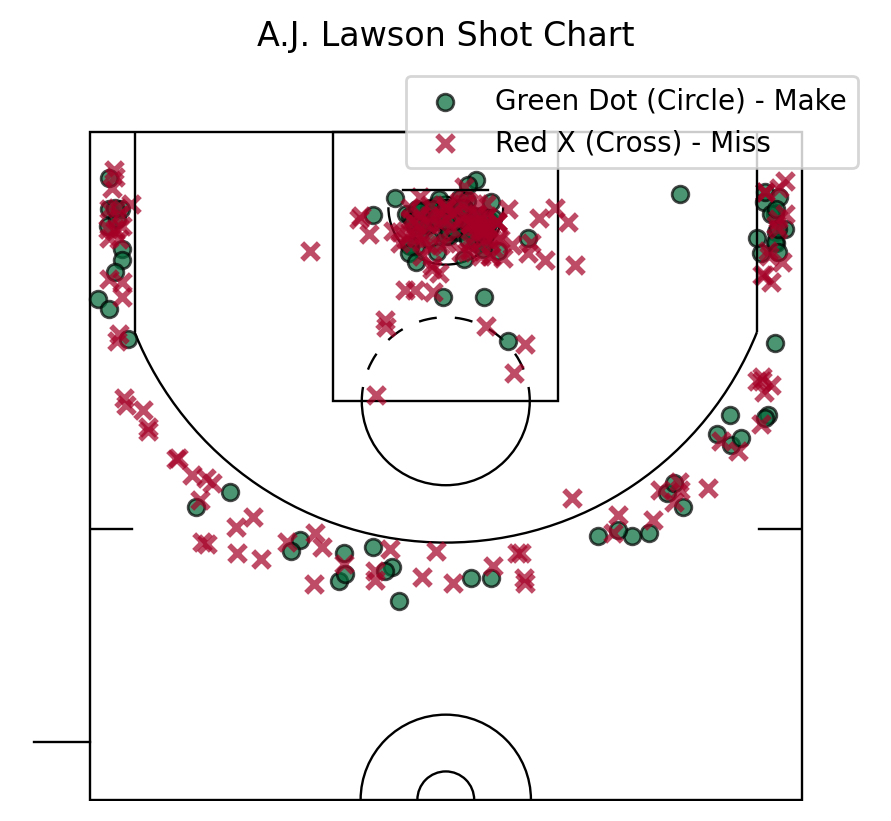

In [84]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from mplbasketball import Court
from matplotlib import colormaps

# -------------------------------------------------------------------------
# 1. RETRIEVE YOUR SHOT DATA
# -------------------------------------------------------------------------
game_ids = [
    "2022400344",
    "2022400331",
    "2022400303",
    "2022400287",
    "2022400277",
    "2022400247",
    "2022400235",
    "2022400223",
    "2022400210",
    "2022400198",
    "2022400182",
    "2022400166",
    "2022400153",
    "2022400140",
    "2022400122",
    "2022400108",
    "2022400095",
    "2022400087",
    "2022400056",
    "2022400047",
    "2022400021",
    "2022400001",
]

url = "https://stats.gleague.nba.com/stats/shotchartdetail"
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": (
        "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
        "AppleWebKit/537.36 (KHTML, like Gecko) "
        "Chrome/91.0.4472.124 Safari/537.36"
    ),
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/"
}
base_params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "FGM",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "20",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1612709920,
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}

all_shotchart_data = []
for game_id in game_ids:
    params = base_params.copy()
    params["GameID"] = game_id
    response = requests.get(url, headers=headers, params=params)
    if response.status_code == 200:
        data = response.json()
        shot_data = data["resultSets"][0]
        headers_list = shot_data["headers"]
        rows = shot_data["rowSet"]
        
        df_game = pd.DataFrame(rows, columns=headers_list)
        df_game["GameID"] = game_id
        all_shotchart_data.append(df_game)
    else:
        print(f"Request failed for GameID {game_id} with status code {response.status_code}")

if all_shotchart_data:
    all_shotchart_df = pd.concat(all_shotchart_data, ignore_index=True)
else:
    raise ValueError("No data retrieved.")

# -------------------------------------------------------------------------
# 2. NORMALIZE THE SHOT DATA TO MATCH MPLBASKETBALL'S COORDINATES
# -------------------------------------------------------------------------
# 2a) Convert from tenths of a foot to feet.
all_shotchart_df["x_ft"] = all_shotchart_df["LOC_X"] / 10.0
all_shotchart_df["y_ft"] = all_shotchart_df["LOC_Y"] / 10.0

# 2b) Flip Y if data is left-handed (so y increases upward).
all_shotchart_df["y_ft"] = -all_shotchart_df["y_ft"]

# 2c) Shift so that the basket is at (0, 41.7)
all_shotchart_df["x_plot"] = all_shotchart_df["x_ft"]
all_shotchart_df["y_plot"] = all_shotchart_df["y_ft"] + 41.7

# -------------------------------------------------------------------------
# 3. PLOT THE SHOT DATA ON THE MPLBASKETBALL COURT WITH A CUSTOM LEGEND
# -------------------------------------------------------------------------
court = Court(court_type="nba", origin="center", units="ft")
fig, ax = court.draw(orientation="vu")

# Use the RdYlGn colormap to get our desired colors.
cmap = colormaps["RdYlGn"]
# For SHOT_MADE_FLAG, we map 1 to green and 0 to red.
color_make = cmap(1.0)   # green end
color_miss = cmap(0.0)   # red end

# Separate made and missed shots.
df_made = all_shotchart_df[all_shotchart_df["SHOT_MADE_FLAG"] == 1]
df_missed = all_shotchart_df[all_shotchart_df["SHOT_MADE_FLAG"] == 0]

# Plot made shots as circles using the RdYlGn color for makes.
ax.scatter(
    df_made["x_plot"],
    df_made["y_plot"],
    marker='o',
    color=color_make,
    edgecolor="black",
    alpha=0.7,
    label="Green Dot (Circle) - Make"
)

# Plot missed shots as X's using the RdYlGn color for misses.
ax.scatter(
    df_missed["x_plot"],
    df_missed["y_plot"],
    marker='x',
    color=color_miss,
    linewidths=2,
    alpha=0.7,
    label="Red X (Cross) - Miss"
)

ax.legend(loc="upper right")
plt.xlabel("X (ft)")
plt.ylabel("Y (ft)")
plt.title("A.J. Lawson Shot Chart")
plt.show()

#all_shotchart_df

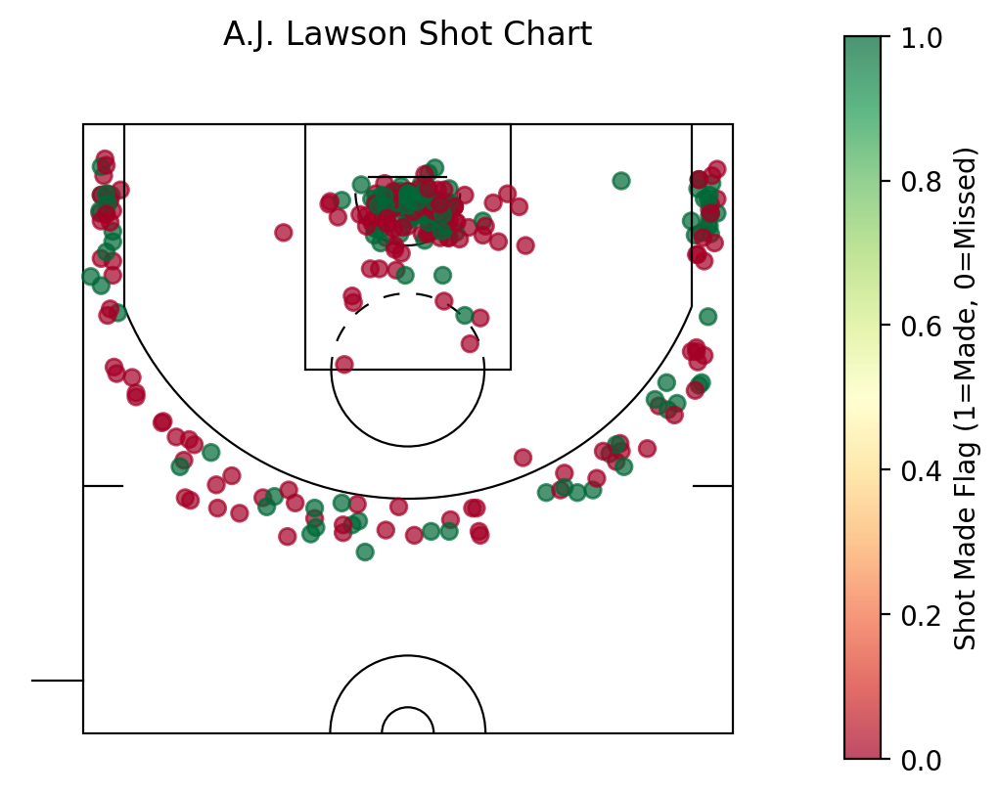

In [86]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from mplbasketball import Court
import matplotlib.transforms as transforms

# -------------------------------------------------------------------------
# 1. RETRIEVE YOUR SHOT DATA
# -------------------------------------------------------------------------
game_ids = [
    "2022400344",
    "2022400331",
    "2022400303",
    "2022400287",
    "2022400277",
    "2022400247",
    "2022400235",
    "2022400223",
    "2022400210",
    "2022400198",
    "2022400182",
    "2022400166",
    "2022400153",
    "2022400140",
    "2022400122",
    "2022400108",
    "2022400095",
    "2022400087",
    "2022400056",
    "2022400047",
    "2022400021",
    "2022400001",
]

url = "https://stats.gleague.nba.com/stats/shotchartdetail"
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": (
        "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
        "AppleWebKit/537.36 (KHTML, like Gecko) "
        "Chrome/91.0.4472.124 Safari/537.36"
    ),
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/"
}
base_params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "FGM",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "20",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1612709920,
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}

all_shotchart_data = []
for game_id in game_ids:
    params = base_params.copy()
    params["GameID"] = game_id
    response = requests.get(url, headers=headers, params=params)
    if response.status_code == 200:
        data = response.json()
        shot_data = data["resultSets"][0]
        headers_list = shot_data["headers"]
        rows = shot_data["rowSet"]
        
        df_game = pd.DataFrame(rows, columns=headers_list)
        df_game["GameID"] = game_id
        all_shotchart_data.append(df_game)
    else:
        print(f"Request failed for GameID {game_id} with status code {response.status_code}")

if all_shotchart_data:
    all_shotchart_df = pd.concat(all_shotchart_data, ignore_index=True)
else:
    raise ValueError("No data retrieved.")

# --- 1) Convert from tenths of a foot to feet
all_shotchart_df["x_ft"] = all_shotchart_df["LOC_X"] / 10.0
all_shotchart_df["y_ft"] = all_shotchart_df["LOC_Y"] / 10.0

# --- 2) (Optional) Flip Y if data is left-handed
all_shotchart_df["y_ft"] = -all_shotchart_df["y_ft"]

# --- 3) Shift so that the basket is at (0, 41.7)
all_shotchart_df["x_plot"] = all_shotchart_df["x_ft"]
all_shotchart_df["y_plot"] = all_shotchart_df["y_ft"] + 41.7

# --- 4) Plot with mplbasketball
court = Court(court_type="nba", origin="center", units="ft")
fig, ax = court.draw(orientation="vu")

scatter = ax.scatter(
    all_shotchart_df["x_plot"],
    all_shotchart_df["y_plot"],
    c=all_shotchart_df["SHOT_MADE_FLAG"],
    cmap='RdYlGn', #Coolwarm
    alpha=0.7
)
plt.colorbar(scatter, label="Shot Made Flag (1=Made, 0=Missed)")
plt.xlabel("X (ft)")
plt.ylabel("Y (ft)")
plt.title("A.J. Lawson Shot Chart")
plt.show()

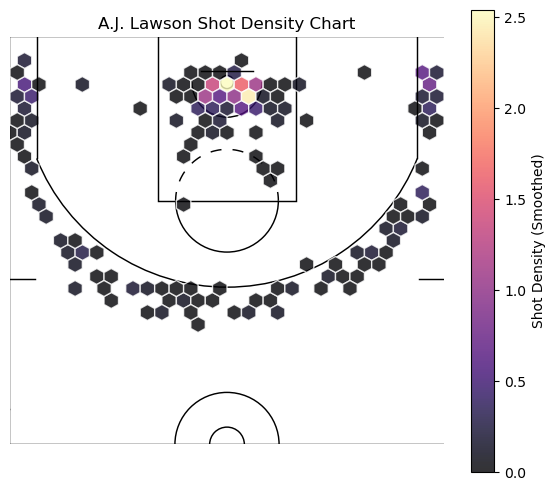

In [62]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from mplbasketball import Court
import numpy as np
from scipy.ndimage import gaussian_filter

# -------------------------------------------------------------------------
# 1. RETRIEVE YOUR SHOT DATA
# -------------------------------------------------------------------------
game_ids = [
    "2022400479",
    "2022400479",
    "2022400344",
    "2022400331",
    "2022400303",
    "2022400287",
    "2022400277",
    "2022400247",
    "2022400235",
    "2022400223",
    "2022400210",
    "2022400198",
    "2022400182",
    "2022400166",
    "2022400153",
    "2022400140",
    "2022400122",
    "2022400108",
    "2022400095",
    "2022400087",
    "2022400056",
    "2022400047",
    "2022400021",
    "2022400001",
]

url = "https://stats.gleague.nba.com/stats/shotchartdetail"
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": (
        "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
        "AppleWebKit/537.36 (KHTML, like Gecko) "
        "Chrome/91.0.4472.124 Safari/537.36"
    ),
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/"
}
base_params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "FGA",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "20",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1612709920,
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}

all_shotchart_data = []
for game_id in game_ids:
    params = base_params.copy()
    params["GameID"] = game_id
    resp = requests.get(url, headers=headers, params=params)
    if resp.status_code == 200:
        data = resp.json()
        shot_data = data["resultSets"][0]
        headers_list = shot_data["headers"]
        rows = shot_data["rowSet"]
        
        df_game = pd.DataFrame(rows, columns=headers_list)
        df_game["GameID"] = game_id
        all_shotchart_data.append(df_game)
    else:
        print(f"Request failed for GameID {game_id} with status code {resp.status_code}")

if not all_shotchart_data:
    raise ValueError("No data retrieved.")

all_shotchart_df = pd.concat(all_shotchart_data, ignore_index=True)

# -------------------------------------------------------------------------
# 2. NORMALIZE THE SHOT DATA
# -------------------------------------------------------------------------
all_shotchart_df["x_ft"] = all_shotchart_df["LOC_X"] / 10.0
all_shotchart_df["y_ft"] = all_shotchart_df["LOC_Y"] / 10.0
all_shotchart_df["y_ft"] = -all_shotchart_df["y_ft"]
all_shotchart_df["x_plot"] = all_shotchart_df["x_ft"]
all_shotchart_df["y_plot"] = all_shotchart_df["y_ft"] + 41.7

# -------------------------------------------------------------------------
# 3. BUILD A SMOOTH HEATMAP OVER HALF-COURT RANGE
#    (x in [-25, 25], y in [0, 47])
# -------------------------------------------------------------------------
xvals = all_shotchart_df["x_plot"].values
yvals = all_shotchart_df["y_plot"].values

# We'll clamp the histogram to the standard half-court range:
x_min, x_max = -25, 25
y_min, y_max = 0, 47

# Create bin edges
xbins = np.linspace(x_min, x_max, 101)  # 100 bins in x
ybins = np.linspace(y_min, y_max, 101)  # 100 bins in y

fig, ax = plt.subplots(figsize=(7, 6))

# Draw the half-court (NBA, center origin, vertical up orientation)
court = Court(court_type="nba", origin="center", units="ft")
court.draw(ax=ax, orientation="vu")

# Define the half-court bounds: x in [-25, 25], y in [0, 47]
x_min, x_max = -25, 25
y_min, y_max = 0, 47

# Create a hexbin plot instead of the heatmap
hb = ax.hexbin(
    all_shotchart_df["x_plot"],
    all_shotchart_df["y_plot"],
    gridsize=30,
    extent=(x_min, x_max, y_min, y_max),
    cmap="magma",
    mincnt=1,
    alpha=0.8,
    edgecolors="white")  # Add white borders to hexagons for better visibility

# Build a 2D histogram for shot density
#heatmap, _, _ = np.histogram2d(xvals, yvals, bins=[xbins, ybins])

# Smooth the histogram with a Gaussian filter
#heatmap_smooth = gaussian_filter(heatmap, sigma=1.5)

# -------------------------------------------------------------------------
# 4. PLOT THE SMOOTH HEATMAP
# -------------------------------------------------------------------------
#fig, ax = plt.subplots(figsize=(7, 6))

# Draw the half-court with center origin, top half orientation
#court = Court(court_type="nba", origin="center", units="ft")
#court.draw(ax=ax, orientation="vu")

# Show the smoothed heatmap with matching extent
#extent = [x_min, x_max, y_min, y_max]
#im = ax.imshow(
    #heatmap_smooth.T,
    #extent=extent,
    #origin="lower",
    #cmap="magma",
    #alpha=0.8,
    #aspect="auto"
#)

# Force the axes to match the half-court range
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Colorbar
cb = plt.colorbar(im, ax=ax)
cb.set_label("Shot Density (Smoothed)")

ax.set_xlabel("X (ft)")
ax.set_ylabel("Y (ft)")
ax.set_title("A.J. Lawson Shot Density Chart")

plt.show()

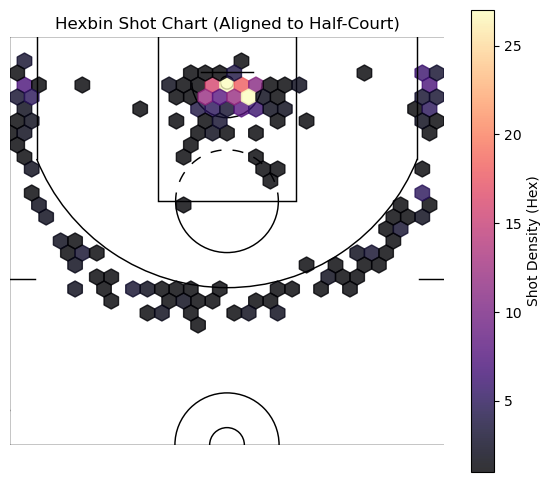

In [63]:
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplbasketball import Court

# -------------------------------------------------------------------------
# 1. RETRIEVE YOUR SHOT DATA
# -------------------------------------------------------------------------
game_ids = [
    "2022400479",
    "2022400344",
    "2022400331",
    "2022400303",
    "2022400287",
    "2022400277",
    "2022400247",
    "2022400235",
    "2022400223",
    "2022400210",
    "2022400198",
    "2022400182",
    "2022400166",
    "2022400153",
    "2022400140",
    "2022400122",
    "2022400108",
    "2022400095",
    "2022400087",
    "2022400056",
    "2022400047",
    "2022400021",
    "2022400001"
]

url = "https://stats.gleague.nba.com/stats/shotchartdetail"
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": (
        "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
        "AppleWebKit/537.36 (KHTML, like Gecko) "
        "Chrome/91.0.4472.124 Safari/537.36"
    ),
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/"
}
base_params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "FGM",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "20",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,      # Example Player ID
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1612709920,     # Example Team ID
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}

all_shotchart_data = []
for game_id in game_ids:
    params = base_params.copy()
    params["GameID"] = game_id
    resp = requests.get(url, headers=headers, params=params)
    if resp.status_code == 200:
        data = resp.json()
        shot_data = data["resultSets"][0]
        headers_list = shot_data["headers"]
        rows = shot_data["rowSet"]
        
        df_game = pd.DataFrame(rows, columns=headers_list)
        df_game["GameID"] = game_id
        all_shotchart_data.append(df_game)
    else:
        print(f"Request failed for GameID {game_id} with status code {resp.status_code}")

if not all_shotchart_data:
    raise ValueError("No data retrieved.")

all_shotchart_df = pd.concat(all_shotchart_data, ignore_index=True)

# -------------------------------------------------------------------------
# 2. NORMALIZE THE SHOT DATA TO MATCH THE HALF-COURT COORDINATES
# -------------------------------------------------------------------------
# Convert from tenths of a foot to feet
all_shotchart_df["x_ft"] = all_shotchart_df["LOC_X"] / 10.0
all_shotchart_df["y_ft"] = all_shotchart_df["LOC_Y"] / 10.0

# Flip Y if data is left-handed (so y increases upward)
all_shotchart_df["y_ft"] = -all_shotchart_df["y_ft"]

# Shift so that the basket is at (0, 41.7)
all_shotchart_df["x_plot"] = all_shotchart_df["x_ft"]
all_shotchart_df["y_plot"] = all_shotchart_df["y_ft"] + 41.7

# -------------------------------------------------------------------------
# 3. CREATE A HEXBIN PLOT ALIGNED TO THE HALF-COURT
# -------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 6))

# Draw the half-court (NBA, center origin, vertical up orientation)
court = Court(court_type="nba", origin="center", units="ft")
court.draw(ax=ax, orientation="vu")

# Define the half-court bounds: x in [-25, 25], y in [0, 47]
x_min, x_max = -25, 25
y_min, y_max = 0, 47

# Create a hexbin of shot density
hb = ax.hexbin(
    all_shotchart_df["x_plot"],
    all_shotchart_df["y_plot"],
    gridsize=30,       # sets the resolution of the hex bins
    extent=(x_min, x_max, y_min, y_max),
    cmap="magma",      # choose your colormap
    mincnt=1,          # only show bins with >=1 shot
    alpha=0.8
)

# Enforce the same coordinate limits as the drawn court
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Add a colorbar
cb = plt.colorbar(hb, ax=ax)
cb.set_label("Shot Density (Hex)")

ax.set_xlabel("X (ft)")
ax.set_ylabel("Y (ft)")
ax.set_title("Hexbin Shot Chart (Aligned to Half-Court)")

plt.show()

## Shooting by Zone

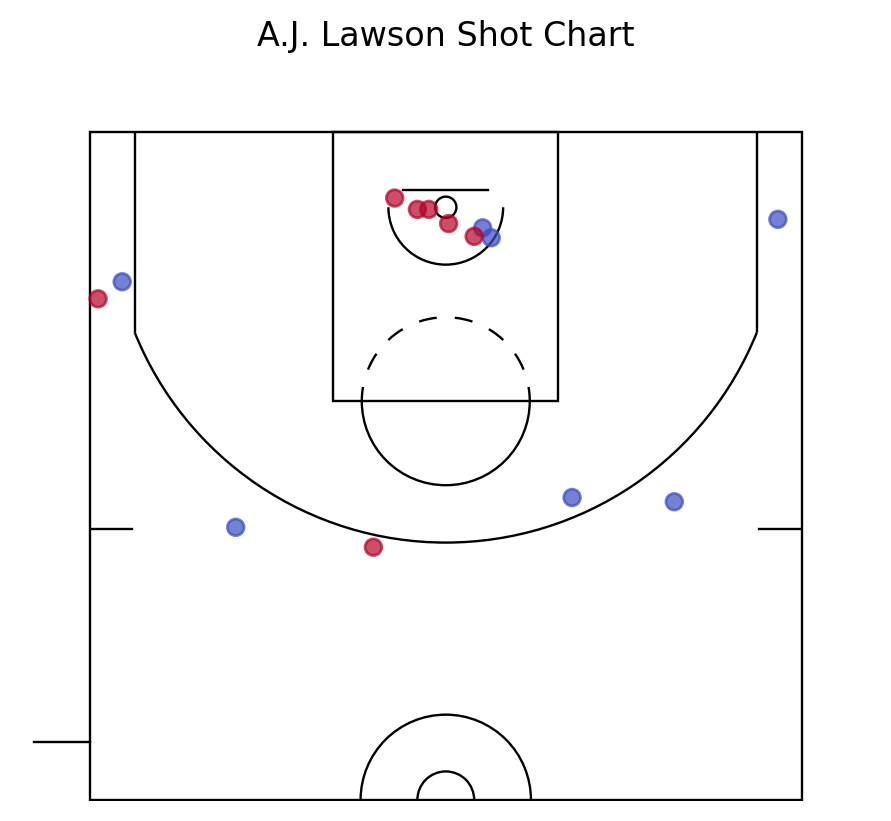

,GRID_TYPE,GAME_ID,GAME_EVENT_ID,PLAYER_ID,PLAYER_NAME,TEAM_ID,TEAM_NAME,PERIOD,MINUTES_REMAINING,SECONDS_REMAINING,EVENT_TYPE,ACTION_TYPE,SHOT_TYPE,SHOT_ZONE_BASIC,SHOT_ZONE_AREA,SHOT_ZONE_RANGE,SHOT_DISTANCE,LOC_X,LOC_Y,SHOT_ATTEMPTED_FLAG,SHOT_MADE_FLAG,GAME_DATE,HTM,VTM,GameID,x_ft,y_ft,x_plot,y_plot
0,Shot Chart Detail,2022400182,11,1630639,A.J. Lawson,1612709920,Raptors 905,1,11,25,Made Shot,Driving Layup Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,3,-36,-7,1,1,20250126,LIN,RAP,2022400182,-3.6,0.7,-3.6,42.4
1,Shot Chart Detail,2022400182,21,1630639,A.J. Lawson,1612709920,Raptors 905,1,10,14,Missed Shot,Driving Layup Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,2,26,14,1,0,20250126,LIN,RAP,2022400182,2.6,-1.4,2.6,40.3
2,Shot Chart Detail,2022400182,25,1630639,A.J. Lawson,1612709920,Raptors 905,1,9,43,Made Shot,Jump Shot,3PT Field Goal,Above the Break 3,Center(C),24+ ft.,24,-51,239,1,1,20250126,LIN,RAP,2022400182,-5.1,-23.9,-5.1,17.8
3,Shot Chart Detail,2022400182,47,1630639,A.J. Lawson,1612709920,Raptors 905,1,7,11,Missed Shot,Jump Shot,3PT Field Goal,Left Corner 3,Left Side(L),24+ ft.,23,-228,52,1,0,20250126,LIN,RAP,2022400182,-22.8,-5.2,-22.8,36.5
4,Shot Chart Detail,2022400182,199,1630639,A.J. Lawson,1612709920,Raptors 905,2,10,58,Made Shot,Running Reverse Layup Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,2,-20,1,1,1,20250126,LIN,RAP,2022400182,-2.0,-0.1,-2.0,41.6
5,Shot Chart Detail,2022400182,342,1630639,A.J. Lawson,1612709920,Raptors 905,2,2,50,Missed Shot,Floating Jump shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,3,32,21,1,0,20250126,LIN,RAP,2022400182,3.2,-2.1,3.2,39.6
6,Shot Chart Detail,2022400182,347,1630639,A.J. Lawson,1612709920,Raptors 905,2,2,20,Missed Shot,Step Back Jump shot,3PT Field Goal,Right Corner 3,Right Side(R),24+ ft.,23,234,8,1,0,20250126,LIN,RAP,2022400182,23.4,-0.8,23.4,40.9
7,Shot Chart Detail,2022400182,354,1630639,A.J. Lawson,1612709920,Raptors 905,2,1,49,Made Shot,Running Finger Roll Layup Shot,2PT Field Goal,Restricted Area,Center(C),Less Than 8 ft.,1,-12,1,1,1,20250126,LIN,RAP,2022400182,-1.2,-0.1,-1.2,41.6
8,Shot Chart Detail,2022400182,402,1630639,A.J. Lawson,1612709920,Raptors 905,3,9,59,Missed Shot,Pullup Jump shot,2PT Field Goal,Mid-Range,Right Side Center(RC),16-24 ft.,22,89,204,1,0,20250126,LIN,RAP,2022400182,8.9,-20.4,8.9,21.3
9,Shot Chart Detail,2022400182,447,1630639,A.J. Lawson,1612709920,Raptors 905,3,7,40,Missed Shot,Jump Shot,3PT Field Goal,Above the Break 3,Left Side Center(LC),24+ ft.,26,-148,225,1,0,20250126,LIN,RAP,2022400182,-14.8,-22.5,-14.8,19.2


In [60]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from mplbasketball import Court
import matplotlib.transforms as transforms

# -------------------------------------------------------------------------
# 1. RETRIEVE YOUR SHOT DATA
# -------------------------------------------------------------------------
game_ids = [
    "2022400182"
]

url = "https://stats.gleague.nba.com/stats/shotchartdetail"
headers = {
    "Host": "stats.gleague.nba.com",
    "Connection": "keep-alive",
    "Accept": "application/json, text/plain, */*",
    "x-nba-stats-token": "true",
    "x-nba-stats-origin": "stats",
    "User-Agent": (
        "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
        "AppleWebKit/537.36 (KHTML, like Gecko) "
        "Chrome/91.0.4472.124 Safari/537.36"
    ),
    "Origin": "https://stats.gleague.nba.com",
    "Referer": "https://stats.gleague.nba.com/"
}
base_params = {
    "AheadBehind": "",
    "CFID": "",
    "CFPARAMS": "",
    "ClutchTime": "",
    "Conference": "",
    "ContextFilter": "",
    "ContextMeasure": "FGM",
    "DateFrom": "",
    "DateTo": "",
    "Division": "",
    "EndPeriod": 10,
    "EndRange": 28800,
    "GROUP_ID": "",
    "GameEventID": "",
    "GameSegment": "",
    "GroupID": "",
    "GroupMode": "",
    "GroupQuantity": 5,
    "LastNGames": 0,
    "LeagueID": "20",
    "Location": "",
    "Month": 0,
    "OnOff": "",
    "OpponentTeamID": 0,
    "Outcome": "",
    "PORound": 0,
    "Period": 0,
    "PlayerID": 1630639,
    "PlayerID1": "",
    "PlayerID2": "",
    "PlayerID3": "",
    "PlayerID4": "",
    "PlayerID5": "",
    "PlayerPosition": "",
    "PointDiff": "",
    "Position": "",
    "RangeType": 0,
    "RookieYear": "",
    "Season": "2024-25",
    "SeasonSegment": "",
    "SeasonType": "Regular Season",
    "ShotClockRange": "",
    "StartPeriod": 1,
    "StartRange": 0,
    "StarterBench": "",
    "TeamID": 1612709920,
    "VsConference": "",
    "VsDivision": "",
    "VsPlayerID1": "",
    "VsPlayerID2": "",
    "VsPlayerID3": "",
    "VsPlayerID4": "",
    "VsPlayerID5": "",
    "VsTeamID": ""
}

all_shotchart_data = []
for game_id in game_ids:
    params = base_params.copy()
    params["GameID"] = game_id
    response = requests.get(url, headers=headers, params=params)
    if response.status_code == 200:
        data = response.json()
        shot_data = data["resultSets"][0]
        headers_list = shot_data["headers"]
        rows = shot_data["rowSet"]
        
        df_game = pd.DataFrame(rows, columns=headers_list)
        df_game["GameID"] = game_id
        all_shotchart_data.append(df_game)
    else:
        print(f"Request failed for GameID {game_id} with status code {response.status_code}")

if all_shotchart_data:
    all_shotchart_df = pd.concat(all_shotchart_data, ignore_index=True)
else:
    raise ValueError("No data retrieved.")

# --- 1) Convert from tenths of a foot to feet
all_shotchart_df["x_ft"] = all_shotchart_df["LOC_X"] / 10.0
all_shotchart_df["y_ft"] = all_shotchart_df["LOC_Y"] / 10.0

# --- 2) (Optional) Flip Y if data is left-handed
all_shotchart_df["y_ft"] = -all_shotchart_df["y_ft"]

# --- 3) Shift so that the basket is at (0, 41.7)
all_shotchart_df["x_plot"] = all_shotchart_df["x_ft"]
all_shotchart_df["y_plot"] = all_shotchart_df["y_ft"] + 41.7

# --- 4) Plot with mplbasketball
court = Court(court_type="nba", origin="center", units="ft")
fig, ax = court.draw(orientation="vu")

scatter = ax.scatter(
    all_shotchart_df["x_plot"],
    all_shotchart_df["y_plot"],
    c=all_shotchart_df["SHOT_MADE_FLAG"],
    cmap="coolwarm",
    alpha=0.7
)
#plt.colorbar(scatter, label="Shot Made Flag (1=Made, 0=Missed)")
plt.xlabel("X (ft)")
plt.ylabel("Y (ft)")
plt.title("A.J. Lawson Shot Chart")
plt.show()

all_shotchart_df